# Proyek Analisis Data: [Input Nama Dataset]
- **Nama:** Abdul Rozak Ainurrofiq
- **Email:** abdulrozak970@gmaill.com
- **ID Dicoding:** abdul_rozak

## Menentukan Pertanyaan Bisnis

1. Bagaimana tren kualitas udara sepanjang tahun?
2. Apakah ada pola polusi udara berdasarkan jam dalam sehari?
3. Apa ada hubungan antara faktor cuaca dengan tingkat polusi udara?
4. Bagaimana perbedaan kualitas udara antar stasiun? Apakah dapat dikelompokkan berdasarkan tingkat polusi?

## Import Semua Packages/Library yang Digunakan

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
# import streamlit as st
from sklearn.preprocessing import MinMaxScaler
from statsmodels.tsa.seasonal import seasonal_decompose
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

## Data Wrangling

### Gathering Data

In [3]:
url = "https://raw.githubusercontent.com/abdul-rar/data_proyek/main/data/PRSA_Data_Aotizhongxin_20130301-20170228.csv"
aotizhongxin_df = pd.read_csv(url)
aotizhongxin_df.head()

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
0,1,2013,3,1,0,4.0,4.0,4.0,7.0,300.0,77.0,-0.7,1023.0,-18.8,0.0,NNW,4.4,Aotizhongxin
1,2,2013,3,1,1,8.0,8.0,4.0,7.0,300.0,77.0,-1.1,1023.2,-18.2,0.0,N,4.7,Aotizhongxin
2,3,2013,3,1,2,7.0,7.0,5.0,10.0,300.0,73.0,-1.1,1023.5,-18.2,0.0,NNW,5.6,Aotizhongxin
3,4,2013,3,1,3,6.0,6.0,11.0,11.0,300.0,72.0,-1.4,1024.5,-19.4,0.0,NW,3.1,Aotizhongxin
4,5,2013,3,1,4,3.0,3.0,12.0,12.0,300.0,72.0,-2.0,1025.2,-19.5,0.0,N,2.0,Aotizhongxin


In [4]:
url = "https://raw.githubusercontent.com/abdul-rar/data_proyek/main/data/PRSA_Data_Changping_20130301-20170228.csv"
changping_df = pd.read_csv(url)
changping_df.head()

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
0,1,2013,3,1,0,3.0,6.0,13.0,7.0,300.0,85.0,-2.3,1020.8,-19.7,0.0,E,0.5,Changping
1,2,2013,3,1,1,3.0,3.0,6.0,6.0,300.0,85.0,-2.5,1021.3,-19.0,0.0,ENE,0.7,Changping
2,3,2013,3,1,2,3.0,3.0,22.0,13.0,400.0,74.0,-3.0,1021.3,-19.9,0.0,ENE,0.2,Changping
3,4,2013,3,1,3,3.0,6.0,12.0,8.0,300.0,81.0,-3.6,1021.8,-19.1,0.0,NNE,1.0,Changping
4,5,2013,3,1,4,3.0,3.0,14.0,8.0,300.0,81.0,-3.5,1022.3,-19.4,0.0,N,2.1,Changping


In [5]:
url = "https://raw.githubusercontent.com/abdul-rar/data_proyek/main/data/PRSA_Data_Dingling_20130301-20170228.csv"
dingling_df = pd.read_csv(url)
dingling_df.head()

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
0,1,2013,3,1,0,4.0,4.0,3.0,NaN,200.0,82.0,-2.3,1020.8,-19.7,0.0,E,0.5,Dingling
1,2,2013,3,1,1,7.0,7.0,3.0,NaN,200.0,80.0,-2.5,1021.3,-19.0,0.0,ENE,0.7,Dingling
2,3,2013,3,1,2,5.0,5.0,3.0,2.0,200.0,79.0,-3.0,1021.3,-19.9,0.0,ENE,0.2,Dingling
3,4,2013,3,1,3,6.0,6.0,3.0,NaN,200.0,79.0,-3.6,1021.8,-19.1,0.0,NNE,1.0,Dingling
4,5,2013,3,1,4,5.0,5.0,3.0,NaN,200.0,81.0,-3.5,1022.3,-19.4,0.0,N,2.1,Dingling


In [6]:
url = "https://raw.githubusercontent.com/abdul-rar/data_proyek/main/data/PRSA_Data_Dongsi_20130301-20170228.csv"
dongsi_df = pd.read_csv(url)
dongsi_df.head()

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
0,1,2013,3,1,0,9.0,9.0,3.0,17.0,300.0,89.0,-0.5,1024.5,-21.4,0.0,NNW,5.7,Dongsi
1,2,2013,3,1,1,4.0,4.0,3.0,16.0,300.0,88.0,-0.7,1025.1,-22.1,0.0,NW,3.9,Dongsi
2,3,2013,3,1,2,7.0,7.0,NaN,17.0,300.0,60.0,-1.2,1025.3,-24.6,0.0,NNW,5.3,Dongsi
3,4,2013,3,1,3,3.0,3.0,5.0,18.0,NaN,NaN,-1.4,1026.2,-25.5,0.0,N,4.9,Dongsi
4,5,2013,3,1,4,3.0,3.0,7.0,NaN,200.0,84.0,-1.9,1027.1,-24.5,0.0,NNW,3.2,Dongsi


In [7]:
url = "https://raw.githubusercontent.com/abdul-rar/data_proyek/main/data/PRSA_Data_Guanyuan_20130301-20170228.csv"
guanyuan_df = pd.read_csv(url)
guanyuan_df.head()

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
0,1,2013,3,1,0,4.0,4.0,14.0,20.0,300.0,69.0,-0.7,1023.0,-18.8,0.0,NNW,4.4,Guanyuan
1,2,2013,3,1,1,4.0,4.0,13.0,17.0,300.0,72.0,-1.1,1023.2,-18.2,0.0,N,4.7,Guanyuan
2,3,2013,3,1,2,3.0,3.0,10.0,19.0,300.0,69.0,-1.1,1023.5,-18.2,0.0,NNW,5.6,Guanyuan
3,4,2013,3,1,3,3.0,6.0,7.0,24.0,400.0,62.0,-1.4,1024.5,-19.4,0.0,NW,3.1,Guanyuan
4,5,2013,3,1,4,3.0,6.0,5.0,14.0,400.0,71.0,-2.0,1025.2,-19.5,0.0,N,2.0,Guanyuan


In [8]:
url = "https://raw.githubusercontent.com/abdul-rar/data_proyek/main/data/PRSA_Data_Gucheng_20130301-20170228.csv"
gucheng_df = pd.read_csv(url)
gucheng_df.head()

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
0,1,2013,3,1,0,6.0,18.0,5.0,NaN,800.0,88.0,0.1,1021.1,-18.6,0.0,NW,4.4,Gucheng
1,2,2013,3,1,1,6.0,15.0,5.0,NaN,800.0,88.0,-0.3,1021.5,-19.0,0.0,NW,4.0,Gucheng
2,3,2013,3,1,2,5.0,18.0,NaN,NaN,700.0,52.0,-0.7,1021.5,-19.8,0.0,WNW,4.6,Gucheng
3,4,2013,3,1,3,6.0,20.0,6.0,NaN,NaN,NaN,-1.0,1022.7,-21.2,0.0,W,2.8,Gucheng
4,5,2013,3,1,4,5.0,17.0,5.0,NaN,600.0,73.0,-1.3,1023.0,-21.4,0.0,WNW,3.6,Gucheng


In [9]:
url = "https://raw.githubusercontent.com/abdul-rar/data_proyek/main/data/PRSA_Data_Huairou_20130301-20170228.csv"
huairou_df = pd.read_csv(url)
huairou_df.head()

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
0,1,2013,3,1,0,7.0,7.0,3.0,2.0,100.0,91.0,-2.3,1020.3,-20.7,0.0,WNW,3.1,Huairou
1,2,2013,3,1,1,4.0,4.0,3.0,NaN,100.0,92.0,-2.7,1020.8,-20.5,0.0,NNW,1.5,Huairou
2,3,2013,3,1,2,4.0,4.0,NaN,NaN,100.0,91.0,-3.2,1020.6,-21.4,0.0,NW,1.8,Huairou
3,4,2013,3,1,3,3.0,3.0,3.0,2.0,NaN,NaN,-3.3,1021.3,-23.7,0.0,NNW,2.4,Huairou
4,5,2013,3,1,4,3.0,3.0,7.0,NaN,300.0,86.0,-4.1,1022.1,-22.7,0.0,NNW,2.2,Huairou


In [10]:
url = "https://raw.githubusercontent.com/abdul-rar/data_proyek/main/data/PRSA_Data_Nongzhanguan_20130301-20170228.csv"
nongzhanguan_df = pd.read_csv(url)
nongzhanguan_df.head()

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
0,1,2013,3,1,0,5.0,14.0,4.0,12.0,200.0,85.0,-0.5,1024.5,-21.4,0.0,NNW,5.7,Nongzhanguan
1,2,2013,3,1,1,8.0,12.0,6.0,14.0,200.0,84.0,-0.7,1025.1,-22.1,0.0,NW,3.9,Nongzhanguan
2,3,2013,3,1,2,3.0,6.0,5.0,14.0,200.0,83.0,-1.2,1025.3,-24.6,0.0,NNW,5.3,Nongzhanguan
3,4,2013,3,1,3,5.0,5.0,5.0,14.0,200.0,84.0,-1.4,1026.2,-25.5,0.0,N,4.9,Nongzhanguan
4,5,2013,3,1,4,5.0,5.0,6.0,21.0,200.0,77.0,-1.9,1027.1,-24.5,0.0,NNW,3.2,Nongzhanguan


In [11]:
url = "https://raw.githubusercontent.com/abdul-rar/data_proyek/main/data/PRSA_Data_Shunyi_20130301-20170228.csv"
shunyi_df = pd.read_csv(url)
shunyi_df.head()

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
0,1,2013,3,1,0,3.0,6.0,3.0,8.0,300.0,44.0,-0.9,1025.8,-20.5,0.0,NW,9.3,Shunyi
1,2,2013,3,1,1,12.0,12.0,3.0,7.0,300.0,47.0,-1.1,1026.1,-21.3,0.0,NW,9.4,Shunyi
2,3,2013,3,1,2,14.0,14.0,NaN,7.0,200.0,22.0,-1.7,1026.2,-23.0,0.0,NW,8.6,Shunyi
3,4,2013,3,1,3,12.0,12.0,3.0,5.0,NaN,NaN,-2.1,1027.3,-23.3,0.0,NW,6.6,Shunyi
4,5,2013,3,1,4,12.0,12.0,3.0,NaN,200.0,11.0,-2.4,1027.7,-22.9,0.0,NW,4.5,Shunyi


In [12]:
url = "https://raw.githubusercontent.com/abdul-rar/data_proyek/main/data/PRSA_Data_Tiantan_20130301-20170228.csv"
tiantan_df = pd.read_csv(url)
tiantan_df.head()

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
0,1,2013,3,1,0,6.0,6.0,4.0,8.0,300.0,81.0,-0.5,1024.5,-21.4,0.0,NNW,5.7,Tiantan
1,2,2013,3,1,1,6.0,29.0,5.0,9.0,300.0,80.0,-0.7,1025.1,-22.1,0.0,NW,3.9,Tiantan
2,3,2013,3,1,2,6.0,6.0,4.0,12.0,300.0,75.0,-1.2,1025.3,-24.6,0.0,NNW,5.3,Tiantan
3,4,2013,3,1,3,6.0,6.0,4.0,12.0,300.0,74.0,-1.4,1026.2,-25.5,0.0,N,4.9,Tiantan
4,5,2013,3,1,4,5.0,5.0,7.0,15.0,400.0,70.0,-1.9,1027.1,-24.5,0.0,NNW,3.2,Tiantan


In [13]:
url = "https://raw.githubusercontent.com/abdul-rar/data_proyek/main/data/PRSA_Data_Wanliu_20130301-20170228.csv"
wanliu_df = pd.read_csv(url)
wanliu_df.head()

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
0,1,2013,3,1,0,8.0,8.0,6.0,28.0,400.0,52.0,-0.7,1023.0,-18.8,0.0,NNW,4.4,Wanliu
1,2,2013,3,1,1,9.0,9.0,6.0,28.0,400.0,50.0,-1.1,1023.2,-18.2,0.0,N,4.7,Wanliu
2,3,2013,3,1,2,3.0,6.0,NaN,19.0,400.0,55.0,-1.1,1023.5,-18.2,0.0,NNW,5.6,Wanliu
3,4,2013,3,1,3,11.0,30.0,8.0,14.0,NaN,NaN,-1.4,1024.5,-19.4,0.0,NW,3.1,Wanliu
4,5,2013,3,1,4,3.0,13.0,9.0,NaN,300.0,54.0,-2.0,1025.2,-19.5,0.0,N,2.0,Wanliu


In [14]:
url = "https://raw.githubusercontent.com/abdul-rar/data_proyek/main/data/PRSA_Data_Wanshouxigong_20130301-20170228.csv"
wanshouxigong_df = pd.read_csv(url)
wanshouxigong_df.head()

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
0,1,2013,3,1,0,9.0,9.0,6.0,17.0,200.0,62.0,0.3,1021.9,-19.0,0.0,WNW,2.0,Wanshouxigong
1,2,2013,3,1,1,11.0,11.0,7.0,14.0,200.0,66.0,-0.1,1022.4,-19.3,0.0,WNW,4.4,Wanshouxigong
2,3,2013,3,1,2,8.0,8.0,NaN,16.0,200.0,59.0,-0.6,1022.6,-19.7,0.0,WNW,4.7,Wanshouxigong
3,4,2013,3,1,3,8.0,8.0,3.0,16.0,NaN,NaN,-0.7,1023.5,-20.9,0.0,NW,2.6,Wanshouxigong
4,5,2013,3,1,4,8.0,8.0,3.0,NaN,300.0,36.0,-0.9,1024.1,-21.7,0.0,WNW,2.5,Wanshouxigong


###**Insight:**
- Dataset yang digunakan adalah dataset pencemaran udara dari beberapa stasiun
- Dataset ini memiliki beberapa kolom yang merepresentasikan kualitas udara berdasarkan parameter parameter tertentu
- Parameter-parameter yang digunakan diantaranya waktu pengamatan, polutan udara, dan parameter udara

### Assessing Data

#### Tabel Aotizhongxin

In [15]:
dframe = aotizhongxin_df
print(dframe.info())
print()
print('kolom null: ')
print(dframe.isna().sum())
print()
print('Jumlah Duplikasi:', dframe.duplicated().sum())
print()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35064 entries, 0 to 35063
Data columns (total 18 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   No       35064 non-null  int64  
 1   year     35064 non-null  int64  
 2   month    35064 non-null  int64  
 3   day      35064 non-null  int64  
 4   hour     35064 non-null  int64  
 5   PM2.5    34139 non-null  float64
 6   PM10     34346 non-null  float64
 7   SO2      34129 non-null  float64
 8   NO2      34041 non-null  float64
 9   CO       33288 non-null  float64
 10  O3       33345 non-null  float64
 11  TEMP     35044 non-null  float64
 12  PRES     35044 non-null  float64
 13  DEWP     35044 non-null  float64
 14  RAIN     35044 non-null  float64
 15  wd       34983 non-null  object 
 16  WSPM     35050 non-null  float64
 17  station  35064 non-null  object 
dtypes: float64(11), int64(5), object(2)
memory usage: 4.8+ MB
None

kolom null: 
No            0
year          0
month         0
d

In [16]:
dframe.describe()

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,WSPM
count,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000,34139.000000,34346.000000,34129.000000,34041.000000,33288.000000,33345.000000,35044.000000,35044.000000,35044.000000,35044.000000,35050.000000
mean,17532.500000,2014.662560,6.522930,15.729637,11.500000,82.773611,110.060391,17.375901,59.305833,1262.945145,56.353358,13.584607,1011.846920,3.123062,0.067421,1.708496
std,10122.249256,1.177213,3.448752,8.800218,6.922285,82.135694,95.223005,22.823017,37.116200,1221.436236,57.916327,11.399097,10.404047,13.688896,0.910056,1.204071
min,1.000000,2013.000000,1.000000,1.000000,0.000000,3.000000,2.000000,0.285600,2.000000,100.000000,0.214200,-16.800000,985.900000,-35.300000,0.000000,0.000000
25%,8766.750000,2014.000000,4.000000,8.000000,5.750000,22.000000,38.000000,3.000000,30.000000,500.000000,8.000000,3.100000,1003.300000,-8.100000,0.000000,0.900000
50%,17532.500000,2015.000000,7.000000,16.000000,11.500000,58.000000,87.000000,9.000000,53.000000,900.000000,42.000000,14.500000,1011.400000,3.800000,0.000000,1.400000
75%,26298.250000,2016.000000,10.000000,23.000000,17.250000,114.000000,155.000000,21.000000,82.000000,1500.000000,82.000000,23.300000,1020.100000,15.600000,0.000000,2.200000
max,35064.000000,2017.000000,12.000000,31.000000,23.000000,898.000000,984.000000,341.000000,290.000000,10000.000000,423.000000,40.500000,1042.000000,28.500000,72.500000,11.200000


#### Tabel Changping

In [17]:
dframe = changping_df
print(dframe.info())
print()
print('kolom null: ')
print(dframe.isna().sum())
print()
print('Jumlah Duplikasi:', dframe.duplicated().sum())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35064 entries, 0 to 35063
Data columns (total 18 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   No       35064 non-null  int64  
 1   year     35064 non-null  int64  
 2   month    35064 non-null  int64  
 3   day      35064 non-null  int64  
 4   hour     35064 non-null  int64  
 5   PM2.5    34290 non-null  float64
 6   PM10     34482 non-null  float64
 7   SO2      34436 non-null  float64
 8   NO2      34397 non-null  float64
 9   CO       33543 non-null  float64
 10  O3       34460 non-null  float64
 11  TEMP     35011 non-null  float64
 12  PRES     35014 non-null  float64
 13  DEWP     35011 non-null  float64
 14  RAIN     35013 non-null  float64
 15  wd       34924 non-null  object 
 16  WSPM     35021 non-null  float64
 17  station  35064 non-null  object 
dtypes: float64(11), int64(5), object(2)
memory usage: 4.8+ MB
None

kolom null: 
No            0
year          0
month         0
d

In [18]:
dframe.describe()

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,WSPM
count,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000,34290.000000,34482.000000,34436.000000,34397.000000,33543.000000,34460.000000,35011.000000,35014.000000,35011.000000,35013.000000,35021.000000
mean,17532.500000,2014.662560,6.522930,15.729637,11.500000,71.099743,94.657871,14.958906,44.182086,1152.301345,57.940003,13.686111,1007.760278,1.505495,0.060366,1.853836
std,10122.249256,1.177213,3.448752,8.800218,6.922285,72.326926,83.441738,20.975331,29.519796,1103.056282,54.316674,11.365313,10.225664,13.822099,0.752899,1.309808
min,1.000000,2013.000000,1.000000,1.000000,0.000000,2.000000,2.000000,0.285600,1.847700,100.000000,0.214200,-16.600000,982.400000,-35.100000,0.000000,0.000000
25%,8766.750000,2014.000000,4.000000,8.000000,5.750000,18.000000,34.000000,2.000000,22.000000,500.000000,15.636600,3.400000,999.300000,-10.200000,0.000000,1.000000
50%,17532.500000,2015.000000,7.000000,16.000000,11.500000,46.000000,72.000000,7.000000,36.000000,800.000000,46.000000,14.700000,1007.400000,1.800000,0.000000,1.500000
75%,26298.250000,2016.000000,10.000000,23.000000,17.250000,100.000000,131.000000,18.000000,60.358200,1400.000000,80.000000,23.300000,1016.000000,14.200000,0.000000,2.300000
max,35064.000000,2017.000000,12.000000,31.000000,23.000000,882.000000,999.000000,310.000000,226.000000,10000.000000,429.000000,41.400000,1036.500000,27.200000,52.100000,10.000000


#### Tabel Dingling

In [19]:
dframe = dingling_df
print(dframe.info())
print()
print('kolom null: ')
print(dframe.isna().sum())
print()
print('Jumlah Duplikasi:', dframe.duplicated().sum())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35064 entries, 0 to 35063
Data columns (total 18 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   No       35064 non-null  int64  
 1   year     35064 non-null  int64  
 2   month    35064 non-null  int64  
 3   day      35064 non-null  int64  
 4   hour     35064 non-null  int64  
 5   PM2.5    34285 non-null  float64
 6   PM10     34408 non-null  float64
 7   SO2      34334 non-null  float64
 8   NO2      33830 non-null  float64
 9   CO       33052 non-null  float64
 10  O3       33850 non-null  float64
 11  TEMP     35011 non-null  float64
 12  PRES     35014 non-null  float64
 13  DEWP     35011 non-null  float64
 14  RAIN     35013 non-null  float64
 15  wd       34924 non-null  object 
 16  WSPM     35021 non-null  float64
 17  station  35064 non-null  object 
dtypes: float64(11), int64(5), object(2)
memory usage: 4.8+ MB
None

kolom null: 
No            0
year          0
month         0
d

In [20]:
dframe.describe()

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,WSPM
count,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000,34285.000000,34408.000000,34334.000000,33830.000000,33052.000000,33850.000000,35011.000000,35014.000000,35011.000000,35013.000000,35021.000000
mean,17532.500000,2014.662560,6.522930,15.729637,11.500000,65.989497,83.739723,11.749650,27.585467,904.896073,68.548371,13.686111,1007.760278,1.505495,0.060366,1.853836
std,10122.249256,1.177213,3.448752,8.800218,6.922285,72.267723,79.541685,15.519259,26.383882,903.306220,53.764424,11.365313,10.225664,13.822099,0.752899,1.309808
min,1.000000,2013.000000,1.000000,1.000000,0.000000,3.000000,2.000000,0.285600,1.026500,100.000000,0.214200,-16.600000,982.400000,-35.100000,0.000000,0.000000
25%,8766.750000,2014.000000,4.000000,8.000000,5.750000,14.000000,26.000000,2.000000,9.000000,300.000000,31.000000,3.400000,999.300000,-10.200000,0.000000,1.000000
50%,17532.500000,2015.000000,7.000000,16.000000,11.500000,41.000000,60.000000,5.000000,19.000000,600.000000,61.000000,14.700000,1007.400000,1.800000,0.000000,1.500000
75%,26298.250000,2016.000000,10.000000,23.000000,17.250000,93.000000,117.000000,15.000000,38.000000,1200.000000,90.000000,23.300000,1016.000000,14.200000,0.000000,2.300000
max,35064.000000,2017.000000,12.000000,31.000000,23.000000,881.000000,905.000000,156.000000,205.000000,10000.000000,500.000000,41.400000,1036.500000,27.200000,52.100000,10.000000


#### Tabel Dongsi

In [21]:
dframe = dongsi_df
print(dframe.info())
print()
print('kolom null: ')
print(dframe.isna().sum())
print()
print('Jumlah Duplikasi:', dframe.duplicated().sum())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35064 entries, 0 to 35063
Data columns (total 18 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   No       35064 non-null  int64  
 1   year     35064 non-null  int64  
 2   month    35064 non-null  int64  
 3   day      35064 non-null  int64  
 4   hour     35064 non-null  int64  
 5   PM2.5    34314 non-null  float64
 6   PM10     34511 non-null  float64
 7   SO2      34401 non-null  float64
 8   NO2      33463 non-null  float64
 9   CO       31867 non-null  float64
 10  O3       34400 non-null  float64
 11  TEMP     35044 non-null  float64
 12  PRES     35044 non-null  float64
 13  DEWP     35044 non-null  float64
 14  RAIN     35044 non-null  float64
 15  wd       34986 non-null  object 
 16  WSPM     35050 non-null  float64
 17  station  35064 non-null  object 
dtypes: float64(11), int64(5), object(2)
memory usage: 4.8+ MB
None

kolom null: 
No            0
year          0
month         0
d

In [22]:
dframe.describe()

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,WSPM
count,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000,34314.000000,34511.000000,34401.000000,33463.000000,31867.000000,34400.000000,35044.000000,35044.000000,35044.000000,35044.000000,35050.000000
mean,17532.500000,2014.662560,6.522930,15.729637,11.500000,86.194297,110.336742,18.531107,53.699443,1330.069131,57.210637,13.671490,1012.547419,2.447535,0.064020,1.860785
std,10122.249256,1.177213,3.448752,8.800218,6.922285,86.575127,98.219860,22.905655,33.959230,1191.305887,58.033275,11.458418,10.266059,13.810696,0.786282,1.280368
min,1.000000,2013.000000,1.000000,1.000000,0.000000,3.000000,2.000000,0.285600,2.000000,100.000000,0.642600,-16.800000,987.100000,-35.300000,0.000000,0.000000
25%,8766.750000,2014.000000,4.000000,8.000000,5.750000,22.000000,38.000000,4.000000,27.000000,600.000000,12.000000,3.100000,1004.000000,-8.800000,0.000000,1.000000
50%,17532.500000,2015.000000,7.000000,16.000000,11.500000,61.000000,86.000000,10.000000,47.000000,1000.000000,44.125200,14.600000,1012.200000,3.000000,0.000000,1.500000
75%,26298.250000,2016.000000,10.000000,23.000000,17.250000,119.000000,151.000000,24.000000,73.000000,1700.000000,81.000000,23.500000,1020.900000,15.000000,0.000000,2.400000
max,35064.000000,2017.000000,12.000000,31.000000,23.000000,737.000000,955.000000,300.000000,258.000000,10000.000000,1071.000000,41.100000,1042.000000,28.800000,46.400000,10.500000


#### Tabel Guanyuan

In [23]:
dframe = guanyuan_df
print(dframe.info())
print()
print('kolom null: ')
print(dframe.isna().sum())
print()
print('Jumlah Duplikasi:', dframe.duplicated().sum())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35064 entries, 0 to 35063
Data columns (total 18 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   No       35064 non-null  int64  
 1   year     35064 non-null  int64  
 2   month    35064 non-null  int64  
 3   day      35064 non-null  int64  
 4   hour     35064 non-null  int64  
 5   PM2.5    34448 non-null  float64
 6   PM10     34635 non-null  float64
 7   SO2      34590 non-null  float64
 8   NO2      34405 non-null  float64
 9   CO       33311 non-null  float64
 10  O3       33891 non-null  float64
 11  TEMP     35044 non-null  float64
 12  PRES     35044 non-null  float64
 13  DEWP     35044 non-null  float64
 14  RAIN     35044 non-null  float64
 15  wd       34983 non-null  object 
 16  WSPM     35050 non-null  float64
 17  station  35064 non-null  object 
dtypes: float64(11), int64(5), object(2)
memory usage: 4.8+ MB
None

kolom null: 
No            0
year          0
month         0
d

In [24]:
dframe.describe()

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,WSPM
count,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000,34448.000000,34635.000000,34590.000000,34405.000000,33311.000000,33891.000000,35044.000000,35044.000000,35044.000000,35044.000000,35050.000000
mean,17532.500000,2014.662560,6.522930,15.729637,11.500000,82.933372,109.023303,17.590941,57.901643,1271.294377,55.795044,13.584607,1011.846920,3.123062,0.067421,1.708496
std,10122.249256,1.177213,3.448752,8.800218,6.922285,80.933497,91.573709,23.600367,35.150857,1164.854945,57.436983,11.399097,10.404047,13.688896,0.910056,1.204071
min,1.000000,2013.000000,1.000000,1.000000,0.000000,2.000000,2.000000,1.000000,2.000000,100.000000,0.214200,-16.800000,985.900000,-35.300000,0.000000,0.000000
25%,8766.750000,2014.000000,4.000000,8.000000,5.750000,23.000000,40.000000,3.000000,31.000000,500.000000,7.000000,3.100000,1003.300000,-8.100000,0.000000,0.900000
50%,17532.500000,2015.000000,7.000000,16.000000,11.500000,59.000000,89.000000,8.000000,51.000000,900.000000,41.000000,14.500000,1011.400000,3.800000,0.000000,1.400000
75%,26298.250000,2016.000000,10.000000,23.000000,17.250000,115.000000,149.000000,22.000000,78.000000,1600.000000,81.000000,23.300000,1020.100000,15.600000,0.000000,2.200000
max,35064.000000,2017.000000,12.000000,31.000000,23.000000,680.000000,999.000000,293.000000,270.000000,10000.000000,415.000000,40.500000,1042.000000,28.500000,72.500000,11.200000


#### Tabel Gucheng

In [25]:
dframe = gucheng_df
print(dframe.info())
print()
print('kolom null: ')
print(dframe.isna().sum())
print()
print('Jumlah Duplikasi:', dframe.duplicated().sum())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35064 entries, 0 to 35063
Data columns (total 18 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   No       35064 non-null  int64  
 1   year     35064 non-null  int64  
 2   month    35064 non-null  int64  
 3   day      35064 non-null  int64  
 4   hour     35064 non-null  int64  
 5   PM2.5    34418 non-null  float64
 6   PM10     34683 non-null  float64
 7   SO2      34557 non-null  float64
 8   NO2      34396 non-null  float64
 9   CO       33663 non-null  float64
 10  O3       34335 non-null  float64
 11  TEMP     35013 non-null  float64
 12  PRES     35014 non-null  float64
 13  DEWP     35013 non-null  float64
 14  RAIN     35021 non-null  float64
 15  wd       34905 non-null  object 
 16  WSPM     35022 non-null  float64
 17  station  35064 non-null  object 
dtypes: float64(11), int64(5), object(2)
memory usage: 4.8+ MB
None

kolom null: 
No            0
year          0
month         0
d

In [26]:
dframe.describe()

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,WSPM
count,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000,34418.000000,34683.000000,34557.000000,34396.000000,33663.000000,34335.000000,35013.000000,35014.000000,35013.000000,35021.000000,35022.000000
mean,17532.500000,2014.662560,6.522930,15.729637,11.500000,83.852089,118.861978,15.366162,55.871075,1323.974423,57.694879,13.864524,1008.829592,2.610442,0.064453,1.343310
std,10122.249256,1.177213,3.448752,8.800218,6.922285,82.796445,96.742626,21.204526,36.473860,1208.957772,57.019587,11.292857,10.103256,13.782991,0.838654,1.151064
min,1.000000,2013.000000,1.000000,1.000000,0.000000,2.000000,2.000000,0.285600,2.000000,100.000000,0.214200,-15.600000,984.000000,-34.600000,0.000000,0.000000
25%,8766.750000,2014.000000,4.000000,8.000000,5.750000,24.000000,45.000000,2.000000,26.000000,600.000000,10.000000,3.600000,1000.500000,-8.900000,0.000000,0.600000
50%,17532.500000,2015.000000,7.000000,16.000000,11.500000,60.000000,99.000000,7.000000,50.000000,900.000000,45.000000,14.800000,1008.500000,3.000000,0.000000,1.000000
75%,26298.250000,2016.000000,10.000000,23.000000,17.250000,115.750000,167.000000,20.000000,79.000000,1600.000000,83.000000,23.500000,1017.000000,15.300000,0.000000,1.800000
max,35064.000000,2017.000000,12.000000,31.000000,23.000000,770.000000,994.000000,500.000000,276.000000,10000.000000,450.000000,41.600000,1038.100000,27.400000,41.900000,12.000000


#### Tabel Huairou

In [27]:
dframe = huairou_df
print(dframe.info())
print()
print('kolom null: ')
print(dframe.isna().sum())
print()
print('Jumlah Duplikasi:', dframe.duplicated().sum())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35064 entries, 0 to 35063
Data columns (total 18 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   No       35064 non-null  int64  
 1   year     35064 non-null  int64  
 2   month    35064 non-null  int64  
 3   day      35064 non-null  int64  
 4   hour     35064 non-null  int64  
 5   PM2.5    34111 non-null  float64
 6   PM10     34287 non-null  float64
 7   SO2      34084 non-null  float64
 8   NO2      33425 non-null  float64
 9   CO       33642 non-null  float64
 10  O3       33913 non-null  float64
 11  TEMP     35013 non-null  float64
 12  PRES     35011 non-null  float64
 13  DEWP     35011 non-null  float64
 14  RAIN     35009 non-null  float64
 15  wd       34762 non-null  object 
 16  WSPM     35015 non-null  float64
 17  station  35064 non-null  object 
dtypes: float64(11), int64(5), object(2)
memory usage: 4.8+ MB
None

kolom null: 
No            0
year          0
month         0
d

In [28]:
dframe.describe()

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,WSPM
count,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000,34111.000000,34287.000000,34084.000000,33425.000000,33642.000000,33913.000000,35013.000000,35011.000000,35011.000000,35009.000000,35015.000000
mean,17532.500000,2014.662560,6.522930,15.729637,11.500000,69.626367,91.482690,12.121553,32.497250,1022.554545,59.824713,12.445426,1007.598568,2.238619,0.067940,1.652021
std,10122.249256,1.177213,3.448752,8.800218,6.922285,71.224916,83.289578,18.896912,26.489531,898.738241,54.605746,11.751103,10.022101,14.052541,0.849046,1.199143
min,1.000000,2013.000000,1.000000,1.000000,0.000000,2.000000,2.000000,0.285600,1.026500,100.000000,0.214200,-19.900000,982.800000,-43.400000,0.000000,0.000000
25%,8766.750000,2014.000000,4.000000,8.000000,5.750000,17.000000,28.000000,2.000000,12.000000,400.000000,18.000000,2.100000,999.300000,-9.600000,0.000000,0.900000
50%,17532.500000,2015.000000,7.000000,16.000000,11.500000,47.000000,69.000000,4.000000,25.000000,800.000000,49.000000,13.600000,1007.300000,2.700000,0.000000,1.300000
75%,26298.250000,2016.000000,10.000000,23.000000,17.250000,98.000000,131.000000,14.000000,46.000000,1300.000000,83.000000,22.300000,1015.500000,15.300000,0.000000,2.000000
max,35064.000000,2017.000000,12.000000,31.000000,23.000000,762.000000,993.000000,315.000000,231.000000,10000.000000,444.000000,40.300000,1036.500000,29.100000,45.900000,12.900000


#### Tabel Nongzhanguan

In [29]:
dframe = nongzhanguan_df
print(dframe.info())
print()
print('kolom null: ')
print(dframe.isna().sum())
print()
print('Jumlah Duplikasi:', dframe.duplicated().sum())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35064 entries, 0 to 35063
Data columns (total 18 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   No       35064 non-null  int64  
 1   year     35064 non-null  int64  
 2   month    35064 non-null  int64  
 3   day      35064 non-null  int64  
 4   hour     35064 non-null  int64  
 5   PM2.5    34436 non-null  float64
 6   PM10     34624 non-null  float64
 7   SO2      34618 non-null  float64
 8   NO2      34372 non-null  float64
 9   CO       33858 non-null  float64
 10  O3       34558 non-null  float64
 11  TEMP     35044 non-null  float64
 12  PRES     35044 non-null  float64
 13  DEWP     35044 non-null  float64
 14  RAIN     35044 non-null  float64
 15  wd       34986 non-null  object 
 16  WSPM     35050 non-null  float64
 17  station  35064 non-null  object 
dtypes: float64(11), int64(5), object(2)
memory usage: 4.8+ MB
None

kolom null: 
No            0
year          0
month         0
d

In [30]:
dframe.describe()

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,WSPM
count,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000,34436.000000,34624.000000,34618.000000,34372.000000,33858.000000,34558.000000,35044.000000,35044.000000,35044.000000,35044.000000,35050.000000
mean,17532.500000,2014.662560,6.522930,15.729637,11.500000,84.838483,108.991096,18.689242,58.097172,1324.350198,58.534682,13.671490,1012.547419,2.447535,0.064020,1.860785
std,10122.249256,1.177213,3.448752,8.800218,6.922285,86.225344,95.341177,24.280665,36.297740,1245.166124,58.401448,11.458418,10.266059,13.810696,0.786282,1.280368
min,1.000000,2013.000000,1.000000,1.000000,0.000000,2.000000,2.000000,0.571200,2.000000,100.000000,0.214200,-16.800000,987.100000,-35.300000,0.000000,0.000000
25%,8766.750000,2014.000000,4.000000,8.000000,5.750000,22.000000,38.000000,3.000000,29.000000,500.000000,10.000000,3.100000,1004.000000,-8.800000,0.000000,1.000000
50%,17532.500000,2015.000000,7.000000,16.000000,11.500000,59.000000,85.000000,9.000000,51.000000,900.000000,45.000000,14.600000,1012.200000,3.000000,0.000000,1.500000
75%,26298.250000,2016.000000,10.000000,23.000000,17.250000,116.000000,149.000000,23.000000,80.000000,1600.000000,84.000000,23.500000,1020.900000,15.000000,0.000000,2.400000
max,35064.000000,2017.000000,12.000000,31.000000,23.000000,844.000000,995.000000,257.000000,273.000000,10000.000000,390.000000,41.100000,1042.000000,28.800000,46.400000,10.500000


#### Tabel Shunyi

In [31]:
dframe = shunyi_df
print(dframe.info())
print()
print('kolom null: ')
print(dframe.isna().sum())
print()
print('Jumlah Duplikasi:', dframe.duplicated().sum())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35064 entries, 0 to 35063
Data columns (total 18 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   No       35064 non-null  int64  
 1   year     35064 non-null  int64  
 2   month    35064 non-null  int64  
 3   day      35064 non-null  int64  
 4   hour     35064 non-null  int64  
 5   PM2.5    34151 non-null  float64
 6   PM10     34516 non-null  float64
 7   SO2      33768 non-null  float64
 8   NO2      33699 non-null  float64
 9   CO       32886 non-null  float64
 10  O3       33575 non-null  float64
 11  TEMP     35013 non-null  float64
 12  PRES     35013 non-null  float64
 13  DEWP     35010 non-null  float64
 14  RAIN     35013 non-null  float64
 15  wd       34581 non-null  object 
 16  WSPM     35020 non-null  float64
 17  station  35064 non-null  object 
dtypes: float64(11), int64(5), object(2)
memory usage: 4.8+ MB
None

kolom null: 
No            0
year          0
month         0
d

In [32]:
dframe.describe()

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,WSPM
count,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000,34151.000000,34516.000000,33768.000000,33699.000000,32886.000000,33575.000000,35013.000000,35013.000000,35010.000000,35013.000000,35020.000000
mean,17532.500000,2014.662560,6.522930,15.729637,11.500000,79.491602,98.737026,13.572039,43.908865,1187.063979,55.201321,13.387969,1013.061938,2.465036,0.061094,1.807533
std,10122.249256,1.177213,3.448752,8.800218,6.922285,81.231739,89.143718,19.572068,30.996828,1156.374102,54.873726,11.483588,10.177339,13.726622,0.761668,1.287817
min,1.000000,2013.000000,1.000000,1.000000,0.000000,2.000000,2.000000,0.285600,2.000000,100.000000,0.214200,-16.800000,988.000000,-36.000000,0.000000,0.000000
25%,8766.750000,2014.000000,4.000000,8.000000,5.750000,19.000000,31.000000,2.000000,19.000000,400.000000,10.000000,3.000000,1004.700000,-8.800000,0.000000,1.000000
50%,17532.500000,2015.000000,7.000000,16.000000,11.500000,55.000000,77.000000,5.000000,37.000000,800.000000,43.000000,14.400000,1012.700000,3.100000,0.000000,1.500000
75%,26298.250000,2016.000000,10.000000,23.000000,17.250000,112.000000,138.000000,17.000000,62.000000,1500.000000,77.000000,23.200000,1021.000000,15.100000,0.000000,2.300000
max,35064.000000,2017.000000,12.000000,31.000000,23.000000,941.000000,999.000000,239.000000,258.000000,10000.000000,351.716400,40.600000,1042.800000,27.500000,37.300000,12.800000


#### Tabel Tiantan

In [33]:
dframe = tiantan_df
print(dframe.info())
print()
print('kolom null: ')
print(dframe.isna().sum())
print()
print('Jumlah Duplikasi:', dframe.duplicated().sum())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35064 entries, 0 to 35063
Data columns (total 18 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   No       35064 non-null  int64  
 1   year     35064 non-null  int64  
 2   month    35064 non-null  int64  
 3   day      35064 non-null  int64  
 4   hour     35064 non-null  int64  
 5   PM2.5    34387 non-null  float64
 6   PM10     34467 non-null  float64
 7   SO2      33946 non-null  float64
 8   NO2      34320 non-null  float64
 9   CO       33938 non-null  float64
 10  O3       34221 non-null  float64
 11  TEMP     35044 non-null  float64
 12  PRES     35044 non-null  float64
 13  DEWP     35044 non-null  float64
 14  RAIN     35044 non-null  float64
 15  wd       34986 non-null  object 
 16  WSPM     35050 non-null  float64
 17  station  35064 non-null  object 
dtypes: float64(11), int64(5), object(2)
memory usage: 4.8+ MB
None

kolom null: 
No            0
year          0
month         0
d

In [34]:
dframe.describe()

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,WSPM
count,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000,34387.000000,34467.000000,33946.000000,34320.000000,33938.000000,34221.000000,35044.000000,35044.000000,35044.000000,35044.000000,35050.000000
mean,17532.500000,2014.662560,6.522930,15.729637,11.500000,82.164911,106.363672,14.367615,53.162646,1298.303318,55.984297,13.671490,1012.547419,2.447535,0.064020,1.860785
std,10122.249256,1.177213,3.448752,8.800218,6.922285,80.921384,89.700157,20.144631,31.946224,1170.593297,59.081528,11.458418,10.266059,13.810696,0.786282,1.280368
min,1.000000,2013.000000,1.000000,1.000000,0.000000,3.000000,2.000000,0.571200,2.000000,100.000000,0.428400,-16.800000,987.100000,-35.300000,0.000000,0.000000
25%,8766.750000,2014.000000,4.000000,8.000000,5.750000,22.000000,41.000000,3.000000,28.000000,500.000000,8.000000,3.100000,1004.000000,-8.800000,0.000000,1.000000
50%,17532.500000,2015.000000,7.000000,16.000000,11.500000,59.000000,85.000000,7.000000,47.000000,900.000000,40.000000,14.600000,1012.200000,3.000000,0.000000,1.500000
75%,26298.250000,2016.000000,10.000000,23.000000,17.250000,113.000000,144.000000,17.000000,71.000000,1600.000000,81.000000,23.500000,1020.900000,15.000000,0.000000,2.400000
max,35064.000000,2017.000000,12.000000,31.000000,23.000000,821.000000,988.000000,273.000000,241.000000,10000.000000,674.000000,41.100000,1042.000000,28.800000,46.400000,10.500000


#### Tabel Wanliu

In [35]:
dframe = wanliu_df
print(dframe.info())
print()
print('kolom null: ')
print(dframe.isna().sum())
print()
print('Jumlah Duplikasi:', dframe.duplicated().sum())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35064 entries, 0 to 35063
Data columns (total 18 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   No       35064 non-null  int64  
 1   year     35064 non-null  int64  
 2   month    35064 non-null  int64  
 3   day      35064 non-null  int64  
 4   hour     35064 non-null  int64  
 5   PM2.5    34682 non-null  float64
 6   PM10     34780 non-null  float64
 7   SO2      34489 non-null  float64
 8   NO2      33994 non-null  float64
 9   CO       33252 non-null  float64
 10  O3       32957 non-null  float64
 11  TEMP     35044 non-null  float64
 12  PRES     35044 non-null  float64
 13  DEWP     35044 non-null  float64
 14  RAIN     35044 non-null  float64
 15  wd       34941 non-null  object 
 16  WSPM     35050 non-null  float64
 17  station  35064 non-null  object 
dtypes: float64(11), int64(5), object(2)
memory usage: 4.8+ MB
None

kolom null: 
No            0
year          0
month         0
d

In [36]:
dframe.describe()

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,WSPM
count,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000,34682.000000,34780.000000,34489.000000,33994.000000,33252.000000,32957.000000,35044.000000,35044.000000,35044.000000,35044.000000,35050.000000
mean,17532.500000,2014.662560,6.522930,15.729637,11.500000,83.374716,110.464618,18.376481,65.258789,1319.353513,48.873614,13.428865,1011.097536,3.266588,0.068263,1.501215
std,10122.249256,1.177213,3.448752,8.800218,6.922285,81.905568,92.795065,22.609648,37.996088,1268.114331,55.111740,11.346931,10.355247,13.678060,0.896726,1.104472
min,1.000000,2013.000000,1.000000,1.000000,0.000000,2.000000,2.000000,0.285600,1.642400,100.000000,0.214200,-15.800000,985.900000,-34.900000,0.000000,0.000000
25%,8766.750000,2014.000000,4.000000,8.000000,5.750000,23.000000,40.000000,4.000000,36.000000,500.000000,4.000000,3.200000,1002.500000,-8.100000,0.000000,0.800000
50%,17532.500000,2015.000000,7.000000,16.000000,11.500000,59.000000,88.000000,10.000000,60.000000,900.000000,32.000000,14.300000,1010.800000,4.000000,0.000000,1.200000
75%,26298.250000,2016.000000,10.000000,23.000000,17.250000,116.000000,153.000000,23.000000,88.000000,1600.000000,73.000000,22.900000,1019.400000,15.800000,0.000000,2.000000
max,35064.000000,2017.000000,12.000000,31.000000,23.000000,957.000000,951.000000,282.000000,264.000000,10000.000000,364.000000,40.500000,1040.300000,28.500000,72.500000,11.200000


#### Tabel Wanshouxigong

In [37]:
dframe = wanshouxigong_df
print(dframe.info())
print()
print('kolom null: ')
print(dframe.isna().sum())
print()
print('Jumlah Duplikasi:', dframe.duplicated().sum())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35064 entries, 0 to 35063
Data columns (total 18 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   No       35064 non-null  int64  
 1   year     35064 non-null  int64  
 2   month    35064 non-null  int64  
 3   day      35064 non-null  int64  
 4   hour     35064 non-null  int64  
 5   PM2.5    34368 non-null  float64
 6   PM10     34580 non-null  float64
 7   SO2      34395 non-null  float64
 8   NO2      34310 non-null  float64
 9   CO       33767 non-null  float64
 10  O3       33986 non-null  float64
 11  TEMP     35045 non-null  float64
 12  PRES     35045 non-null  float64
 13  DEWP     35045 non-null  float64
 14  RAIN     35045 non-null  float64
 15  wd       34985 non-null  object 
 16  WSPM     35051 non-null  float64
 17  station  35064 non-null  object 
dtypes: float64(11), int64(5), object(2)
memory usage: 4.8+ MB
None

kolom null: 
No            0
year          0
month         0
d

In [38]:
dframe.describe()

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,WSPM
count,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000,34368.000000,34580.000000,34395.000000,34310.00000,33767.000000,33986.000000,35045.000000,35045.000000,35045.000000,35045.000000,35051.000000
mean,17532.500000,2014.662560,6.522930,15.729637,11.500000,85.024136,112.223459,17.148603,55.52956,1370.395031,56.229904,13.784477,1011.511804,2.707442,0.064320,1.745314
std,10122.249256,1.177213,3.448752,8.800218,6.922285,85.975981,97.593210,23.940834,35.80805,1223.139114,57.082710,11.385156,10.570928,13.704139,0.796981,1.206355
min,1.000000,2013.000000,1.000000,1.000000,0.000000,3.000000,2.000000,0.285600,2.00000,100.000000,0.214200,-16.800000,985.100000,-35.300000,0.000000,0.000000
25%,8766.750000,2014.000000,4.000000,8.000000,5.750000,23.000000,39.000000,3.000000,28.00000,600.000000,8.000000,3.400000,1002.800000,-8.500000,0.000000,0.900000
50%,17532.500000,2015.000000,7.000000,16.000000,11.500000,60.000000,91.000000,8.000000,49.00000,1000.000000,42.000000,14.800000,1011.000000,3.300000,0.000000,1.400000
75%,26298.250000,2016.000000,10.000000,23.000000,17.250000,116.000000,154.000000,21.000000,77.00000,1700.000000,82.000000,23.500000,1020.000000,15.200000,0.000000,2.300000
max,35064.000000,2017.000000,12.000000,31.000000,23.000000,999.000000,961.000000,411.000000,251.00000,9800.000000,358.000000,40.600000,1042.000000,28.500000,46.400000,13.200000


#### **Insight:**
- semua data memiliki missing value
- ada invalid value pada dongsi (O3 max)

### Cleaning Data

missing value diisi dengan rata-rata pada jam tersebut sedangkan invalid value disesuaikan

#### Tabel Aotizhongxin

mengatasi missing value

In [39]:
dframe = aotizhongxin_df.copy()  # Buat salinan agar data asli aman

# Mengisi kolom numerik dengan rata-rata berdasarkan jam
cols_to_fill = dframe.select_dtypes(include=['number']).columns[dframe.isna().sum().loc[dframe.select_dtypes(include=['number']).columns] > 0].tolist()
for col in cols_to_fill:
    dframe[col] = dframe.groupby("hour")[col].transform(lambda x: x.fillna(x.mean()))

# Mengisi kolom non-numerik dengan modus berdasarkan jam
cols_to_fill = dframe.select_dtypes(exclude=['number']).columns[dframe.isna().sum().loc[dframe.select_dtypes(exclude=['number']).columns] > 0].tolist()
for col in cols_to_fill:
    dframe[col] = dframe.groupby("hour")[col].transform(lambda x: x.fillna(x.mode().iloc[0] if not x.mode().empty else "Unknown"))

aotizhongxin_df = dframe

#### Tabel Changping

In [40]:
dframe = changping_df.copy()  # Buat salinan agar data asli aman

# Mengisi kolom numerik dengan rata-rata berdasarkan jam
cols_to_fill = dframe.select_dtypes(include=['number']).columns[dframe.isna().sum().loc[dframe.select_dtypes(include=['number']).columns] > 0].tolist()
for col in cols_to_fill:
    dframe[col] = dframe.groupby("hour")[col].transform(lambda x: x.fillna(x.mean()))

# Mengisi kolom non-numerik dengan modus berdasarkan jam
cols_to_fill = dframe.select_dtypes(exclude=['number']).columns[dframe.isna().sum().loc[dframe.select_dtypes(exclude=['number']).columns] > 0].tolist()
for col in cols_to_fill:
    dframe[col] = dframe.groupby("hour")[col].transform(lambda x: x.fillna(x.mode().iloc[0] if not x.mode().empty else "Unknown"))

changping_df = dframe

#### Tabel Dingling

In [41]:
dframe = dingling_df.copy()  # Buat salinan agar data asli aman

# Mengisi kolom numerik dengan rata-rata berdasarkan jam
cols_to_fill = dframe.select_dtypes(include=['number']).columns[dframe.isna().sum().loc[dframe.select_dtypes(include=['number']).columns] > 0].tolist()
for col in cols_to_fill:
    dframe[col] = dframe.groupby("hour")[col].transform(lambda x: x.fillna(x.mean()))

# Mengisi kolom non-numerik dengan modus berdasarkan jam
cols_to_fill = dframe.select_dtypes(exclude=['number']).columns[dframe.isna().sum().loc[dframe.select_dtypes(exclude=['number']).columns] > 0].tolist()
for col in cols_to_fill:
    dframe[col] = dframe.groupby("hour")[col].transform(lambda x: x.fillna(x.mode().iloc[0] if not x.mode().empty else "Unknown"))

dingling_df = dframe

#### Tabel Dongsi

In [42]:
dframe = dongsi_df.copy()  # Buat salinan agar data asli aman

# Mengisi kolom numerik dengan rata-rata berdasarkan jam
cols_to_fill = dframe.select_dtypes(include=['number']).columns[dframe.isna().sum().loc[dframe.select_dtypes(include=['number']).columns] > 0].tolist()
for col in cols_to_fill:
    dframe[col] = dframe.groupby("hour")[col].transform(lambda x: x.fillna(x.mean()))

# Mengisi kolom non-numerik dengan modus berdasarkan jam
cols_to_fill = dframe.select_dtypes(exclude=['number']).columns[dframe.isna().sum().loc[dframe.select_dtypes(exclude=['number']).columns] > 0].tolist()
for col in cols_to_fill:
    dframe[col] = dframe.groupby("hour")[col].transform(lambda x: x.fillna(x.mode().iloc[0] if not x.mode().empty else "Unknown"))

dongsi_df = dframe

pengisian invalid value dilakukan dengan rata-rata O3 pada jam tersebut

In [43]:
max_value = dongsi_df['O3'].max()
dongsi_df.loc[dongsi_df['O3'] == max_value, 'O3'] = dongsi_df.groupby('hour')['O3'].transform('mean')

In [44]:
dongsi_df.describe()

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,WSPM
count,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000,35064.00000,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000
mean,17532.500000,2014.662560,6.522930,15.729637,11.500000,86.163758,110.315206,18.532531,53.674585,1329.494570,56.83586,13.671269,1012.547407,2.447583,0.064020,1.860723
std,10122.249256,1.177213,3.448752,8.800218,6.922285,85.650713,97.452850,22.688624,33.233988,1136.505982,53.92700,11.455359,10.263153,13.806765,0.786058,1.280139
min,1.000000,2013.000000,1.000000,1.000000,0.000000,3.000000,2.000000,0.285600,2.000000,100.000000,0.64260,-16.800000,987.100000,-35.300000,0.000000,0.000000
25%,8766.750000,2014.000000,4.000000,8.000000,5.750000,23.000000,38.000000,4.000000,28.000000,600.000000,13.00000,3.100000,1004.000000,-8.800000,0.000000,1.000000
50%,17532.500000,2015.000000,7.000000,16.000000,11.500000,63.000000,88.000000,10.000000,48.000000,1100.000000,45.00000,14.600000,1012.200000,3.000000,0.000000,1.500000
75%,26298.250000,2016.000000,10.000000,23.000000,17.250000,117.000000,150.000000,24.000000,72.000000,1600.000000,81.00000,23.500000,1020.900000,15.000000,0.000000,2.400000
max,35064.000000,2017.000000,12.000000,31.000000,23.000000,737.000000,955.000000,300.000000,258.000000,10000.000000,1050.00000,41.100000,1042.000000,28.800000,46.400000,10.500000


nilai max O3 masih tidak masuk akal

In [45]:
max_value = dongsi_df['O3'].max()
dongsi_df.loc[dongsi_df['O3'] == max_value, 'O3'] = dongsi_df.groupby('hour')['O3'].transform('mean')

dongsi_df.describe()

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,WSPM
count,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000
mean,17532.500000,2014.662560,6.522930,15.729637,11.500000,86.163758,110.315206,18.532531,53.674585,1329.494570,56.806831,13.671269,1012.547407,2.447583,0.064020,1.860723
std,10122.249256,1.177213,3.448752,8.800218,6.922285,85.650713,97.452850,22.688624,33.233988,1136.505982,53.665691,11.455359,10.263153,13.806765,0.786058,1.280139
min,1.000000,2013.000000,1.000000,1.000000,0.000000,3.000000,2.000000,0.285600,2.000000,100.000000,0.642600,-16.800000,987.100000,-35.300000,0.000000,0.000000
25%,8766.750000,2014.000000,4.000000,8.000000,5.750000,23.000000,38.000000,4.000000,28.000000,600.000000,13.000000,3.100000,1004.000000,-8.800000,0.000000,1.000000
50%,17532.500000,2015.000000,7.000000,16.000000,11.500000,63.000000,88.000000,10.000000,48.000000,1100.000000,45.000000,14.600000,1012.200000,3.000000,0.000000,1.500000
75%,26298.250000,2016.000000,10.000000,23.000000,17.250000,117.000000,150.000000,24.000000,72.000000,1600.000000,81.000000,23.500000,1020.900000,15.000000,0.000000,2.400000
max,35064.000000,2017.000000,12.000000,31.000000,23.000000,737.000000,955.000000,300.000000,258.000000,10000.000000,1026.000000,41.100000,1042.000000,28.800000,46.400000,10.500000


nilai O3 masih tidak masuk akal

In [46]:
max_value = dongsi_df['O3'].max()
dongsi_df.loc[dongsi_df['O3'] == max_value, 'O3'] = dongsi_df.groupby('hour')['O3'].transform('mean')

dongsi_df.describe()

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,WSPM
count,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000
mean,17532.500000,2014.662560,6.522930,15.729637,11.500000,86.163758,110.315206,18.532531,53.674585,1329.494570,56.780462,13.671269,1012.547407,2.447583,0.064020,1.860723
std,10122.249256,1.177213,3.448752,8.800218,6.922285,85.650713,97.452850,22.688624,33.233988,1136.505982,53.416032,11.455359,10.263153,13.806765,0.786058,1.280139
min,1.000000,2013.000000,1.000000,1.000000,0.000000,3.000000,2.000000,0.285600,2.000000,100.000000,0.642600,-16.800000,987.100000,-35.300000,0.000000,0.000000
25%,8766.750000,2014.000000,4.000000,8.000000,5.750000,23.000000,38.000000,4.000000,28.000000,600.000000,13.000000,3.100000,1004.000000,-8.800000,0.000000,1.000000
50%,17532.500000,2015.000000,7.000000,16.000000,11.500000,63.000000,88.000000,10.000000,48.000000,1100.000000,45.000000,14.600000,1012.200000,3.000000,0.000000,1.500000
75%,26298.250000,2016.000000,10.000000,23.000000,17.250000,117.000000,150.000000,24.000000,72.000000,1600.000000,81.000000,23.500000,1020.900000,15.000000,0.000000,2.400000
max,35064.000000,2017.000000,12.000000,31.000000,23.000000,737.000000,955.000000,300.000000,258.000000,10000.000000,500.000000,41.100000,1042.000000,28.800000,46.400000,10.500000


nilai max O3 sudah dapat diterima

#### Tabel Guangyuan

In [47]:
dframe = guanyuan_df.copy()  # Buat salinan agar data asli aman

# Mengisi kolom numerik dengan rata-rata berdasarkan jam
cols_to_fill = dframe.select_dtypes(include=['number']).columns[dframe.isna().sum().loc[dframe.select_dtypes(include=['number']).columns] > 0].tolist()
for col in cols_to_fill:
    dframe[col] = dframe.groupby("hour")[col].transform(lambda x: x.fillna(x.mean()))

# Mengisi kolom non-numerik dengan modus berdasarkan jam
cols_to_fill = dframe.select_dtypes(exclude=['number']).columns[dframe.isna().sum().loc[dframe.select_dtypes(exclude=['number']).columns] > 0].tolist()
for col in cols_to_fill:
    dframe[col] = dframe.groupby("hour")[col].transform(lambda x: x.fillna(x.mode().iloc[0] if not x.mode().empty else "Unknown"))

guanyuan_df = dframe

#### Tabel Gucheng

In [48]:
dframe = gucheng_df.copy()  # Buat salinan agar data asli aman

# Mengisi kolom numerik dengan rata-rata berdasarkan jam
cols_to_fill = dframe.select_dtypes(include=['number']).columns[dframe.isna().sum().loc[dframe.select_dtypes(include=['number']).columns] > 0].tolist()
for col in cols_to_fill:
    dframe[col] = dframe.groupby("hour")[col].transform(lambda x: x.fillna(x.mean()))

# Mengisi kolom non-numerik dengan modus berdasarkan jam
cols_to_fill = dframe.select_dtypes(exclude=['number']).columns[dframe.isna().sum().loc[dframe.select_dtypes(exclude=['number']).columns] > 0].tolist()
for col in cols_to_fill:
    dframe[col] = dframe.groupby("hour")[col].transform(lambda x: x.fillna(x.mode().iloc[0] if not x.mode().empty else "Unknown"))

gucheng_df = dframe

#### Tabel Huairou

In [49]:
dframe = huairou_df.copy()  # Buat salinan agar data asli aman

# Mengisi kolom numerik dengan rata-rata berdasarkan jam
cols_to_fill = dframe.select_dtypes(include=['number']).columns[dframe.isna().sum().loc[dframe.select_dtypes(include=['number']).columns] > 0].tolist()
for col in cols_to_fill:
    dframe[col] = dframe.groupby("hour")[col].transform(lambda x: x.fillna(x.mean()))

# Mengisi kolom non-numerik dengan modus berdasarkan jam
cols_to_fill = dframe.select_dtypes(exclude=['number']).columns[dframe.isna().sum().loc[dframe.select_dtypes(exclude=['number']).columns] > 0].tolist()
for col in cols_to_fill:
    dframe[col] = dframe.groupby("hour")[col].transform(lambda x: x.fillna(x.mode().iloc[0] if not x.mode().empty else "Unknown"))

huairou_df = dframe

#### Tabel Nongzhanguan

In [50]:
dframe = nongzhanguan_df.copy()  # Buat salinan agar data asli aman

# Mengisi kolom numerik dengan rata-rata berdasarkan jam
cols_to_fill = dframe.select_dtypes(include=['number']).columns[dframe.isna().sum().loc[dframe.select_dtypes(include=['number']).columns] > 0].tolist()
for col in cols_to_fill:
    dframe[col] = dframe.groupby("hour")[col].transform(lambda x: x.fillna(x.mean()))

# Mengisi kolom non-numerik dengan modus berdasarkan jam
cols_to_fill = dframe.select_dtypes(exclude=['number']).columns[dframe.isna().sum().loc[dframe.select_dtypes(exclude=['number']).columns] > 0].tolist()
for col in cols_to_fill:
    dframe[col] = dframe.groupby("hour")[col].transform(lambda x: x.fillna(x.mode().iloc[0] if not x.mode().empty else "Unknown"))

nongzhanguan_df = dframe

#### Tabel Shunyi

In [51]:
dframe = shunyi_df.copy()  # Buat salinan agar data asli aman

# Mengisi kolom numerik dengan rata-rata berdasarkan jam
cols_to_fill = dframe.select_dtypes(include=['number']).columns[dframe.isna().sum().loc[dframe.select_dtypes(include=['number']).columns] > 0].tolist()
for col in cols_to_fill:
    dframe[col] = dframe.groupby("hour")[col].transform(lambda x: x.fillna(x.mean()))

# Mengisi kolom non-numerik dengan modus berdasarkan jam
cols_to_fill = dframe.select_dtypes(exclude=['number']).columns[dframe.isna().sum().loc[dframe.select_dtypes(exclude=['number']).columns] > 0].tolist()
for col in cols_to_fill:
    dframe[col] = dframe.groupby("hour")[col].transform(lambda x: x.fillna(x.mode().iloc[0] if not x.mode().empty else "Unknown"))

shunyi_df = dframe

#### Tabel Tiantan

In [52]:
dframe = tiantan_df.copy()  # Buat salinan agar data asli aman

# Mengisi kolom numerik dengan rata-rata berdasarkan jam
cols_to_fill = dframe.select_dtypes(include=['number']).columns[dframe.isna().sum().loc[dframe.select_dtypes(include=['number']).columns] > 0].tolist()
for col in cols_to_fill:
    dframe[col] = dframe.groupby("hour")[col].transform(lambda x: x.fillna(x.mean()))

# Mengisi kolom non-numerik dengan modus berdasarkan jam
cols_to_fill = dframe.select_dtypes(exclude=['number']).columns[dframe.isna().sum().loc[dframe.select_dtypes(exclude=['number']).columns] > 0].tolist()
for col in cols_to_fill:
    dframe[col] = dframe.groupby("hour")[col].transform(lambda x: x.fillna(x.mode().iloc[0] if not x.mode().empty else "Unknown"))

tiantan_df = dframe

#### Tabel Wanliu

In [53]:
dframe = wanliu_df.copy()  # Buat salinan agar data asli aman

# Mengisi kolom numerik dengan rata-rata berdasarkan jam
cols_to_fill = dframe.select_dtypes(include=['number']).columns[dframe.isna().sum().loc[dframe.select_dtypes(include=['number']).columns] > 0].tolist()
for col in cols_to_fill:
    dframe[col] = dframe.groupby("hour")[col].transform(lambda x: x.fillna(x.mean()))

# Mengisi kolom non-numerik dengan modus berdasarkan jam
cols_to_fill = dframe.select_dtypes(exclude=['number']).columns[dframe.isna().sum().loc[dframe.select_dtypes(exclude=['number']).columns] > 0].tolist()
for col in cols_to_fill:
    dframe[col] = dframe.groupby("hour")[col].transform(lambda x: x.fillna(x.mode().iloc[0] if not x.mode().empty else "Unknown"))

wanliu_df = dframe

#### Tabel Wanshouxigong

In [54]:
dframe = wanshouxigong_df.copy()  # Buat salinan agar data asli aman

# Mengisi kolom numerik dengan rata-rata berdasarkan jam
cols_to_fill = dframe.select_dtypes(include=['number']).columns[dframe.isna().sum().loc[dframe.select_dtypes(include=['number']).columns] > 0].tolist()
for col in cols_to_fill:
    dframe[col] = dframe.groupby("hour")[col].transform(lambda x: x.fillna(x.mean()))

# Mengisi kolom non-numerik dengan modus berdasarkan jam
cols_to_fill = dframe.select_dtypes(exclude=['number']).columns[dframe.isna().sum().loc[dframe.select_dtypes(exclude=['number']).columns] > 0].tolist()
for col in cols_to_fill:
    dframe[col] = dframe.groupby("hour")[col].transform(lambda x: x.fillna(x.mode().iloc[0] if not x.mode().empty else "Unknown"))

wanshouxigong_df = dframe

#### **Insight:**
- missing value sudah diatasi dengan mengisinya dengan rata-rata (untuk numerik) dan modus (untuk non-numerik) pada jam yang sama
- invalid value sudah diatasi dengan rata-rata pada jam tersebut

## Exploratory Data Analysis (EDA)

### Explore ...

##### Mencari tren harian untuk polutan

Membuat data frame untuk tren harian pollutan dengan mengisinya dengan rata-rata setiap polutan setiap hari

In [55]:
# Pastikan kolom datetime sudah benar
aotizhongxin_df['date'] = pd.to_datetime(aotizhongxin_df[['year', 'month', 'day']])

# Kelompokkan data per hari
pollutants = ['PM2.5', 'PM10', 'NO2', 'SO2', 'CO', 'O3']
aotizhongxin_daily_pollutants_df = aotizhongxin_df.groupby('date')[pollutants].mean()

aotizhongxin_daily_pollutants_df

,PM2.5,PM10,NO2,SO2,CO,O3
date,,,,,,
2013-03-01,7.125000,10.750000,22.583333,11.708333,429.166667,63.875000
2013-03-02,30.750000,42.083333,66.666667,36.625000,824.916667,29.750000
2013-03-03,76.916667,120.541667,81.000000,61.291667,1620.625000,19.125000
2013-03-04,22.708333,44.583333,47.682072,22.638921,648.187469,53.750000
2013-03-05,148.875000,183.791667,132.833333,93.875000,2357.958333,68.458333
...,...,...,...,...,...,...
2017-02-24,21.541667,32.625000,58.875000,16.583333,575.000000,50.791667
2017-02-25,11.208333,19.708333,43.375000,6.750000,420.833333,65.875000
2017-02-26,28.125000,40.708333,65.375000,10.083333,720.833333,48.625000


Selanjutnya, membuat tren harian ploutan secara keseluruhan

In [56]:
from sklearn.preprocessing import MinMaxScaler

# Pastikan hanya menggunakan kolom numerik
numerical_pollutants = aotizhongxin_df[pollutants].select_dtypes(include=['number'])
print(numerical_pollutants)

# Normalisasi dan hitung indeks polusi
scaler = MinMaxScaler()
aotizhongxin_df['pollution_index'] = scaler.fit_transform(numerical_pollutants).mean(axis=1)

# Kelompokkan data per hari
aotizhongxin_daily_pollution_df = aotizhongxin_df.groupby('date')['pollution_index'].mean()
aotizhongxin_daily_pollution_df.head(10)

       PM2.5  PM10   NO2   SO2     CO    O3
0        4.0   4.0   7.0   4.0  300.0  77.0
1        8.0   8.0   7.0   4.0  300.0  77.0
2        7.0   7.0  10.0   5.0  300.0  73.0
3        6.0   6.0  11.0  11.0  300.0  72.0
4        3.0   3.0  12.0  12.0  300.0  72.0
...      ...   ...   ...   ...    ...   ...
35059   12.0  29.0  35.0   5.0  400.0  95.0
35060   13.0  37.0  45.0   7.0  500.0  81.0
35061   16.0  37.0  66.0  10.0  700.0  58.0
35062   21.0  44.0  87.0  12.0  700.0  35.0
35063   19.0  31.0  79.0  10.0  600.0  42.0

[35064 rows x 6 columns]


,pollution_index
date,
2013-03-01,0.050390
2013-03-02,0.091017
2013-03-03,0.142498
2013-03-04,0.078601
2013-03-05,0.244429
2013-03-06,0.280541
2013-03-07,0.308414
2013-03-08,0.260776
2013-03-09,0.133954


Rata-rata polusi udara dalam setiap jam

In [57]:
# Rata-rata setiap polusi
aotizhongxin_hourly_pollutants_df = aotizhongxin_df.groupby("hour")[pollutants].mean()
aotizhongxin_hourly_pollutants_df

,PM2.5,PM10,NO2,SO2,CO,O3
hour,,,,,,
0,92.301399,124.578581,71.807247,18.166725,1441.380918,38.830103
1,92.069279,123.644321,70.665356,18.347424,1468.114613,34.784441
2,91.687124,120.302512,67.336754,17.334097,1445.074552,31.455851
3,88.736613,114.527152,65.157216,16.453106,1356.499260,29.030109
4,85.336134,109.053380,64.369716,15.513321,1314.047826,25.520927
5,81.729091,103.381476,62.029653,14.809383,1293.536585,25.223130
6,79.775681,100.433241,61.428132,14.725311,1296.044508,24.063397
7,77.551927,98.720711,61.487054,15.044395,1317.839427,23.187316
8,77.742297,101.280641,61.650397,16.595348,1338.730630,25.303793


In [58]:
# Rata-rata polusi keseluruhan
aotizhongxin_hourly_pollution_df = aotizhongxin_df.groupby('hour')['pollution_index'].mean()
aotizhongxin_hourly_pollution_df.head(10)

,pollution_index
hour,
0,0.124383
1,0.122464
2,0.117704
3,0.112035
4,0.107459
5,0.103663
6,0.101995
7,0.101502
8,0.104011


lakukan proses di atas untuk semua tabel

In [59]:
# Pastikan kolom datetime sudah benar
changping_df['date'] = pd.to_datetime(changping_df[['year', 'month', 'day']])

# Kelompokkan data per hari
pollutants = ['PM2.5', 'PM10', 'NO2', 'SO2', 'CO', 'O3']
changping_daily_pollutants_df = changping_df.groupby('date')[pollutants].mean()

#======================================================================================
# Pastikan hanya menggunakan kolom numerik
numerical_pollutants = changping_df[pollutants].select_dtypes(include=['number'])
print(numerical_pollutants)

# Normalisasi dan hitung indeks polusi
scaler = MinMaxScaler()
changping_df['pollution_index'] = scaler.fit_transform(numerical_pollutants).mean(axis=1)

# Kelompokkan data per hari
changping_daily_pollution_df = changping_df.groupby('date')['pollution_index'].mean()
changping_daily_pollution_df.head(10)

#====================================================================================
# Rata-rata setiap polusi per jam
changping_hourly_pollutants_df = changping_df.groupby("hour")[pollutants].mean()

# Rata-rata polusi keseluruhan per jam
changping_hourly_pollution_df = changping_df.groupby('hour')['pollution_index'].mean()

       PM2.5  PM10   NO2   SO2     CO         O3
0        3.0   6.0   7.0  13.0  300.0  85.000000
1        3.0   3.0   6.0   6.0  300.0  85.000000
2        3.0   3.0  13.0  22.0  400.0  74.000000
3        3.0   6.0   8.0  12.0  300.0  81.000000
4        3.0   3.0   8.0  14.0  300.0  81.000000
...      ...   ...   ...   ...    ...        ...
35059   28.0  47.0  14.0   4.0  300.0  75.931087
35060   12.0  12.0  23.0   3.0  500.0  64.000000
35061    7.0  23.0  17.0   5.0  500.0  68.000000
35062   11.0  20.0  15.0   3.0  500.0  72.000000
35063   20.0  25.0  28.0   6.0  900.0  54.000000

[35064 rows x 6 columns]


In [60]:
# Pastikan kolom datetime sudah benar
dingling_df['date'] = pd.to_datetime(dingling_df[['year', 'month', 'day']])

# Kelompokkan data per hari
pollutants = ['PM2.5', 'PM10', 'NO2', 'SO2', 'CO', 'O3']
dingling_daily_pollutants_df = dingling_df.groupby('date')[pollutants].mean()

#======================================================================================
# Pastikan hanya menggunakan kolom numerik
numerical_pollutants = dingling_df[pollutants].select_dtypes(include=['number'])
print(numerical_pollutants)

# Normalisasi dan hitung indeks polusi
scaler = MinMaxScaler()
dingling_df['pollution_index'] = scaler.fit_transform(numerical_pollutants).mean(axis=1)

# Kelompokkan data per hari
dingling_daily_pollution_df = dingling_df.groupby('date')['pollution_index'].mean()
dingling_daily_pollution_df.head(10)

# Rata-rata setiap polusi
dingling_hourly_pollutants_df = dingling_df.groupby("hour")[pollutants].mean()

# Rata-rata polusi keseluruhan
dingling_hourly_pollution_df = dingling_df.groupby('hour')['pollution_index'].mean()

       PM2.5  PM10        NO2  SO2     CO     O3
0        4.0   4.0  26.513784  3.0  200.0   82.0
1        7.0   7.0  25.671842  3.0  200.0   80.0
2        5.0   5.0   2.000000  3.0  200.0   79.0
3        6.0   6.0  24.520612  3.0  200.0   79.0
4        5.0   5.0  24.128076  3.0  200.0   81.0
...      ...   ...        ...  ...    ...    ...
35059   11.0  11.0   2.000000  2.0  200.0   99.0
35060   13.0  13.0   2.000000  2.0  200.0  101.0
35061    9.0  14.0   2.000000  2.0  200.0  102.0
35062   10.0  12.0   2.000000  2.0  200.0   97.0
35063   13.0  16.0   9.000000  4.0  500.0   74.0

[35064 rows x 6 columns]


In [61]:
# Pastikan kolom datetime sudah benar
dongsi_df['date'] = pd.to_datetime(dongsi_df[['year', 'month', 'day']])

# Kelompokkan data per hari
pollutants = ['PM2.5', 'PM10', 'NO2', 'SO2', 'CO', 'O3']
dongsi_daily_pollutants_df = dongsi_df.groupby('date')[pollutants].mean()

#======================================================================================
# Pastikan hanya menggunakan kolom numerik
numerical_pollutants = dongsi_df[pollutants].select_dtypes(include=['number'])
print(numerical_pollutants)

# Normalisasi dan hitung indeks polusi
scaler = MinMaxScaler()
dongsi_df['pollution_index'] = scaler.fit_transform(numerical_pollutants).mean(axis=1)

# Kelompokkan data per hari
dongsi_daily_pollution_df = dongsi_df.groupby('date')['pollution_index'].mean()
dongsi_daily_pollution_df.head(10)

# Rata-rata setiap polusi per jam
dongsi_hourly_pollutants_df = dongsi_df.groupby("hour")[pollutants].mean()

# Rata-rata polusi keseluruhan per jam
dongsi_hourly_pollution_df = dongsi_df.groupby('hour')['pollution_index'].mean()

       PM2.5  PM10        NO2        SO2           CO         O3
0        9.0   9.0  17.000000   3.000000   300.000000  89.000000
1        4.0   4.0  16.000000   3.000000   300.000000  88.000000
2        7.0   7.0  17.000000  18.999563   300.000000  60.000000
3        3.0   3.0  18.000000   5.000000  1335.017706  28.246305
4        3.0   3.0  59.803659   7.000000   200.000000  84.000000
...      ...   ...        ...        ...          ...        ...
35059   16.0  51.0  29.000000   3.000000   400.000000  73.000000
35060   18.0  45.0  43.000000   3.000000   500.000000  54.000000
35061   23.0  58.0  61.000000   5.000000   700.000000  28.000000
35062   23.0  53.0  75.000000   9.000000   900.000000  15.000000
35063   30.0  71.0  87.000000  11.000000  1200.000000   4.000000

[35064 rows x 6 columns]


In [62]:
# Pastikan kolom datetime sudah benar
guanyuan_df['date'] = pd.to_datetime(guanyuan_df[['year', 'month', 'day']])

# Kelompokkan data per hari
pollutants = ['PM2.5', 'PM10', 'NO2', 'SO2', 'CO', 'O3']
guanyuan_daily_pollutants_df = guanyuan_df.groupby('date')[pollutants].mean()

#======================================================================================
# Pastikan hanya menggunakan kolom numerik
numerical_pollutants = guanyuan_df[pollutants].select_dtypes(include=['number'])
print(numerical_pollutants)

# Normalisasi dan hitung indeks polusi
scaler = MinMaxScaler()
guanyuan_df['pollution_index'] = scaler.fit_transform(numerical_pollutants).mean(axis=1)

# Kelompokkan data per hari
guanyuan_daily_pollution_df = guanyuan_df.groupby('date')['pollution_index'].mean()
guanyuan_daily_pollution_df.head(10)

# Rata-rata setiap polusi per jam
guanyuan_hourly_pollutants_df = guanyuan_df.groupby("hour")[pollutants].mean()

# Rata-rata polusi keseluruhan per jam
guanyuan_hourly_pollution_df = guanyuan_df.groupby('hour')['pollution_index'].mean()

       PM2.5  PM10   NO2   SO2     CO    O3
0        4.0   4.0  20.0  14.0  300.0  69.0
1        4.0   4.0  17.0  13.0  300.0  72.0
2        3.0   3.0  19.0  10.0  300.0  69.0
3        3.0   6.0  24.0   7.0  400.0  62.0
4        3.0   6.0  14.0   5.0  400.0  71.0
...      ...   ...   ...   ...    ...   ...
35059   13.0  37.0  36.0   3.0  400.0  60.0
35060   20.0  43.0  48.0   4.0  500.0  43.0
35061   16.0  33.0  39.0   5.0  500.0  50.0
35062   11.0  24.0  47.0   5.0  500.0  41.0
35063   15.0  27.0  53.0   5.0  600.0  33.0

[35064 rows x 6 columns]


In [63]:
# Pastikan kolom datetime sudah benar
gucheng_df['date'] = pd.to_datetime(gucheng_df[['year', 'month', 'day']])

# Kelompokkan data per hari
pollutants = ['PM2.5', 'PM10', 'NO2', 'SO2', 'CO', 'O3']
gucheng_daily_pollutants_df = gucheng_df.groupby('date')[pollutants].mean()

#======================================================================================
# Pastikan hanya menggunakan kolom numerik
numerical_pollutants = gucheng_df[pollutants].select_dtypes(include=['number'])
print(numerical_pollutants)

# Normalisasi dan hitung indeks polusi
scaler = MinMaxScaler()
gucheng_df['pollution_index'] = scaler.fit_transform(numerical_pollutants).mean(axis=1)

# Kelompokkan data per hari
gucheng_daily_pollution_df = gucheng_df.groupby('date')['pollution_index'].mean()
gucheng_daily_pollution_df.head(10)

# Rata-rata setiap polusi per jam
gucheng_hourly_pollutants_df = gucheng_df.groupby("hour")[pollutants].mean()

# Rata-rata polusi keseluruhan per jam
gucheng_hourly_pollution_df = gucheng_df.groupby('hour')['pollution_index'].mean()

       PM2.5  PM10        NO2       SO2           CO         O3
0        6.0  18.0  66.427325   5.00000   800.000000  88.000000
1        6.0  15.0  62.305847   5.00000   800.000000  88.000000
2        5.0  18.0  59.641879  13.62817   700.000000  52.000000
3        6.0  20.0  59.510013   6.00000  1311.595448  28.214278
4        5.0  17.0  57.620177   5.00000   600.000000  73.000000
...      ...   ...        ...       ...          ...        ...
35059   14.0  58.0  19.000000   4.00000   500.000000  56.000000
35060   27.0  83.0  60.000000   6.00000   700.000000  26.000000
35061   22.0  37.0  52.000000   7.00000   600.000000  27.000000
35062    9.0  23.0  13.000000   3.00000   400.000000  57.000000
35063   12.0  48.0  48.000000   5.00000   600.000000  28.000000

[35064 rows x 6 columns]


In [64]:
# Pastikan kolom datetime sudah benar
huairou_df['date'] = pd.to_datetime(huairou_df[['year', 'month', 'day']])

# Kelompokkan data per hari
pollutants = ['PM2.5', 'PM10', 'NO2', 'SO2', 'CO', 'O3']
huairou_daily_pollutants_df = huairou_df.groupby('date')[pollutants].mean()

#======================================================================================
# Pastikan hanya menggunakan kolom numerik
numerical_pollutants = huairou_df[pollutants].select_dtypes(include=['number'])
print(numerical_pollutants)

# Normalisasi dan hitung indeks polusi
scaler = MinMaxScaler()
huairou_df['pollution_index'] = scaler.fit_transform(numerical_pollutants).mean(axis=1)

# Kelompokkan data per hari
huairou_daily_pollution_df = huairou_df.groupby('date')['pollution_index'].mean()
huairou_daily_pollution_df.head(10)

# Rata-rata setiap polusi per jam
huairou_hourly_pollutants_df = huairou_df.groupby("hour")[pollutants].mean()

# Rata-rata polusi keseluruhan per jam
huairou_hourly_pollution_df = huairou_df.groupby('hour')['pollution_index'].mean()

       PM2.5  PM10        NO2       SO2           CO         O3
0        7.0   7.0   2.000000  3.000000   100.000000  91.000000
1        4.0   4.0  30.282735  3.000000   100.000000  92.000000
2        4.0   4.0  27.260100  8.509677   100.000000  91.000000
3        3.0   3.0   2.000000  3.000000   983.850803  39.138702
4        3.0   3.0  26.570740  7.000000   300.000000  86.000000
...      ...   ...        ...       ...          ...        ...
35059   16.0  28.0  19.000000  2.000000   300.000000  95.000000
35060   21.0  34.0  24.000000  4.000000   500.000000  80.000000
35061   17.0  33.0  39.000000  2.000000   900.000000  60.000000
35062   11.0  29.0  32.000000  3.000000  1400.000000  69.000000
35063   11.0  20.0  27.000000  2.000000   400.000000  77.000000

[35064 rows x 6 columns]


In [65]:
# Pastikan kolom datetime sudah benar
nongzhanguan_df['date'] = pd.to_datetime(nongzhanguan_df[['year', 'month', 'day']])

# Kelompokkan data per hari
pollutants = ['PM2.5', 'PM10', 'NO2', 'SO2', 'CO', 'O3']
nongzhanguan_daily_pollutants_df = nongzhanguan_df.groupby('date')[pollutants].mean()

#======================================================================================
# Pastikan hanya menggunakan kolom numerik
numerical_pollutants = nongzhanguan_df[pollutants].select_dtypes(include=['number'])
print(numerical_pollutants)

# Normalisasi dan hitung indeks polusi
scaler = MinMaxScaler()
nongzhanguan_df['pollution_index'] = scaler.fit_transform(numerical_pollutants).mean(axis=1)

# Kelompokkan data per hari
nongzhanguan_daily_pollution_df = nongzhanguan_df.groupby('date')['pollution_index'].mean()

# Rata-rata setiap polusi per jam
nongzhanguan_hourly_pollutants_df = nongzhanguan_df.groupby("hour")[pollutants].mean()

# Rata-rata polusi keseluruhan per jam
nongzhanguan_hourly_pollution_df = nongzhanguan_df.groupby('hour')['pollution_index'].mean()

       PM2.5  PM10   NO2  SO2     CO    O3
0        5.0  14.0  12.0  4.0  200.0  85.0
1        8.0  12.0  14.0  6.0  200.0  84.0
2        3.0   6.0  14.0  5.0  200.0  83.0
3        5.0   5.0  14.0  5.0  200.0  84.0
4        5.0   5.0  21.0  6.0  200.0  77.0
...      ...   ...   ...  ...    ...   ...
35059   14.0  21.0  27.0  3.0  400.0  72.0
35060   18.0  27.0  37.0  3.0  400.0  59.0
35061   15.0  39.0  50.0  5.0  600.0  41.0
35062   11.0  35.0  49.0  6.0  500.0  41.0
35063   10.0  28.0  48.0  7.0  600.0  39.0

[35064 rows x 6 columns]


In [66]:
# Pastikan kolom datetime sudah benar
shunyi_df['date'] = pd.to_datetime(shunyi_df[['year', 'month', 'day']])

# Kelompokkan data per hari
pollutants = ['PM2.5', 'PM10', 'NO2', 'SO2', 'CO', 'O3']
shunyi_daily_pollutants_df = shunyi_df.groupby('date')[pollutants].mean()

#======================================================================================
# Pastikan hanya menggunakan kolom numerik
numerical_pollutants = shunyi_df[pollutants].select_dtypes(include=['number'])
print(numerical_pollutants)

# Normalisasi dan hitung indeks polusi
scaler = MinMaxScaler()
shunyi_df['pollution_index'] = scaler.fit_transform(numerical_pollutants).mean(axis=1)

# Kelompokkan data per hari
shunyi_daily_pollution_df = shunyi_df.groupby('date')['pollution_index'].mean()
shunyi_daily_pollution_df.head(10)

# Rata-rata setiap polusi per jam
shunyi_hourly_pollutants_df = shunyi_df.groupby("hour")[pollutants].mean()

# Rata-rata polusi keseluruhan per jam
shunyi_hourly_pollution_df = shunyi_df.groupby('hour')['pollution_index'].mean()

       PM2.5  PM10        NO2        SO2           CO        O3
0        3.0   6.0   8.000000   3.000000   300.000000  44.00000
1       12.0  12.0   7.000000   3.000000   300.000000  47.00000
2       14.0  14.0   7.000000  13.723533   200.000000  22.00000
3       12.0  12.0   5.000000   3.000000  1253.005742  27.52027
4       12.0  12.0  40.534284   3.000000   200.000000  11.00000
...      ...   ...        ...        ...          ...       ...
35059   27.0  72.0  92.000000   8.000000   800.000000  16.00000
35060   47.0  55.0  86.000000  17.000000  1100.000000  19.00000
35061   18.0  28.0  30.000000   4.000000   500.000000  64.00000
35062   18.0  20.0  33.000000   9.000000   500.000000  59.00000
35063   15.0  22.0  34.000000  13.000000   500.000000  60.00000

[35064 rows x 6 columns]


In [67]:
# Pastikan kolom datetime sudah benar
tiantan_df['date'] = pd.to_datetime(tiantan_df[['year', 'month', 'day']])

# Kelompokkan data per hari
pollutants = ['PM2.5', 'PM10', 'NO2', 'SO2', 'CO', 'O3']
tiantan_daily_pollutants_df = tiantan_df.groupby('date')[pollutants].mean()

#======================================================================================
# Pastikan hanya menggunakan kolom numerik
numerical_pollutants = tiantan_df[pollutants].select_dtypes(include=['number'])
print(numerical_pollutants)

# Normalisasi dan hitung indeks polusi
scaler = MinMaxScaler()
tiantan_df['pollution_index'] = scaler.fit_transform(numerical_pollutants).mean(axis=1)

# Kelompokkan data per hari
tiantan_daily_pollution_df = tiantan_df.groupby('date')['pollution_index'].mean()
tiantan_daily_pollution_df.head(10)

# Rata-rata setiap polusi per jam
tiantan_hourly_pollutants_df = tiantan_df.groupby("hour")[pollutants].mean()

# Rata-rata polusi keseluruhan per jam
tiantan_hourly_pollution_df = tiantan_df.groupby('hour')['pollution_index'].mean()

       PM2.5  PM10        NO2  SO2     CO         O3
0        6.0   6.0   8.000000  4.0  300.0  81.000000
1        6.0  29.0   9.000000  5.0  300.0  80.000000
2        6.0   6.0  12.000000  4.0  300.0  75.000000
3        6.0   6.0  12.000000  4.0  300.0  74.000000
4        5.0   5.0  15.000000  7.0  400.0  70.000000
...      ...   ...        ...  ...    ...        ...
35059   20.0  48.0  51.793629  2.0  500.0  79.238773
35060   11.0  34.0  36.000000  3.0  500.0  66.702673
35061   18.0  32.0  48.000000  4.0  500.0  48.000000
35062   15.0  42.0  52.000000  5.0  600.0  44.000000
35063   15.0  50.0  68.000000  5.0  700.0  21.000000

[35064 rows x 6 columns]


In [68]:
# Pastikan kolom datetime sudah benar
wanliu_df['date'] = pd.to_datetime(wanliu_df[['year', 'month', 'day']])

# Kelompokkan data per hari
pollutants = ['PM2.5', 'PM10', 'NO2', 'SO2', 'CO', 'O3']
wanliu_daily_pollutants_df = wanliu_df.groupby('date')[pollutants].mean()

#======================================================================================
# Pastikan hanya menggunakan kolom numerik
numerical_pollutants = wanliu_df[pollutants].select_dtypes(include=['number'])
print(numerical_pollutants)

# Normalisasi dan hitung indeks polusi
scaler = MinMaxScaler()
wanliu_df['pollution_index'] = scaler.fit_transform(numerical_pollutants).mean(axis=1)

# Kelompokkan data per hari
wanliu_daily_pollution_df = wanliu_df.groupby('date')['pollution_index'].mean()

# Rata-rata setiap polusi per jam
wanliu_hourly_pollutants_df = wanliu_df.groupby("hour")[pollutants].mean()

# Rata-rata polusi keseluruhan per jam
wanliu_hourly_pollution_df = wanliu_df.groupby('hour')['pollution_index'].mean()

       PM2.5  PM10       NO2        SO2           CO         O3
0        8.0   8.0  28.00000   6.000000   400.000000  52.000000
1        9.0   9.0  28.00000   6.000000   400.000000  50.000000
2        3.0   6.0  19.00000  16.438523   400.000000  55.000000
3       11.0  30.0  14.00000   8.000000  1454.780252  23.402236
4        3.0  13.0  67.72391   9.000000   300.000000  54.000000
...      ...   ...       ...        ...          ...        ...
35059   11.0  27.0  20.00000   4.000000   300.000000  81.000000
35060   15.0  43.0  55.00000   6.000000   500.000000  45.000000
35061   13.0  35.0  48.00000   7.000000   500.000000  48.000000
35062   12.0  31.0  47.00000   5.000000   500.000000  50.000000
35063    7.0  25.0  86.00000   6.000000   700.000000  11.000000

[35064 rows x 6 columns]


In [69]:
# Pastikan kolom datetime sudah benar
wanshouxigong_df['date'] = pd.to_datetime(wanshouxigong_df[['year', 'month', 'day']])

# Kelompokkan data per hari
pollutants = ['PM2.5', 'PM10', 'NO2', 'SO2', 'CO', 'O3']
wanshouxigong_daily_pollutants_df = wanshouxigong_df.groupby('date')[pollutants].mean()

#======================================================================================
# Pastikan hanya menggunakan kolom numerik
numerical_pollutants = wanshouxigong_df[pollutants].select_dtypes(include=['number'])
print(numerical_pollutants)

# Normalisasi dan hitung indeks polusi
scaler = MinMaxScaler()
wanshouxigong_df['pollution_index'] = scaler.fit_transform(numerical_pollutants).mean(axis=1)

# Kelompokkan data per hari
wanshouxigong_daily_pollution_df = wanshouxigong_df.groupby('date')['pollution_index'].mean()
wanshouxigong_daily_pollution_df.head(10)

# Rata-rata setiap polusi per jam
wanshouxigong_hourly_pollutants_df = wanshouxigong_df.groupby("hour")[pollutants].mean()

# Rata-rata polusi keseluruhan per jam
wanshouxigong_hourly_pollution_df = wanshouxigong_df.groupby('hour')['pollution_index'].mean()

       PM2.5  PM10        NO2        SO2           CO         O3
0        9.0   9.0  17.000000   6.000000   200.000000  62.000000
1       11.0  11.0  14.000000   7.000000   200.000000  66.000000
2        8.0   8.0  16.000000  15.606552   200.000000  59.000000
3        8.0   8.0  16.000000   3.000000  1453.353506  29.809155
4        8.0   8.0  58.549223   3.000000   300.000000  36.000000
...      ...   ...        ...        ...          ...        ...
35059   11.0  32.0  24.000000   3.000000   400.000000  72.000000
35060   13.0  32.0  41.000000   3.000000   500.000000  50.000000
35061   14.0  28.0  38.000000   4.000000   500.000000  54.000000
35062   12.0  23.0  30.000000   4.000000   400.000000  59.000000
35063   13.0  19.0  38.000000   4.000000   600.000000  49.000000

[35064 rows x 6 columns]


##### Untuk melakukan analisis berikutnya, perlu digabungkan semua dataset stasiun yang ada

##### Menggabungkan semua tabel dataset

In [70]:
# List nama dataset yang sudah dibaca
dataframes = [aotizhongxin_df, changping_df, dingling_df, dongsi_df, guanyuan_df, gucheng_df, huairou_df, nongzhanguan_df, shunyi_df, tiantan_df, wanliu_df, wanshouxigong_df]  # Tambahkan semua dataset

# Gabungkan semua dataset menjadi satu
all_stations_df = pd.concat(dataframes, ignore_index=True)

all_stations_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 420768 entries, 0 to 420767
Data columns (total 20 columns):
 #   Column           Non-Null Count   Dtype         
---  ------           --------------   -----         
 0   No               420768 non-null  int64         
 1   year             420768 non-null  int64         
 2   month            420768 non-null  int64         
 3   day              420768 non-null  int64         
 4   hour             420768 non-null  int64         
 5   PM2.5            420768 non-null  float64       
 6   PM10             420768 non-null  float64       
 7   SO2              420768 non-null  float64       
 8   NO2              420768 non-null  float64       
 9   CO               420768 non-null  float64       
 10  O3               420768 non-null  float64       
 11  TEMP             420768 non-null  float64       
 12  PRES             420768 non-null  float64       
 13  DEWP             420768 non-null  float64       
 14  RAIN             420

##### Mencari hubungan antara faktor cuaca dengan polusi udara

In [71]:
# Pilih kolom faktor cuaca dan indeks polusi
weather_factors = ['TEMP', 'PRES', 'DEWP', 'RAIN', 'WSPM']
target_variable = ['pollution_index']

# Gabungkan data
selected_columns = weather_factors + target_variable

relation_df = all_stations_df[selected_columns]
relation_df

,TEMP,PRES,DEWP,RAIN,WSPM,pollution_index
0,-0.7,1023.0,-18.8,0.0,4.4,0.038873
1,-1.1,1023.2,-18.2,0.0,4.7,0.040297
2,-1.1,1023.5,-18.2,0.0,5.6,0.040589
3,-1.4,1024.5,-19.4,0.0,3.1,0.043353
4,-2.0,1025.2,-19.5,0.0,2.0,0.043353
...,...,...,...,...,...,...
420763,12.5,1013.5,-16.2,0.0,2.4,0.060974
420764,11.6,1013.6,-15.1,0.0,0.9,0.064158
420765,10.8,1014.2,-13.3,0.0,1.1,0.063891
420766,10.5,1014.4,-12.9,0.0,1.2,0.057943


In [72]:
# Filter dataset hanya dengan kolom yang dibutuhkan
weather_pollution_df = all_stations_df[selected_columns].copy()

# Hitung korelasi antar faktor cuaca dan indeks polusi
correlation_matrix = weather_pollution_df.corr()

correlation_matrix

,TEMP,PRES,DEWP,RAIN,WSPM,pollution_index
TEMP,1.000000,-0.813264,0.820071,0.037633,0.033137,-0.103400
PRES,-0.813264,1.000000,-0.750183,-0.060946,0.065051,0.007542
DEWP,0.820071,-0.750183,1.000000,0.086292,-0.296530,0.064075
RAIN,0.037633,-0.060946,0.086292,1.000000,0.021013,-0.027028
WSPM,0.033137,0.065051,-0.296530,0.021013,1.000000,-0.238337
pollution_index,-0.103400,0.007542,0.064075,-0.027028,-0.238337,1.000000


#### mencari perbedaan polusi udara pada setiap stasiun

In [73]:
# Kelompokkan data berdasarkan stasiun dan hitung rata-rata pollution_index
station_pollution_df = all_stations_df.groupby("station")[["pollution_index",'TEMP', 'PRES', 'DEWP', 'RAIN', 'WSPM']].mean().reset_index()

# Urutkan berdasarkan nilai pollution_index
station_pollution_df = station_pollution_df.sort_values(by="pollution_index", ascending=False)

station_pollution_df

,station,pollution_index,TEMP,PRES,DEWP,RAIN,WSPM
10,Wanliu,0.126831,13.428585,1011.097529,3.266655,0.068266,1.501154
7,Nongzhanguan,0.126167,13.671269,1012.547407,2.447583,0.064020,1.860723
4,Guanyuan,0.123972,13.584365,1011.846913,3.123116,0.067425,1.708433
11,Wanshouxigong,0.123374,13.784244,1011.511799,2.707485,0.064320,1.745255
3,Dongsi,0.121051,13.671269,1012.547407,2.447583,0.064020,1.860723
5,Gucheng,0.117078,13.864886,1008.829386,2.610355,0.064456,1.343389
0,Aotizhongxin,0.116250,13.584365,1011.846913,3.123116,0.067425,1.708433
9,Tiantan,0.111804,13.671269,1012.547407,2.447583,0.064020,1.860723
8,Shunyi,0.110691,13.389235,1013.061597,2.464767,0.061087,1.807718
1,Changping,0.108101,13.687147,1007.760170,1.505409,0.060364,1.853974


#### **Insight:**
- mendapatkan tren polusi udara di setiap stasiun setiap hari dan jam
- mengetahui hubungan faktor cuaca dan polusi udara
- mengetahui perbedaan tingkat polusi setiap stasiun
- mengelompokkan stasiun berdasarkan tingkat polusinya

## Visualization & Explanatory Analysis

### Pertanyaan 1: Bagaimana tren kualitas udara sepanjang tahun?

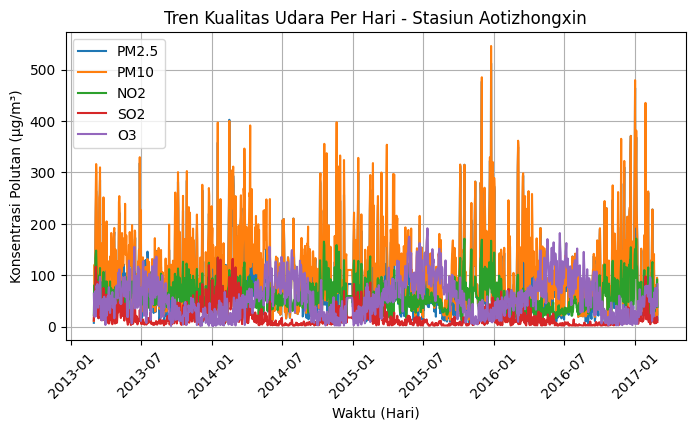

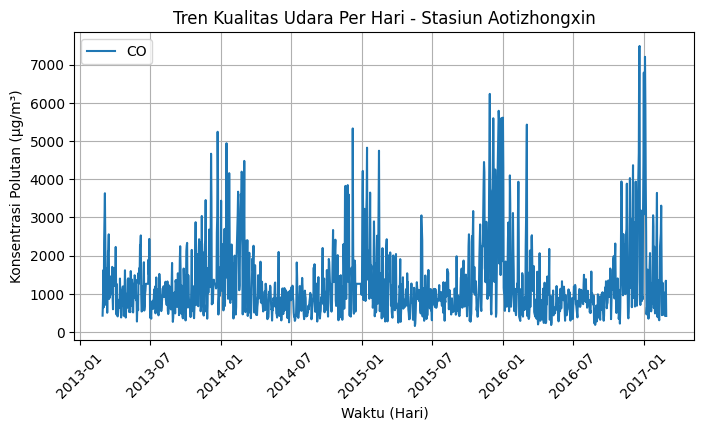

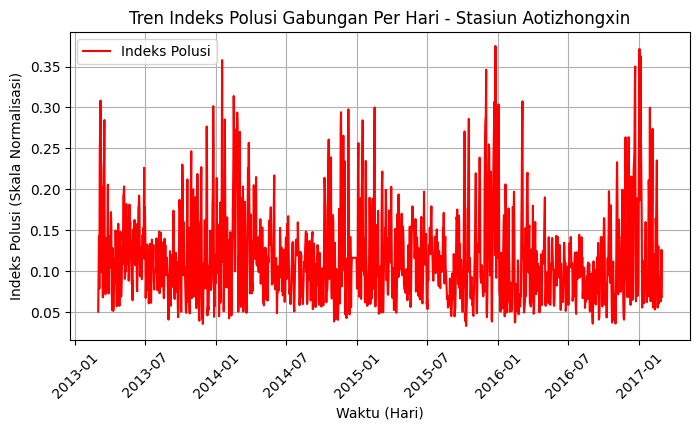

In [74]:
# Visualisasi tren harian untuk polutan utama
plt.figure(figsize=(8, 4))

for pol in pollutants:
    if pol == 'CO':
      continue
    plt.plot(aotizhongxin_daily_pollutants_df.index, aotizhongxin_daily_pollutants_df[pol], label=pol)

plt.xticks(rotation=45)
plt.xlabel('Waktu (Hari)')
plt.ylabel('Konsentrasi Polutan (µg/m³)')
plt.title('Tren Kualitas Udara Per Hari - Stasiun Aotizhongxin')
plt.legend()
plt.grid()
plt.show()

plt.figure(figsize=(8, 4))
plt.plot(aotizhongxin_daily_pollutants_df.index, aotizhongxin_daily_pollutants_df['CO'], label='CO')
plt.xticks(rotation=45)
plt.xlabel('Waktu (Hari)')
plt.ylabel('Konsentrasi Polutan (µg/m³)')
plt.title('Tren Kualitas Udara Per Hari - Stasiun Aotizhongxin')
plt.legend()
plt.grid()
plt.show()

# ==========================================================
from sklearn.preprocessing import MinMaxScaler

# Visualisasi
plt.figure(figsize=(8, 4))
plt.plot(aotizhongxin_daily_pollution_df.index, aotizhongxin_daily_pollution_df, label='Indeks Polusi', color='red')

plt.xticks(rotation=45)
plt.xlabel('Waktu (Hari)')
plt.ylabel('Indeks Polusi (Skala Normalisasi)')
plt.title('Tren Indeks Polusi Gabungan Per Hari - Stasiun Aotizhongxin')
plt.legend()
plt.grid()
plt.show()

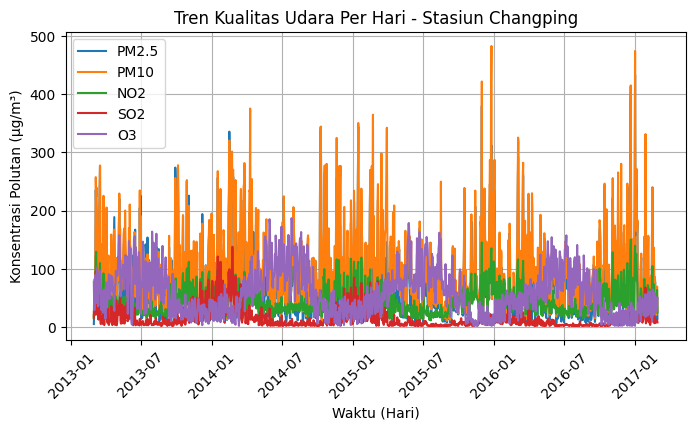

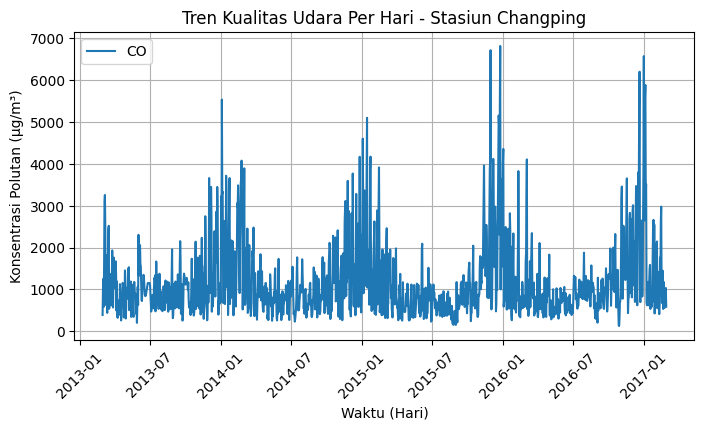

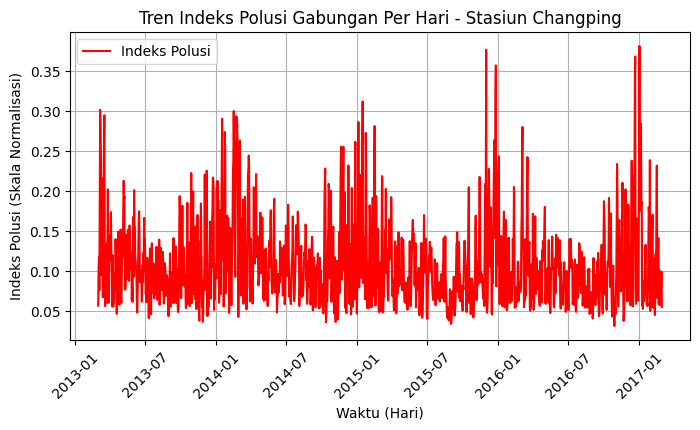

In [75]:
# Visualisasi tren harian untuk polutan utama
plt.figure(figsize=(8, 4))

for pol in pollutants:
    if pol == 'CO':
      continue
    plt.plot(changping_daily_pollutants_df.index, changping_daily_pollutants_df[pol], label=pol)

plt.xticks(rotation=45)
plt.xlabel('Waktu (Hari)')
plt.ylabel('Konsentrasi Polutan (µg/m³)')
plt.title('Tren Kualitas Udara Per Hari - Stasiun Changping')
plt.legend()
plt.grid()
plt.show()

plt.figure(figsize=(8, 4))
plt.plot(changping_daily_pollutants_df.index, changping_daily_pollutants_df['CO'], label='CO')
plt.xticks(rotation=45)
plt.xlabel('Waktu (Hari)')
plt.ylabel('Konsentrasi Polutan (µg/m³)')
plt.title('Tren Kualitas Udara Per Hari - Stasiun Changping')
plt.legend()
plt.grid()
plt.show()
print()


# ==========================================================
from sklearn.preprocessing import MinMaxScaler

# Visualisasi
plt.figure(figsize=(8, 4))
plt.plot(changping_daily_pollution_df.index, changping_daily_pollution_df, label='Indeks Polusi', color='red')

plt.xticks(rotation=45)
plt.xlabel('Waktu (Hari)')
plt.ylabel('Indeks Polusi (Skala Normalisasi)')
plt.title('Tren Indeks Polusi Gabungan Per Hari - Stasiun Changping')
plt.legend()
plt.grid()
plt.show()

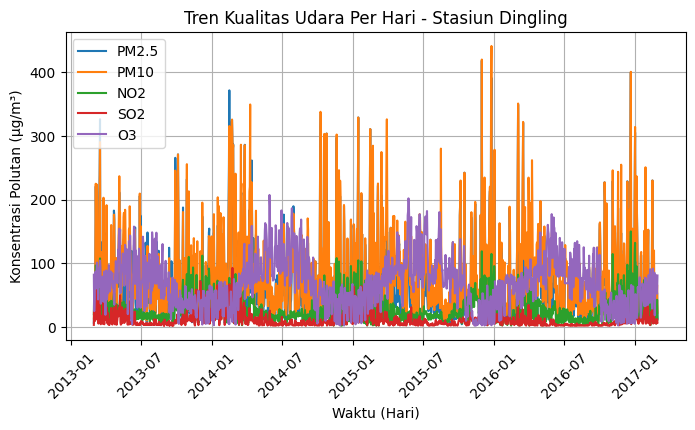

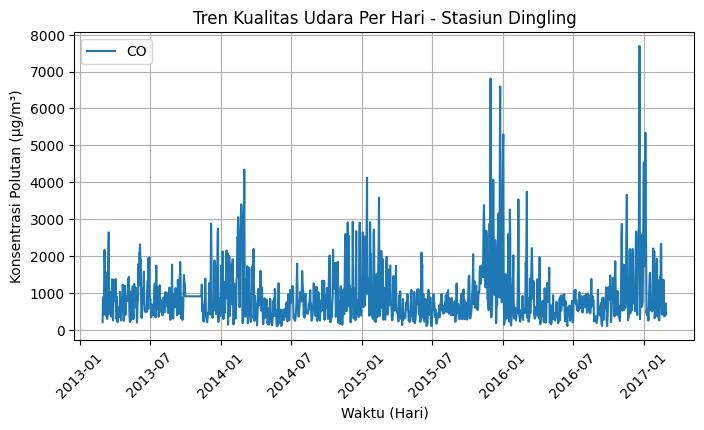

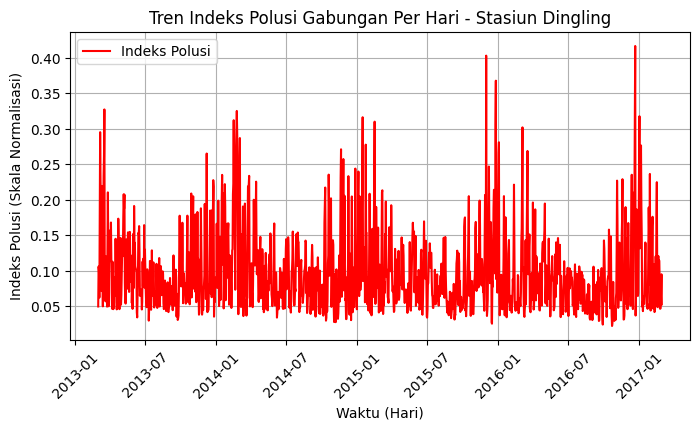

In [76]:
# Visualisasi tren harian untuk polutan utama
plt.figure(figsize=(8, 4))

for pol in pollutants:
    if pol == 'CO':
      continue
    plt.plot(dingling_daily_pollutants_df.index, dingling_daily_pollutants_df[pol], label=pol)

plt.xticks(rotation=45)
plt.xlabel('Waktu (Hari)')
plt.ylabel('Konsentrasi Polutan (µg/m³)')
plt.title('Tren Kualitas Udara Per Hari - Stasiun Dingling')
plt.legend()
plt.grid()
plt.show()

plt.figure(figsize=(8, 4))
plt.plot(dingling_daily_pollutants_df.index, dingling_daily_pollutants_df['CO'], label='CO')
plt.xticks(rotation=45)
plt.xlabel('Waktu (Hari)')
plt.ylabel('Konsentrasi Polutan (µg/m³)')
plt.title('Tren Kualitas Udara Per Hari - Stasiun Dingling')
plt.legend()
plt.grid()
plt.show()
print()
print()

# ==========================================================
from sklearn.preprocessing import MinMaxScaler

# Visualisasi
plt.figure(figsize=(8, 4))
plt.plot(dingling_daily_pollution_df.index, dingling_daily_pollution_df, label='Indeks Polusi', color='red')

plt.xticks(rotation=45)
plt.xlabel('Waktu (Hari)')
plt.ylabel('Indeks Polusi (Skala Normalisasi)')
plt.title('Tren Indeks Polusi Gabungan Per Hari - Stasiun Dingling')
plt.legend()
plt.grid()
plt.show()

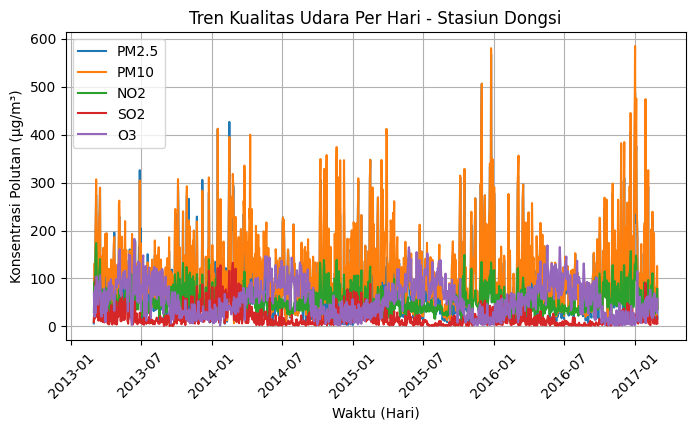

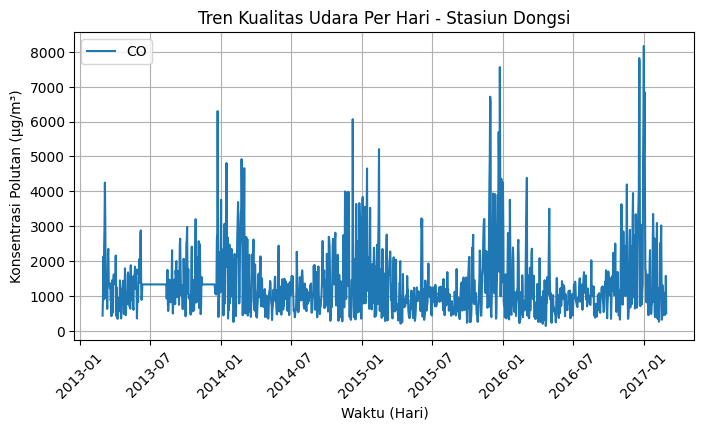

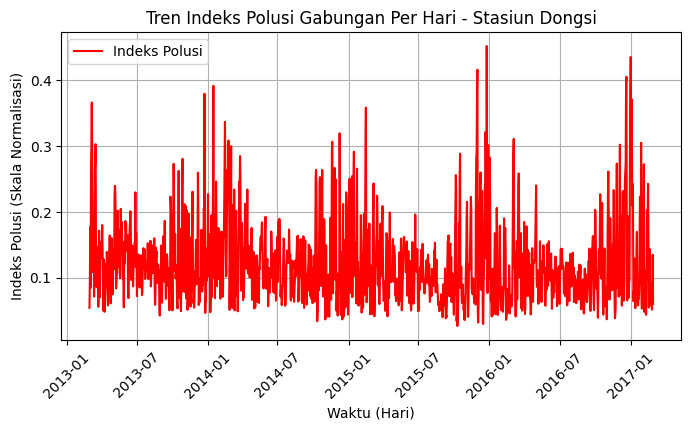

In [77]:
# Visualisasi tren harian untuk polutan utama
plt.figure(figsize=(8, 4))

for pol in pollutants:
    if pol == 'CO':
      continue
    plt.plot(dongsi_daily_pollutants_df.index, dongsi_daily_pollutants_df[pol], label=pol)

plt.xticks(rotation=45)
plt.xlabel('Waktu (Hari)')
plt.ylabel('Konsentrasi Polutan (µg/m³)')
plt.title('Tren Kualitas Udara Per Hari - Stasiun Dongsi')
plt.legend()
plt.grid()
plt.show()

plt.figure(figsize=(8, 4))
plt.plot(dongsi_daily_pollutants_df.index, dongsi_daily_pollutants_df['CO'], label='CO')
plt.xticks(rotation=45)
plt.xlabel('Waktu (Hari)')
plt.ylabel('Konsentrasi Polutan (µg/m³)')
plt.title('Tren Kualitas Udara Per Hari - Stasiun Dongsi')
plt.legend()
plt.grid()
plt.show()
print()
print()

# ==========================================================
from sklearn.preprocessing import MinMaxScaler

# Visualisasi
plt.figure(figsize=(8, 4))
plt.plot(dongsi_daily_pollution_df.index, dongsi_daily_pollution_df, label='Indeks Polusi', color='red')

plt.xticks(rotation=45)
plt.xlabel('Waktu (Hari)')
plt.ylabel('Indeks Polusi (Skala Normalisasi)')
plt.title('Tren Indeks Polusi Gabungan Per Hari - Stasiun Dongsi')
plt.legend()
plt.grid()
plt.show()

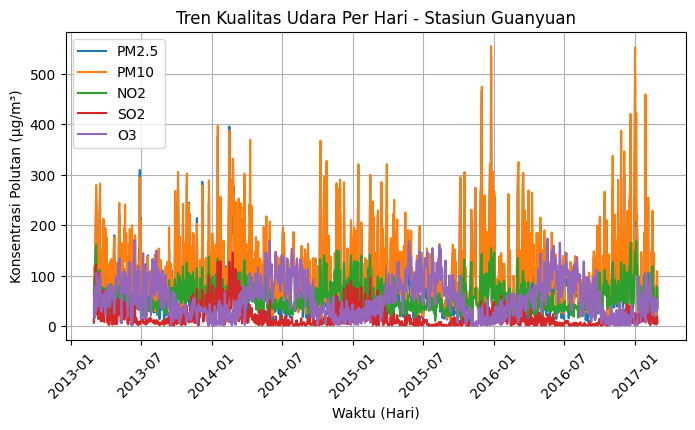

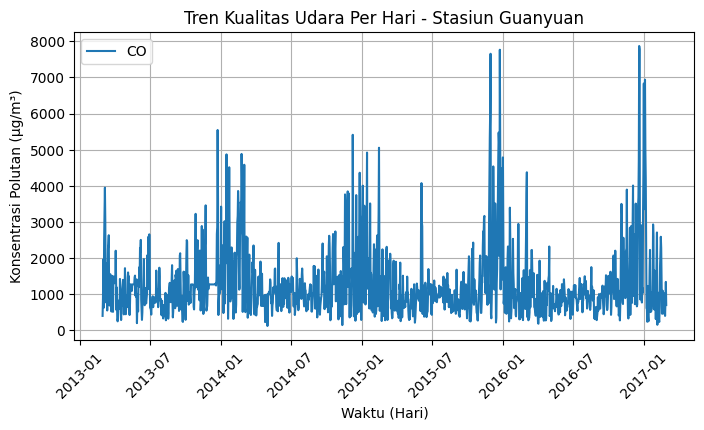

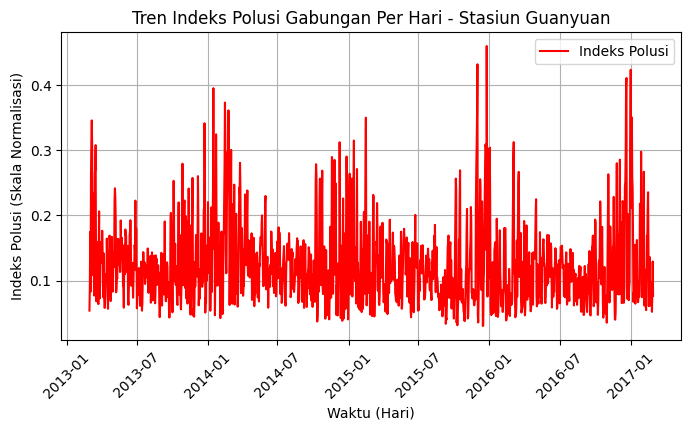

In [78]:
# Visualisasi tren harian untuk polutan utama
plt.figure(figsize=(8, 4))

for pol in pollutants:
    if pol == 'CO':
      continue
    plt.plot(guanyuan_daily_pollutants_df.index, guanyuan_daily_pollutants_df[pol], label=pol)

plt.xticks(rotation=45)
plt.xlabel('Waktu (Hari)')
plt.ylabel('Konsentrasi Polutan (µg/m³)')
plt.title('Tren Kualitas Udara Per Hari - Stasiun Guanyuan')
plt.legend()
plt.grid()
plt.show()

plt.figure(figsize=(8, 4))
plt.plot(guanyuan_daily_pollutants_df.index, guanyuan_daily_pollutants_df['CO'], label='CO')
plt.xticks(rotation=45)
plt.xlabel('Waktu (Hari)')
plt.ylabel('Konsentrasi Polutan (µg/m³)')
plt.title('Tren Kualitas Udara Per Hari - Stasiun Guanyuan')
plt.legend()
plt.grid()
plt.show()
print()
print()

# ==========================================================
from sklearn.preprocessing import MinMaxScaler

# Visualisasi
plt.figure(figsize=(8, 4))
plt.plot(guanyuan_daily_pollution_df.index, guanyuan_daily_pollution_df, label='Indeks Polusi', color='red')

plt.xticks(rotation=45)
plt.xlabel('Waktu (Hari)')
plt.ylabel('Indeks Polusi (Skala Normalisasi)')
plt.title('Tren Indeks Polusi Gabungan Per Hari - Stasiun Guanyuan')
plt.legend()
plt.grid()
plt.show()

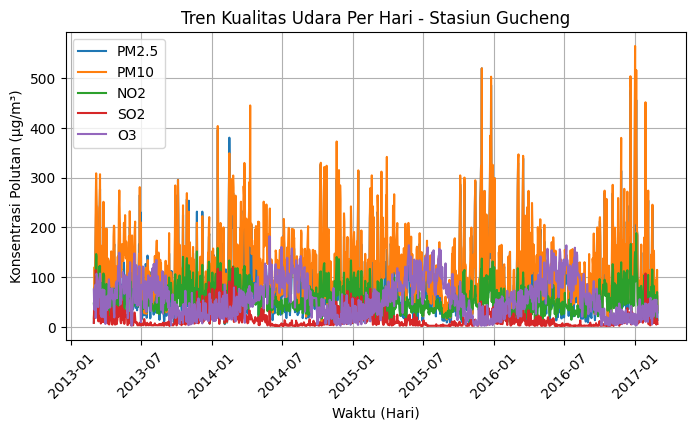

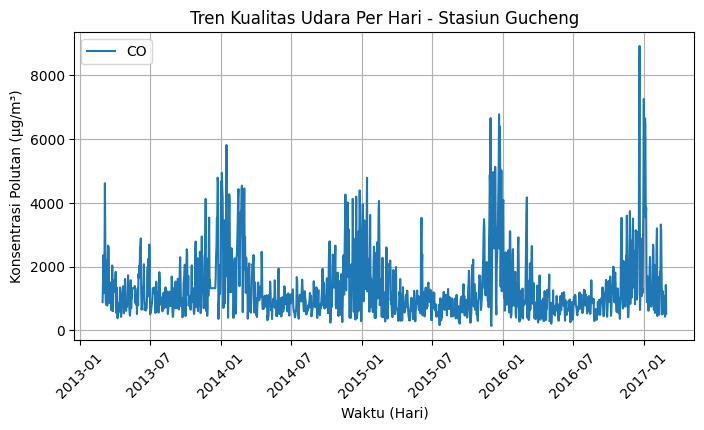

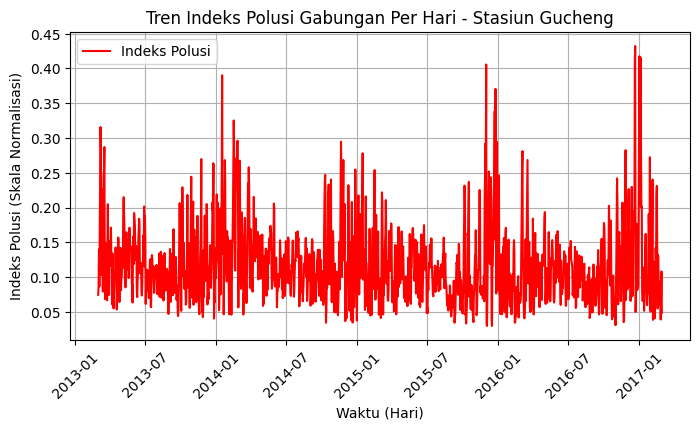

In [79]:
# Visualisasi tren harian untuk polutan utama
plt.figure(figsize=(8, 4))

for pol in pollutants:
    if pol == 'CO':
      continue
    plt.plot(gucheng_daily_pollutants_df.index, gucheng_daily_pollutants_df[pol], label=pol)

plt.xticks(rotation=45)
plt.xlabel('Waktu (Hari)')
plt.ylabel('Konsentrasi Polutan (µg/m³)')
plt.title('Tren Kualitas Udara Per Hari - Stasiun Gucheng')
plt.legend()
plt.grid()
plt.show()

plt.figure(figsize=(8, 4))
plt.plot(gucheng_daily_pollutants_df.index, gucheng_daily_pollutants_df['CO'], label='CO')
plt.xticks(rotation=45)
plt.xlabel('Waktu (Hari)')
plt.ylabel('Konsentrasi Polutan (µg/m³)')
plt.title('Tren Kualitas Udara Per Hari - Stasiun Gucheng')
plt.legend()
plt.grid()
plt.show()
print()
print()

# ==========================================================
from sklearn.preprocessing import MinMaxScaler

# Visualisasi
plt.figure(figsize=(8, 4))
plt.plot(gucheng_daily_pollution_df.index, gucheng_daily_pollution_df, label='Indeks Polusi', color='red')

plt.xticks(rotation=45)
plt.xlabel('Waktu (Hari)')
plt.ylabel('Indeks Polusi (Skala Normalisasi)')
plt.title('Tren Indeks Polusi Gabungan Per Hari - Stasiun Gucheng')
plt.legend()
plt.grid()
plt.show()

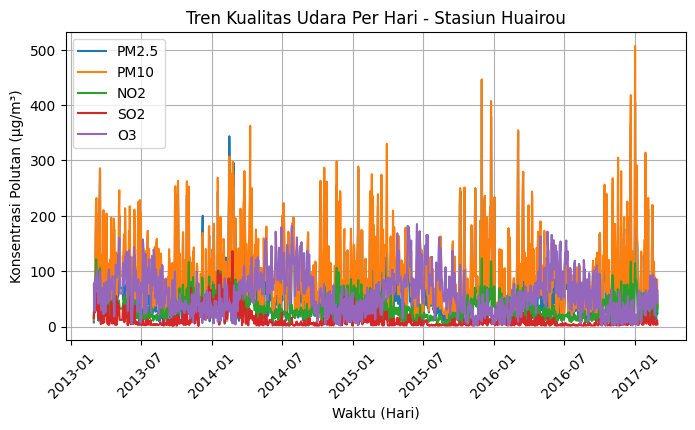

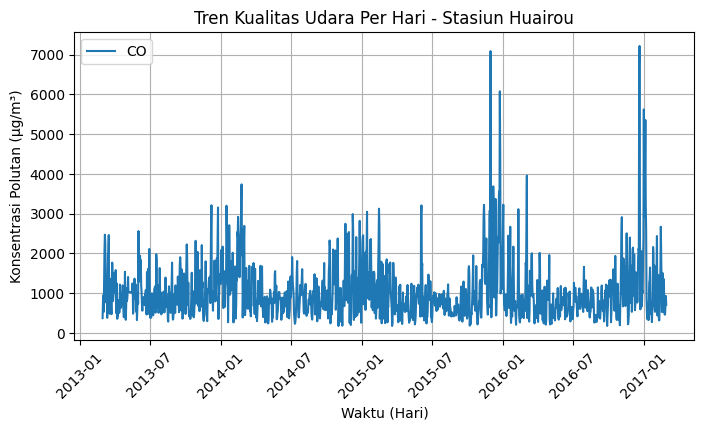

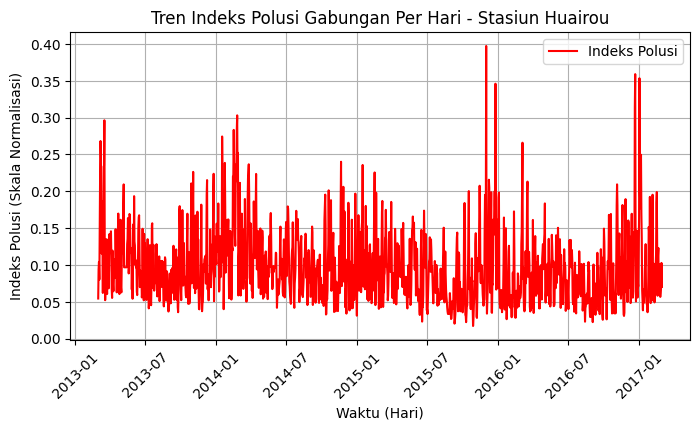

In [80]:
# Visualisasi tren harian untuk polutan utama
plt.figure(figsize=(8, 4))

for pol in pollutants:
    if pol == 'CO':
      continue
    plt.plot(huairou_daily_pollutants_df.index, huairou_daily_pollutants_df[pol], label=pol)

plt.xticks(rotation=45)
plt.xlabel('Waktu (Hari)')
plt.ylabel('Konsentrasi Polutan (µg/m³)')
plt.title('Tren Kualitas Udara Per Hari - Stasiun Huairou')
plt.legend()
plt.grid()
plt.show()

plt.figure(figsize=(8, 4))
plt.plot(huairou_daily_pollutants_df.index, huairou_daily_pollutants_df['CO'], label='CO')
plt.xticks(rotation=45)
plt.xlabel('Waktu (Hari)')
plt.ylabel('Konsentrasi Polutan (µg/m³)')
plt.title('Tren Kualitas Udara Per Hari - Stasiun Huairou')
plt.legend()
plt.grid()
plt.show()
print()
print()

# ==========================================================
from sklearn.preprocessing import MinMaxScaler

# Visualisasi
plt.figure(figsize=(8, 4))
plt.plot(huairou_daily_pollution_df.index, huairou_daily_pollution_df, label='Indeks Polusi', color='red')

plt.xticks(rotation=45)
plt.xlabel('Waktu (Hari)')
plt.ylabel('Indeks Polusi (Skala Normalisasi)')
plt.title('Tren Indeks Polusi Gabungan Per Hari - Stasiun Huairou')
plt.legend()
plt.grid()
plt.show()

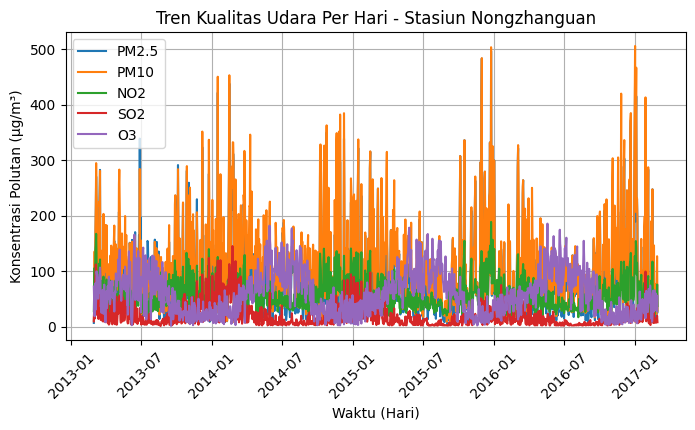

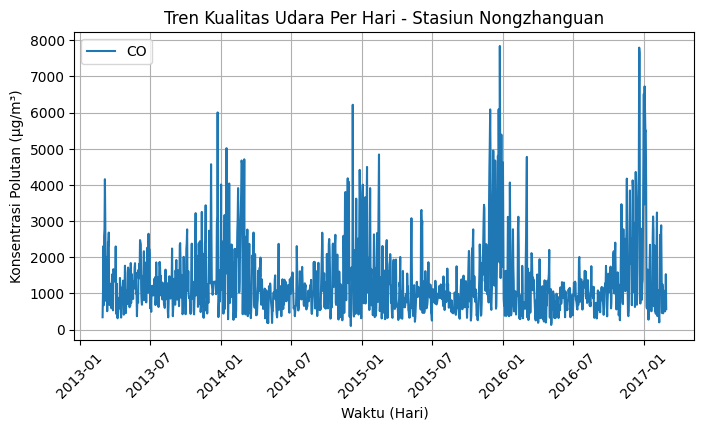

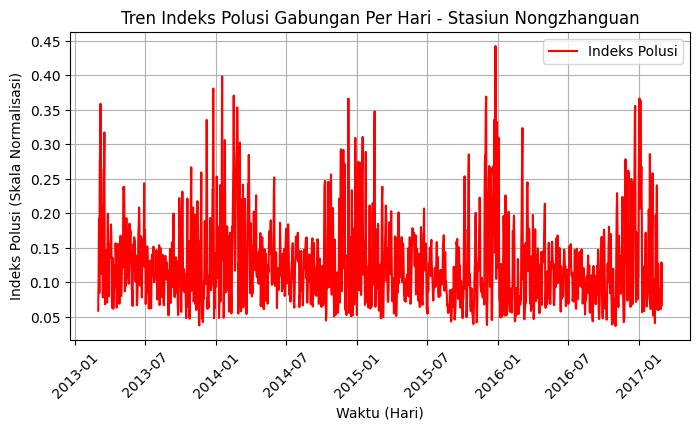

In [81]:
# Visualisasi tren harian untuk polutan utama
plt.figure(figsize=(8, 4))

for pol in pollutants:
    if pol == 'CO':
      continue
    plt.plot(nongzhanguan_daily_pollutants_df.index, nongzhanguan_daily_pollutants_df[pol], label=pol)

plt.xticks(rotation=45)
plt.xlabel('Waktu (Hari)')
plt.ylabel('Konsentrasi Polutan (µg/m³)')
plt.title('Tren Kualitas Udara Per Hari - Stasiun Nongzhanguan')
plt.legend()
plt.grid()
plt.show()

plt.figure(figsize=(8, 4))
plt.plot(nongzhanguan_daily_pollutants_df.index, nongzhanguan_daily_pollutants_df['CO'], label='CO')
plt.xticks(rotation=45)
plt.xlabel('Waktu (Hari)')
plt.ylabel('Konsentrasi Polutan (µg/m³)')
plt.title('Tren Kualitas Udara Per Hari - Stasiun Nongzhanguan')
plt.legend()
plt.grid()
plt.show()
print()
print()

# ==========================================================
from sklearn.preprocessing import MinMaxScaler

# Visualisasi
plt.figure(figsize=(8, 4))
plt.plot(nongzhanguan_daily_pollution_df.index, nongzhanguan_daily_pollution_df, label='Indeks Polusi', color='red')

plt.xticks(rotation=45)
plt.xlabel('Waktu (Hari)')
plt.ylabel('Indeks Polusi (Skala Normalisasi)')
plt.title('Tren Indeks Polusi Gabungan Per Hari - Stasiun Nongzhanguan')
plt.legend()
plt.grid()
plt.show()

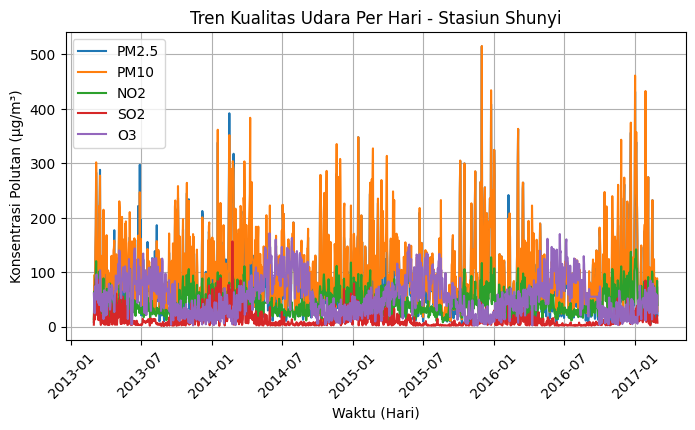

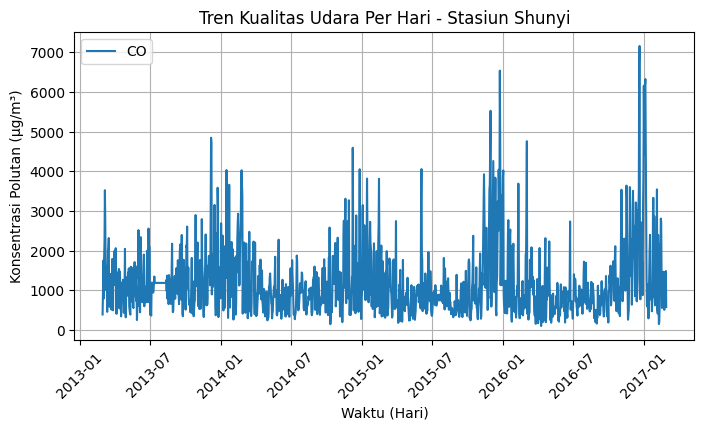

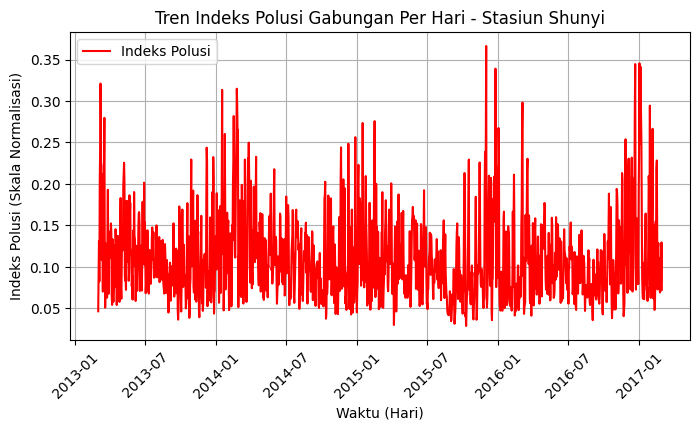

In [82]:
# Visualisasi tren harian untuk polutan utama
plt.figure(figsize=(8, 4))

for pol in pollutants:
    if pol == 'CO':
      continue
    plt.plot(shunyi_daily_pollutants_df.index, shunyi_daily_pollutants_df[pol], label=pol)

plt.xticks(rotation=45)
plt.xlabel('Waktu (Hari)')
plt.ylabel('Konsentrasi Polutan (µg/m³)')
plt.title('Tren Kualitas Udara Per Hari - Stasiun Shunyi')
plt.legend()
plt.grid()
plt.show()

plt.figure(figsize=(8, 4))
plt.plot(shunyi_daily_pollutants_df.index, shunyi_daily_pollutants_df['CO'], label='CO')
plt.xticks(rotation=45)
plt.xlabel('Waktu (Hari)')
plt.ylabel('Konsentrasi Polutan (µg/m³)')
plt.title('Tren Kualitas Udara Per Hari - Stasiun Shunyi')
plt.legend()
plt.grid()
plt.show()
print()
print()

# ==========================================================
from sklearn.preprocessing import MinMaxScaler

# Visualisasi
plt.figure(figsize=(8, 4))
plt.plot(shunyi_daily_pollution_df.index, shunyi_daily_pollution_df, label='Indeks Polusi', color='red')

plt.xticks(rotation=45)
plt.xlabel('Waktu (Hari)')
plt.ylabel('Indeks Polusi (Skala Normalisasi)')
plt.title('Tren Indeks Polusi Gabungan Per Hari - Stasiun Shunyi')
plt.legend()
plt.grid()
plt.show()

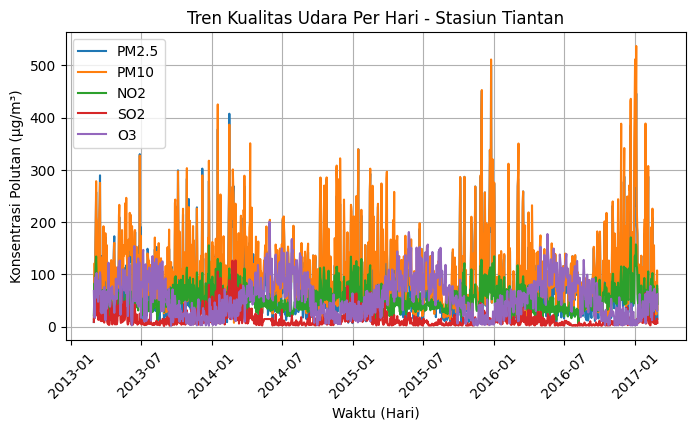

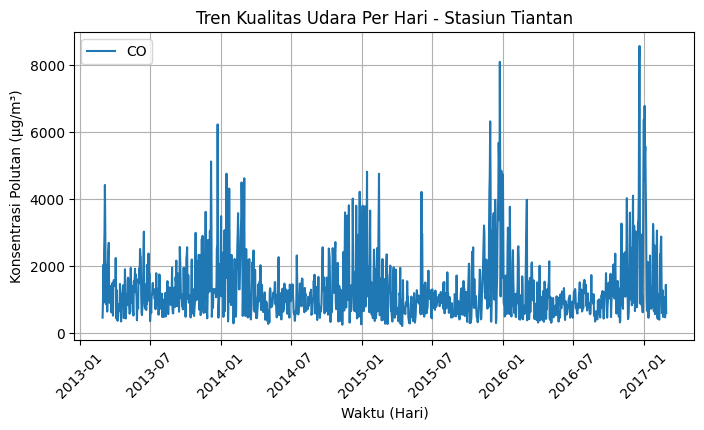

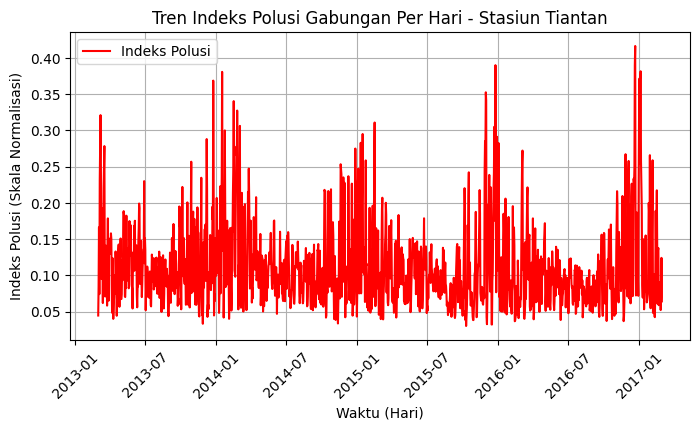

In [83]:
# Visualisasi tren harian untuk polutan utama
plt.figure(figsize=(8, 4))

for pol in pollutants:
    if pol == 'CO':
      continue
    plt.plot(tiantan_daily_pollutants_df.index, tiantan_daily_pollutants_df[pol], label=pol)

plt.xticks(rotation=45)
plt.xlabel('Waktu (Hari)')
plt.ylabel('Konsentrasi Polutan (µg/m³)')
plt.title('Tren Kualitas Udara Per Hari - Stasiun Tiantan')
plt.legend()
plt.grid()
plt.show()

plt.figure(figsize=(8, 4))
plt.plot(tiantan_daily_pollutants_df.index, tiantan_daily_pollutants_df['CO'], label='CO')
plt.xticks(rotation=45)
plt.xlabel('Waktu (Hari)')
plt.ylabel('Konsentrasi Polutan (µg/m³)')
plt.title('Tren Kualitas Udara Per Hari - Stasiun Tiantan')
plt.legend()
plt.grid()
plt.show()
print()
print()

# ==========================================================
from sklearn.preprocessing import MinMaxScaler

# Visualisasi
plt.figure(figsize=(8, 4))
plt.plot(tiantan_daily_pollution_df.index, tiantan_daily_pollution_df, label='Indeks Polusi', color='red')

plt.xticks(rotation=45)
plt.xlabel('Waktu (Hari)')
plt.ylabel('Indeks Polusi (Skala Normalisasi)')
plt.title('Tren Indeks Polusi Gabungan Per Hari - Stasiun Tiantan')
plt.legend()
plt.grid()
plt.show()

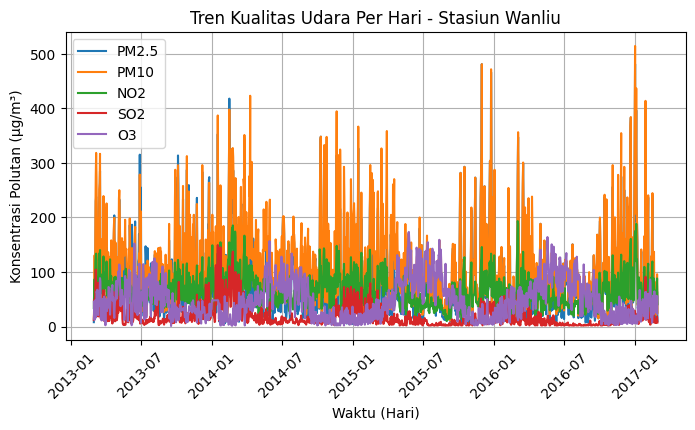

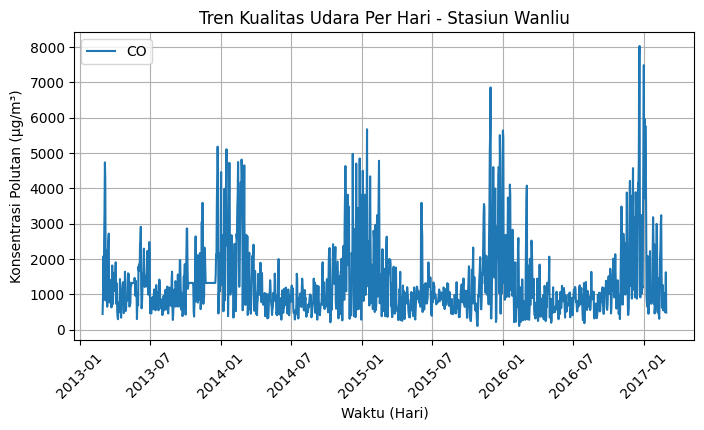

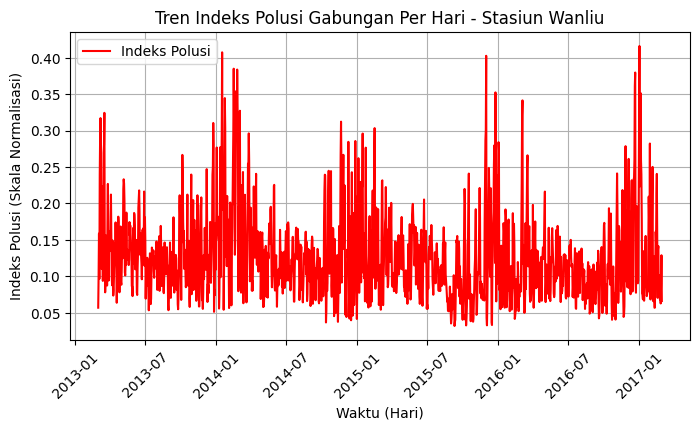

In [84]:
# Visualisasi tren harian untuk polutan utama
plt.figure(figsize=(8, 4))

for pol in pollutants:
    if pol == 'CO':
      continue
    plt.plot(wanliu_daily_pollutants_df.index, wanliu_daily_pollutants_df[pol], label=pol)

plt.xticks(rotation=45)
plt.xlabel('Waktu (Hari)')
plt.ylabel('Konsentrasi Polutan (µg/m³)')
plt.title('Tren Kualitas Udara Per Hari - Stasiun Wanliu')
plt.legend()
plt.grid()
plt.show()

plt.figure(figsize=(8, 4))
plt.plot(wanliu_daily_pollutants_df.index, wanliu_daily_pollutants_df['CO'], label='CO')
plt.xticks(rotation=45)
plt.xlabel('Waktu (Hari)')
plt.ylabel('Konsentrasi Polutan (µg/m³)')
plt.title('Tren Kualitas Udara Per Hari - Stasiun Wanliu')
plt.legend()
plt.grid()
plt.show()
print()
print()

# ==========================================================
from sklearn.preprocessing import MinMaxScaler

# Visualisasi
plt.figure(figsize=(8, 4))
plt.plot(wanliu_daily_pollution_df.index, wanliu_daily_pollution_df, label='Indeks Polusi', color='red')

plt.xticks(rotation=45)
plt.xlabel('Waktu (Hari)')
plt.ylabel('Indeks Polusi (Skala Normalisasi)')
plt.title('Tren Indeks Polusi Gabungan Per Hari - Stasiun Wanliu')
plt.legend()
plt.grid()
plt.show()

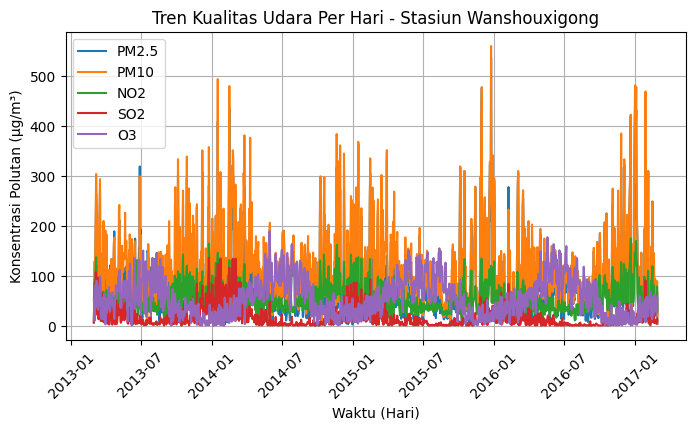

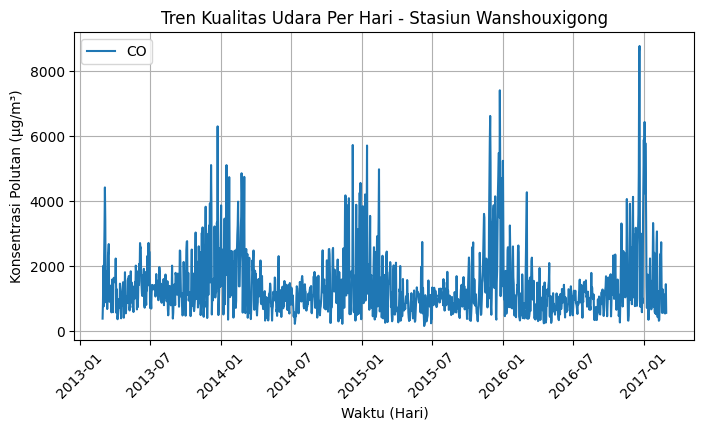

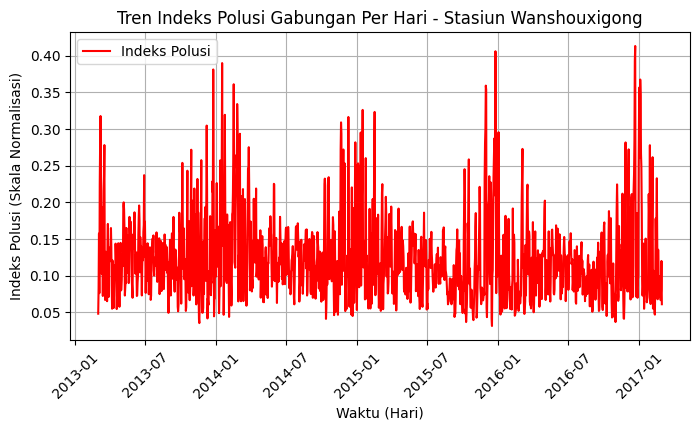

In [85]:
# Visualisasi tren harian untuk polutan utama
plt.figure(figsize=(8, 4))

for pol in pollutants:
    if pol == 'CO':
      continue
    plt.plot(wanshouxigong_daily_pollutants_df.index, wanshouxigong_daily_pollutants_df[pol], label=pol)

plt.xticks(rotation=45)
plt.xlabel('Waktu (Hari)')
plt.ylabel('Konsentrasi Polutan (µg/m³)')
plt.title('Tren Kualitas Udara Per Hari - Stasiun Wanshouxigong')
plt.legend()
plt.grid()
plt.show()

plt.figure(figsize=(8, 4))
plt.plot(wanshouxigong_daily_pollutants_df.index, wanshouxigong_daily_pollutants_df['CO'], label='CO')
plt.xticks(rotation=45)
plt.xlabel('Waktu (Hari)')
plt.ylabel('Konsentrasi Polutan (µg/m³)')
plt.title('Tren Kualitas Udara Per Hari - Stasiun Wanshouxigong')
plt.legend()
plt.grid()
plt.show()
print()
print()

# ==========================================================
from sklearn.preprocessing import MinMaxScaler

# Visualisasi
plt.figure(figsize=(8, 4))
plt.plot(wanshouxigong_daily_pollution_df.index, wanshouxigong_daily_pollution_df, label='Indeks Polusi', color='red')

plt.xticks(rotation=45)
plt.xlabel('Waktu (Hari)')
plt.ylabel('Indeks Polusi (Skala Normalisasi)')
plt.title('Tren Indeks Polusi Gabungan Per Hari - Stasiun Wanshouxigong')
plt.legend()
plt.grid()
plt.show()

### Pertanyaan 2: Apakah ada pola polusi udara berdasarkan jam dalam sehari?

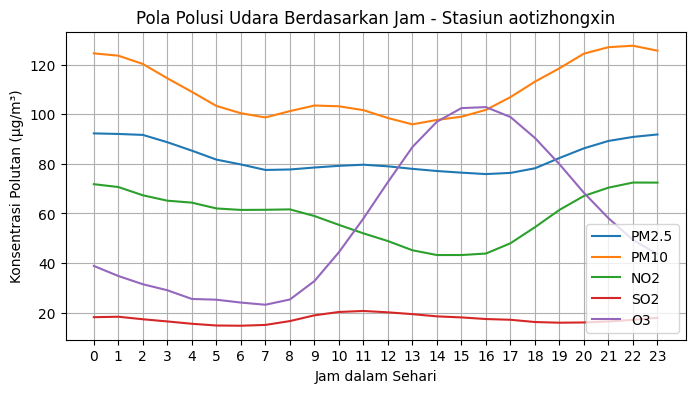

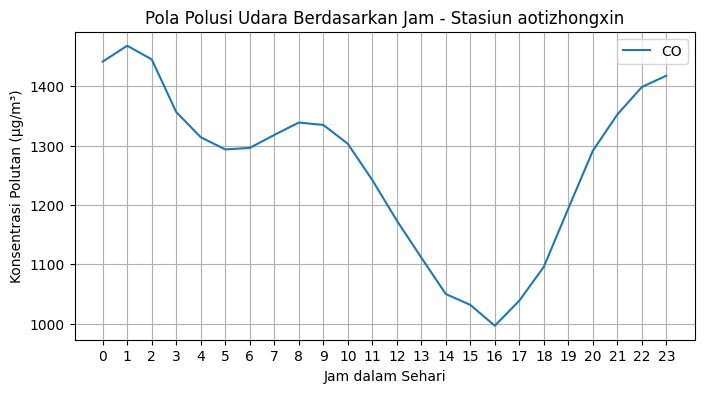

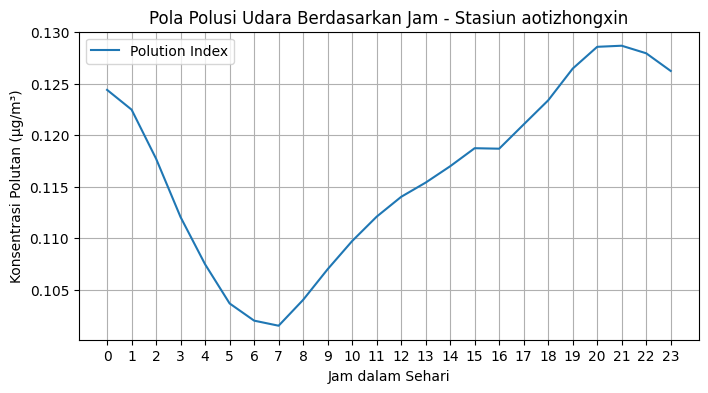

In [86]:
plt.figure(figsize=(8, 4))
pollutants = ['PM2.5', 'PM10', 'NO2', 'SO2', 'CO','O3']

for pol in pollutants:
    if pol == 'CO':
      continue
    plt.plot(aotizhongxin_hourly_pollutants_df.index, aotizhongxin_hourly_pollutants_df[pol], label=pol)

plt.xticks(range(0, 24, 1))  # Tampilkan setiap jam
plt.xlabel("Jam dalam Sehari")
plt.ylabel("Konsentrasi Polutan (µg/m³)")
plt.title("Pola Polusi Udara Berdasarkan Jam - Stasiun aotizhongxin")
plt.legend()
plt.grid()
plt.show()

plt.figure(figsize=(8, 4))
plt.plot(aotizhongxin_hourly_pollutants_df.index, aotizhongxin_hourly_pollutants_df['CO'],label='CO')
plt.xticks(range(0, 24, 1))  # Tampilkan setiap jam
plt.xlabel("Jam dalam Sehari")
plt.ylabel("Konsentrasi Polutan (µg/m³)")
plt.title("Pola Polusi Udara Berdasarkan Jam - Stasiun aotizhongxin")
plt.legend()
plt.grid()
plt.show()

# Rata-rata polusi keseluruhan
aotizhongxin_hourly_pollution_df = aotizhongxin_df.groupby('hour')['pollution_index'].mean()

plt.figure(figsize=(8, 4))
plt.plot(aotizhongxin_hourly_pollution_df.index, aotizhongxin_hourly_pollution_df ,label='Polution Index')
plt.xticks(range(0, 24, 1))  # Tampilkan setiap jam
plt.xlabel("Jam dalam Sehari")
plt.ylabel("Konsentrasi Polutan (µg/m³)")
plt.title("Pola Polusi Udara Berdasarkan Jam - Stasiun aotizhongxin")
plt.legend()
plt.grid()
plt.show()

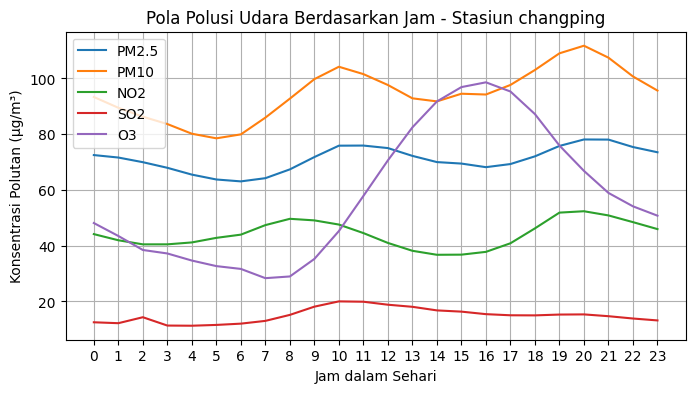

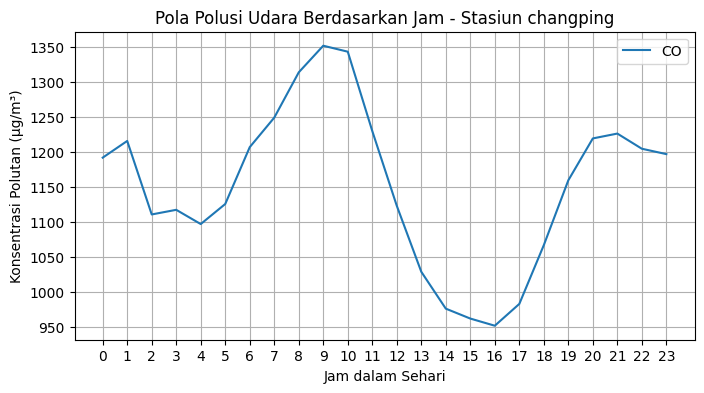

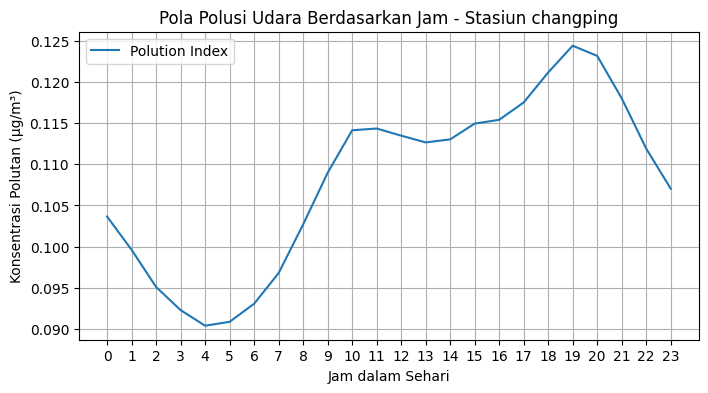

In [87]:
plt.figure(figsize=(8, 4))
pollutants = ['PM2.5', 'PM10', 'NO2', 'SO2', 'CO','O3']

for pol in pollutants:
    if pol == 'CO':
      continue
    plt.plot(changping_hourly_pollutants_df.index, changping_hourly_pollutants_df[pol], label=pol)

plt.xticks(range(0, 24, 1))  # Tampilkan setiap jam
plt.xlabel("Jam dalam Sehari")
plt.ylabel("Konsentrasi Polutan (µg/m³)")
plt.title("Pola Polusi Udara Berdasarkan Jam - Stasiun changping")
plt.legend()
plt.grid()
plt.show()

plt.figure(figsize=(8, 4))
plt.plot(changping_hourly_pollutants_df.index, changping_hourly_pollutants_df['CO'],label='CO')
plt.xticks(range(0, 24, 1))  # Tampilkan setiap jam
plt.xlabel("Jam dalam Sehari")
plt.ylabel("Konsentrasi Polutan (µg/m³)")
plt.title("Pola Polusi Udara Berdasarkan Jam - Stasiun changping")
plt.legend()
plt.grid()
plt.show()

# Rata-rata polusi keseluruhan
changping_hourly_pollution_df = changping_df.groupby('hour')['pollution_index'].mean()

plt.figure(figsize=(8, 4))
plt.plot(changping_hourly_pollution_df.index, changping_hourly_pollution_df ,label='Polution Index')
plt.xticks(range(0, 24, 1))  # Tampilkan setiap jam
plt.xlabel("Jam dalam Sehari")
plt.ylabel("Konsentrasi Polutan (µg/m³)")
plt.title("Pola Polusi Udara Berdasarkan Jam - Stasiun changping")
plt.legend()
plt.grid()
plt.show()

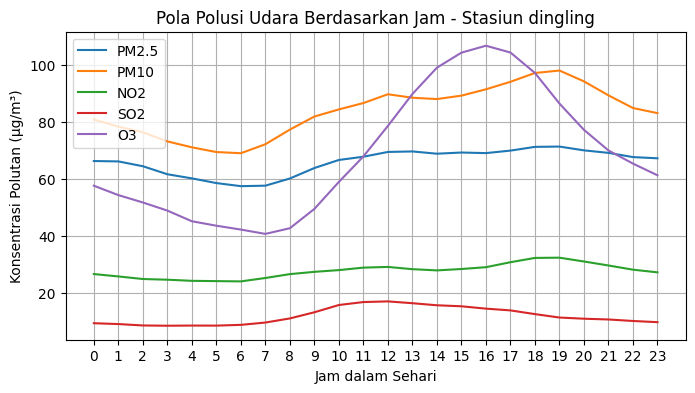

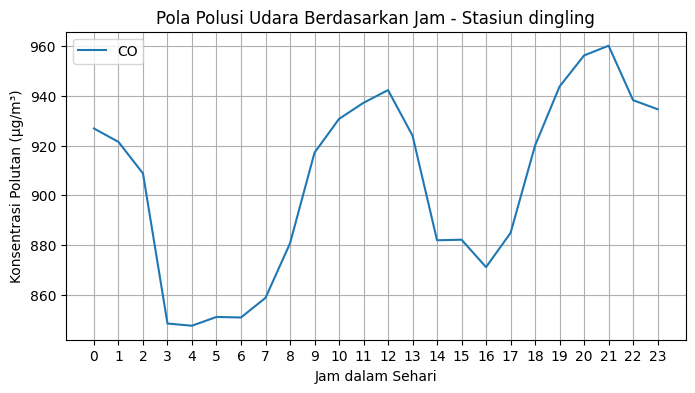

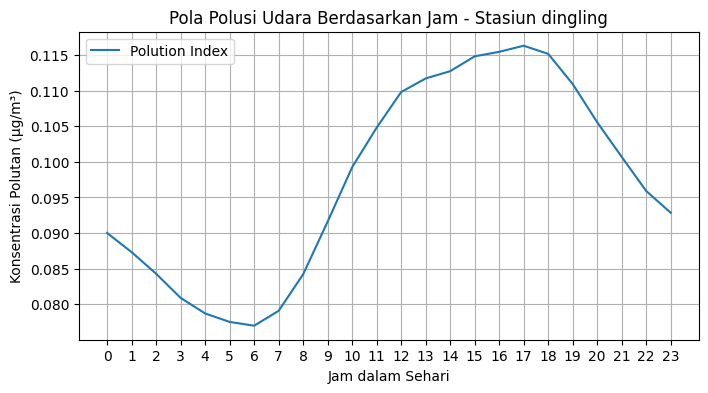

In [88]:
plt.figure(figsize=(8, 4))
pollutants = ['PM2.5', 'PM10', 'NO2', 'SO2', 'CO','O3']

for pol in pollutants:
    if pol == 'CO':
      continue
    plt.plot(dingling_hourly_pollutants_df.index, dingling_hourly_pollutants_df[pol], label=pol)

plt.xticks(range(0, 24, 1))  # Tampilkan setiap jam
plt.xlabel("Jam dalam Sehari")
plt.ylabel("Konsentrasi Polutan (µg/m³)")
plt.title("Pola Polusi Udara Berdasarkan Jam - Stasiun dingling")
plt.legend()
plt.grid()
plt.show()

plt.figure(figsize=(8, 4))
plt.plot(dingling_hourly_pollutants_df.index, dingling_hourly_pollutants_df['CO'],label='CO')
plt.xticks(range(0, 24, 1))  # Tampilkan setiap jam
plt.xlabel("Jam dalam Sehari")
plt.ylabel("Konsentrasi Polutan (µg/m³)")
plt.title("Pola Polusi Udara Berdasarkan Jam - Stasiun dingling")
plt.legend()
plt.grid()
plt.show()


# Rata-rata polusi keseluruhan
dingling_hourly_pollution_df = dingling_df.groupby('hour')['pollution_index'].mean()

plt.figure(figsize=(8, 4))
plt.plot(dingling_hourly_pollution_df.index, dingling_hourly_pollution_df ,label='Polution Index')
plt.xticks(range(0, 24, 1))  # Tampilkan setiap jam
plt.xlabel("Jam dalam Sehari")
plt.ylabel("Konsentrasi Polutan (µg/m³)")
plt.title("Pola Polusi Udara Berdasarkan Jam - Stasiun dingling")
plt.legend()
plt.grid()
plt.show()

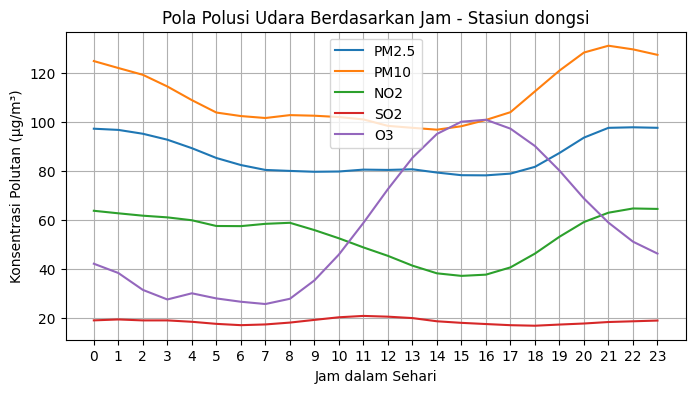

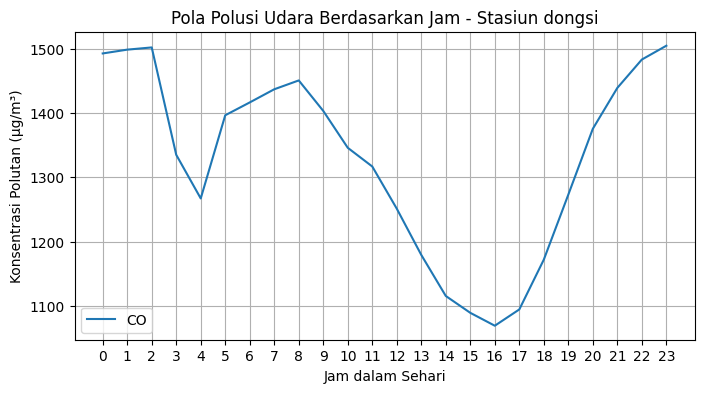

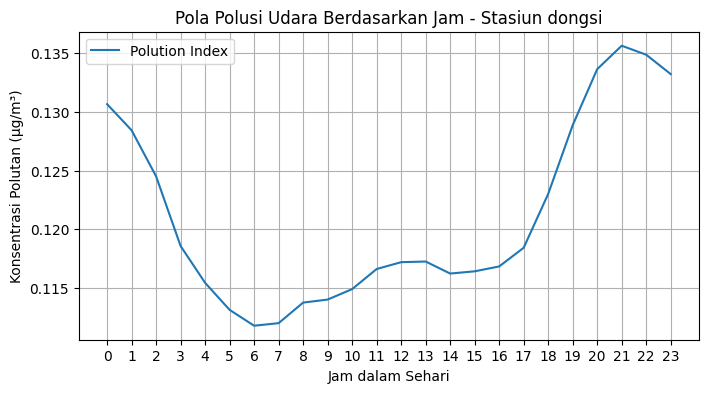

In [89]:
plt.figure(figsize=(8, 4))
pollutants = ['PM2.5', 'PM10', 'NO2', 'SO2', 'CO','O3']

for pol in pollutants:
    if pol == 'CO':
      continue
    plt.plot(dongsi_hourly_pollutants_df.index, dongsi_hourly_pollutants_df[pol], label=pol)

plt.xticks(range(0, 24, 1))  # Tampilkan setiap jam
plt.xlabel("Jam dalam Sehari")
plt.ylabel("Konsentrasi Polutan (µg/m³)")
plt.title("Pola Polusi Udara Berdasarkan Jam - Stasiun dongsi")
plt.legend()
plt.grid()
plt.show()

plt.figure(figsize=(8, 4))
plt.plot(dongsi_hourly_pollutants_df.index, dongsi_hourly_pollutants_df['CO'],label='CO')
plt.xticks(range(0, 24, 1))  # Tampilkan setiap jam
plt.xlabel("Jam dalam Sehari")
plt.ylabel("Konsentrasi Polutan (µg/m³)")
plt.title("Pola Polusi Udara Berdasarkan Jam - Stasiun dongsi")
plt.legend()
plt.grid()
plt.show()


# Rata-rata polusi keseluruhan
dongsi_hourly_pollution_df = dongsi_df.groupby('hour')['pollution_index'].mean()

plt.figure(figsize=(8, 4))
plt.plot(dongsi_hourly_pollution_df.index, dongsi_hourly_pollution_df ,label='Polution Index')
plt.xticks(range(0, 24, 1))  # Tampilkan setiap jam
plt.xlabel("Jam dalam Sehari")
plt.ylabel("Konsentrasi Polutan (µg/m³)")
plt.title("Pola Polusi Udara Berdasarkan Jam - Stasiun dongsi")
plt.legend()
plt.grid()
plt.show()

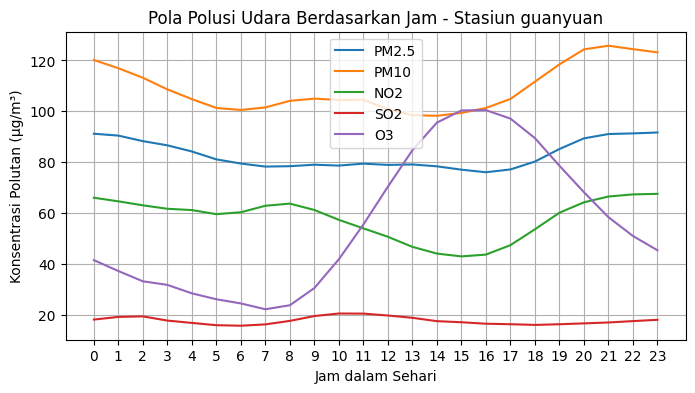

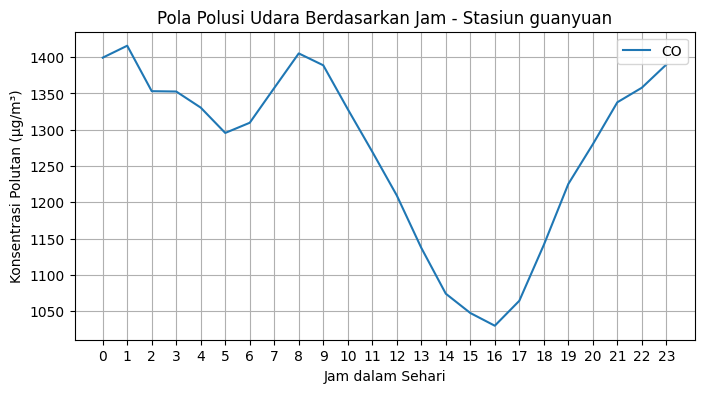

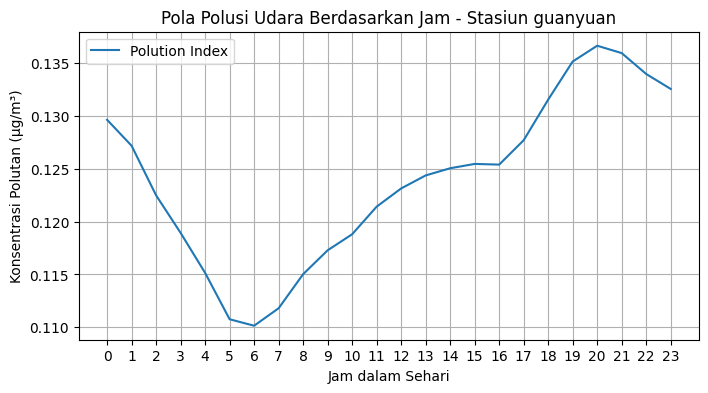

In [90]:
plt.figure(figsize=(8, 4))
pollutants = ['PM2.5', 'PM10', 'NO2', 'SO2', 'CO','O3']

for pol in pollutants:
    if pol == 'CO':
      continue
    plt.plot(guanyuan_hourly_pollutants_df.index, guanyuan_hourly_pollutants_df[pol], label=pol)

plt.xticks(range(0, 24, 1))  # Tampilkan setiap jam
plt.xlabel("Jam dalam Sehari")
plt.ylabel("Konsentrasi Polutan (µg/m³)")
plt.title("Pola Polusi Udara Berdasarkan Jam - Stasiun guanyuan")
plt.legend()
plt.grid()
plt.show()

plt.figure(figsize=(8, 4))
plt.plot(guanyuan_hourly_pollutants_df.index, guanyuan_hourly_pollutants_df['CO'],label='CO')
plt.xticks(range(0, 24, 1))  # Tampilkan setiap jam
plt.xlabel("Jam dalam Sehari")
plt.ylabel("Konsentrasi Polutan (µg/m³)")
plt.title("Pola Polusi Udara Berdasarkan Jam - Stasiun guanyuan")
plt.legend()
plt.grid()
plt.show()


# Rata-rata polusi keseluruhan
guanyuan_hourly_pollution_df = guanyuan_df.groupby('hour')['pollution_index'].mean()

plt.figure(figsize=(8, 4))
plt.plot(guanyuan_hourly_pollution_df.index, guanyuan_hourly_pollution_df ,label='Polution Index')
plt.xticks(range(0, 24, 1))  # Tampilkan setiap jam
plt.xlabel("Jam dalam Sehari")
plt.ylabel("Konsentrasi Polutan (µg/m³)")
plt.title("Pola Polusi Udara Berdasarkan Jam - Stasiun guanyuan")
plt.legend()
plt.grid()
plt.show()

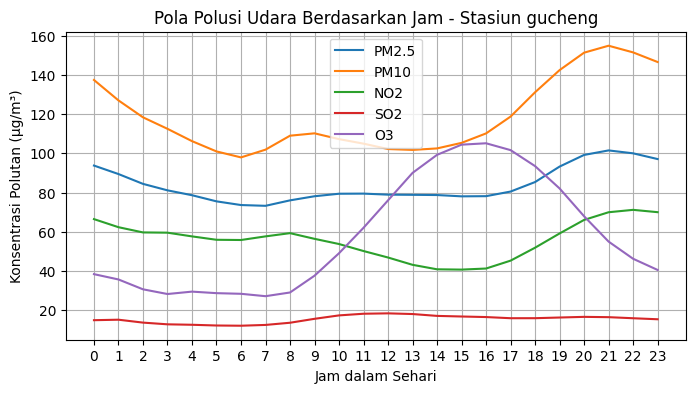

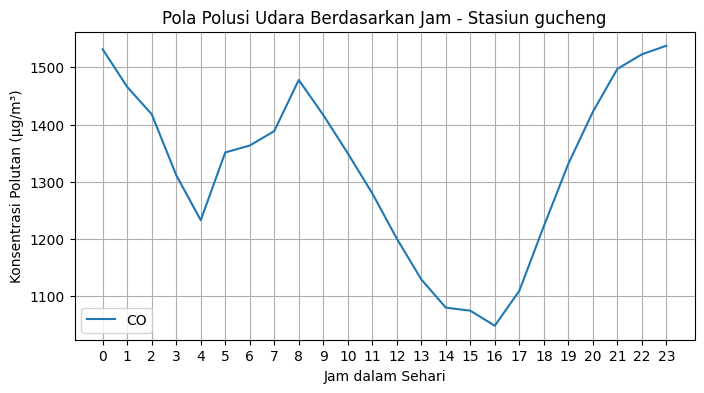

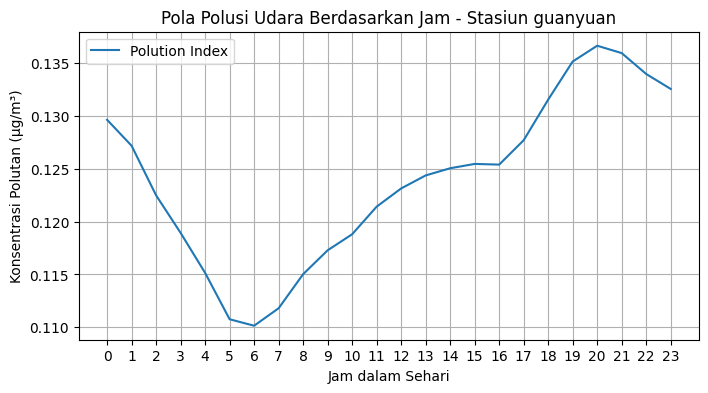

In [91]:
plt.figure(figsize=(8, 4))
pollutants = ['PM2.5', 'PM10', 'NO2', 'SO2', 'CO','O3']

for pol in pollutants:
    if pol == 'CO':
      continue
    plt.plot(gucheng_hourly_pollutants_df.index, gucheng_hourly_pollutants_df[pol], label=pol)

plt.xticks(range(0, 24, 1))  # Tampilkan setiap jam
plt.xlabel("Jam dalam Sehari")
plt.ylabel("Konsentrasi Polutan (µg/m³)")
plt.title("Pola Polusi Udara Berdasarkan Jam - Stasiun gucheng")
plt.legend()
plt.grid()
plt.show()

plt.figure(figsize=(8, 4))
plt.plot(gucheng_hourly_pollutants_df.index, gucheng_hourly_pollutants_df['CO'],label='CO')
plt.xticks(range(0, 24, 1))  # Tampilkan setiap jam
plt.xlabel("Jam dalam Sehari")
plt.ylabel("Konsentrasi Polutan (µg/m³)")
plt.title("Pola Polusi Udara Berdasarkan Jam - Stasiun gucheng")
plt.legend()
plt.grid()
plt.show()


# Rata-rata polusi keseluruhan
guanyuan_hourly_pollution_df = guanyuan_df.groupby('hour')['pollution_index'].mean()

plt.figure(figsize=(8, 4))
plt.plot(guanyuan_hourly_pollution_df.index, guanyuan_hourly_pollution_df ,label='Polution Index')
plt.xticks(range(0, 24, 1))  # Tampilkan setiap jam
plt.xlabel("Jam dalam Sehari")
plt.ylabel("Konsentrasi Polutan (µg/m³)")
plt.title("Pola Polusi Udara Berdasarkan Jam - Stasiun guanyuan")
plt.legend()
plt.grid()
plt.show()

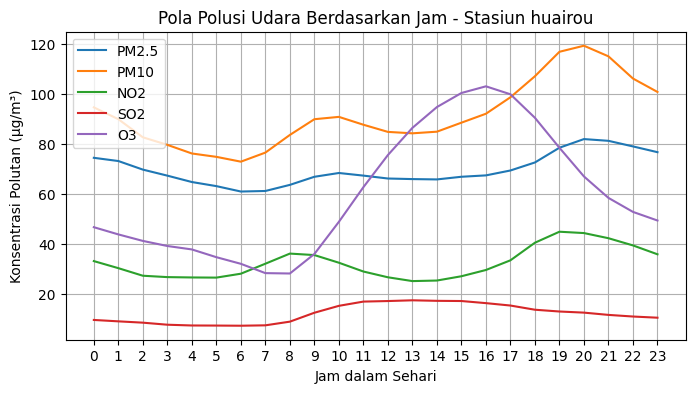

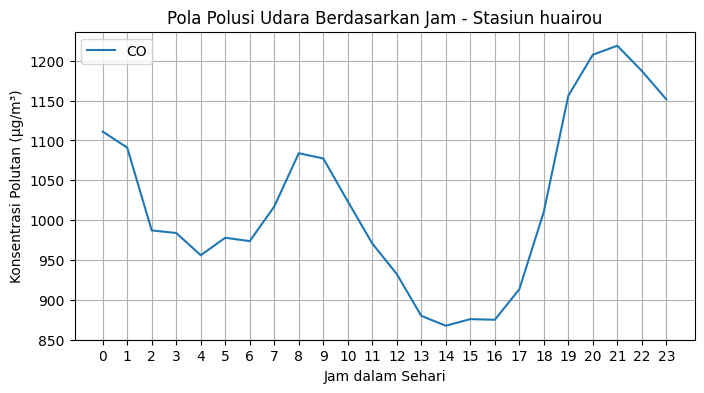

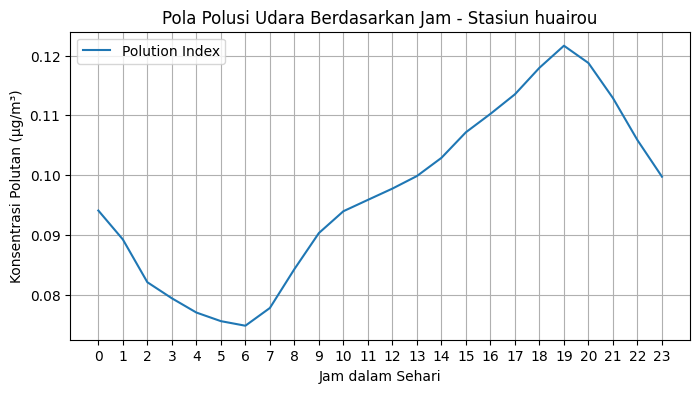

In [92]:
plt.figure(figsize=(8, 4))
pollutants = ['PM2.5', 'PM10', 'NO2', 'SO2', 'CO','O3']

for pol in pollutants:
    if pol == 'CO':
      continue
    plt.plot(huairou_hourly_pollutants_df.index, huairou_hourly_pollutants_df[pol], label=pol)

plt.xticks(range(0, 24, 1))  # Tampilkan setiap jam
plt.xlabel("Jam dalam Sehari")
plt.ylabel("Konsentrasi Polutan (µg/m³)")
plt.title("Pola Polusi Udara Berdasarkan Jam - Stasiun huairou")
plt.legend()
plt.grid()
plt.show()

plt.figure(figsize=(8, 4))
plt.plot(huairou_hourly_pollutants_df.index, huairou_hourly_pollutants_df['CO'],label='CO')
plt.xticks(range(0, 24, 1))  # Tampilkan setiap jam
plt.xlabel("Jam dalam Sehari")
plt.ylabel("Konsentrasi Polutan (µg/m³)")
plt.title("Pola Polusi Udara Berdasarkan Jam - Stasiun huairou")
plt.legend()
plt.grid()
plt.show()


# Rata-rata polusi keseluruhan
huairou_hourly_pollution_df = huairou_df.groupby('hour')['pollution_index'].mean()

plt.figure(figsize=(8, 4))
plt.plot(huairou_hourly_pollution_df.index, huairou_hourly_pollution_df ,label='Polution Index')
plt.xticks(range(0, 24, 1))  # Tampilkan setiap jam
plt.xlabel("Jam dalam Sehari")
plt.ylabel("Konsentrasi Polutan (µg/m³)")
plt.title("Pola Polusi Udara Berdasarkan Jam - Stasiun huairou")
plt.legend()
plt.grid()
plt.show()

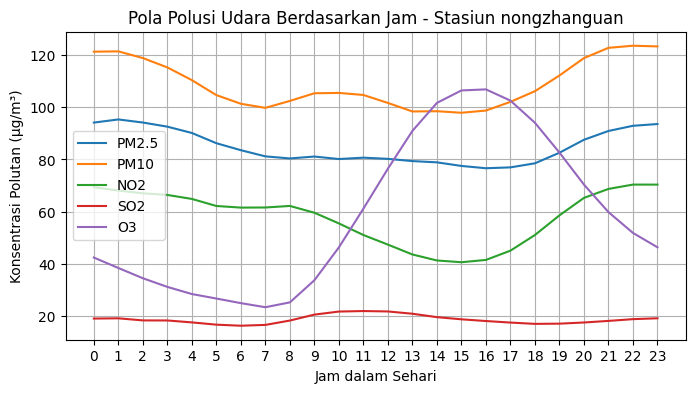

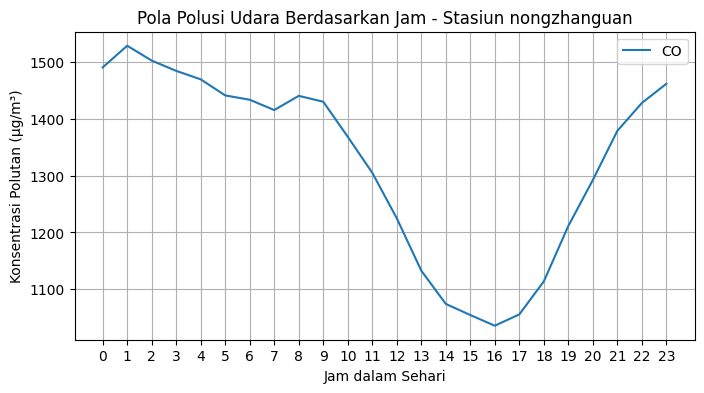

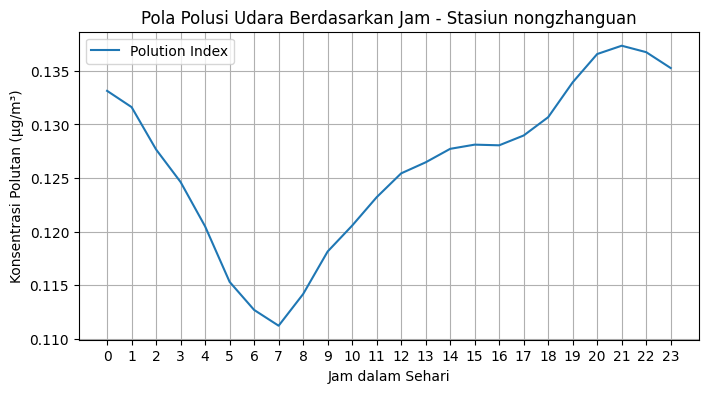

In [93]:
plt.figure(figsize=(8, 4))
pollutants = ['PM2.5', 'PM10', 'NO2', 'SO2', 'CO','O3']

for pol in pollutants:
    if pol == 'CO':
      continue
    plt.plot(nongzhanguan_hourly_pollutants_df.index, nongzhanguan_hourly_pollutants_df[pol], label=pol)

plt.xticks(range(0, 24, 1))  # Tampilkan setiap jam
plt.xlabel("Jam dalam Sehari")
plt.ylabel("Konsentrasi Polutan (µg/m³)")
plt.title("Pola Polusi Udara Berdasarkan Jam - Stasiun nongzhanguan")
plt.legend()
plt.grid()
plt.show()

plt.figure(figsize=(8, 4))
plt.plot(nongzhanguan_hourly_pollutants_df.index, nongzhanguan_hourly_pollutants_df['CO'],label='CO')
plt.xticks(range(0, 24, 1))  # Tampilkan setiap jam
plt.xlabel("Jam dalam Sehari")
plt.ylabel("Konsentrasi Polutan (µg/m³)")
plt.title("Pola Polusi Udara Berdasarkan Jam - Stasiun nongzhanguan")
plt.legend()
plt.grid()
plt.show()


# Rata-rata polusi keseluruhan
nongzhanguan_hourly_pollution_df = nongzhanguan_df.groupby('hour')['pollution_index'].mean()

plt.figure(figsize=(8, 4))
plt.plot(nongzhanguan_hourly_pollution_df.index, nongzhanguan_hourly_pollution_df ,label='Polution Index')
plt.xticks(range(0, 24, 1))  # Tampilkan setiap jam
plt.xlabel("Jam dalam Sehari")
plt.ylabel("Konsentrasi Polutan (µg/m³)")
plt.title("Pola Polusi Udara Berdasarkan Jam - Stasiun nongzhanguan")
plt.legend()
plt.grid()
plt.show()

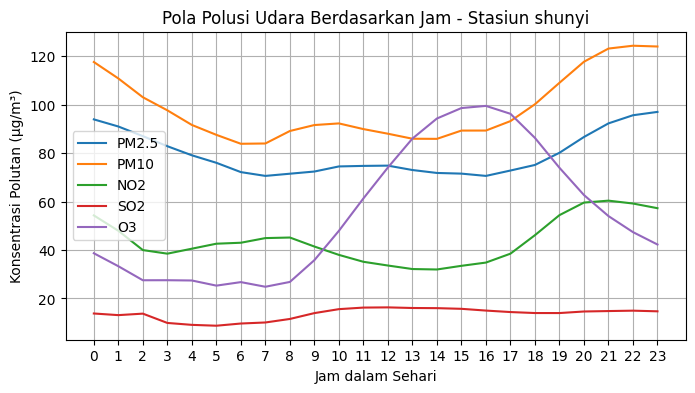

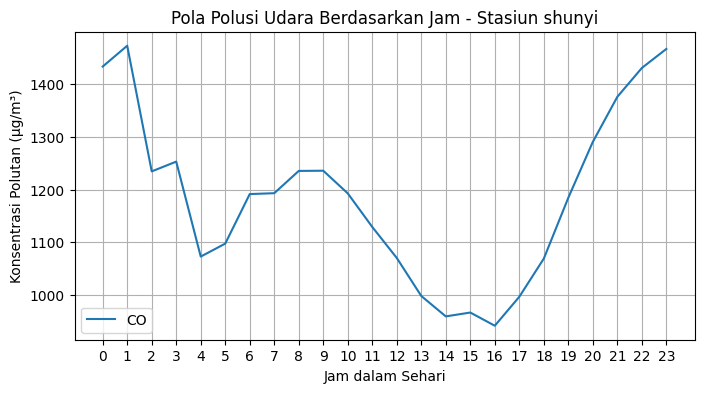

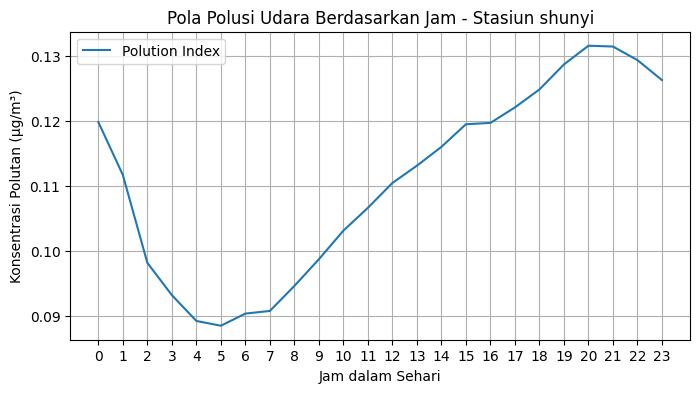

In [94]:
plt.figure(figsize=(8, 4))
pollutants = ['PM2.5', 'PM10', 'NO2', 'SO2', 'CO','O3']

for pol in pollutants:
    if pol == 'CO':
      continue
    plt.plot(shunyi_hourly_pollutants_df.index, shunyi_hourly_pollutants_df[pol], label=pol)

plt.xticks(range(0, 24, 1))  # Tampilkan setiap jam
plt.xlabel("Jam dalam Sehari")
plt.ylabel("Konsentrasi Polutan (µg/m³)")
plt.title("Pola Polusi Udara Berdasarkan Jam - Stasiun shunyi")
plt.legend()
plt.grid()
plt.show()

plt.figure(figsize=(8, 4))
plt.plot(shunyi_hourly_pollutants_df.index, shunyi_hourly_pollutants_df['CO'],label='CO')
plt.xticks(range(0, 24, 1))  # Tampilkan setiap jam
plt.xlabel("Jam dalam Sehari")
plt.ylabel("Konsentrasi Polutan (µg/m³)")
plt.title("Pola Polusi Udara Berdasarkan Jam - Stasiun shunyi")
plt.legend()
plt.grid()
plt.show()


# Rata-rata polusi keseluruhan
shunyi_hourly_pollution_df = shunyi_df.groupby('hour')['pollution_index'].mean()

plt.figure(figsize=(8, 4))
plt.plot(shunyi_hourly_pollution_df.index, shunyi_hourly_pollution_df ,label='Polution Index')
plt.xticks(range(0, 24, 1))  # Tampilkan setiap jam
plt.xlabel("Jam dalam Sehari")
plt.ylabel("Konsentrasi Polutan (µg/m³)")
plt.title("Pola Polusi Udara Berdasarkan Jam - Stasiun shunyi")
plt.legend()
plt.grid()
plt.show()

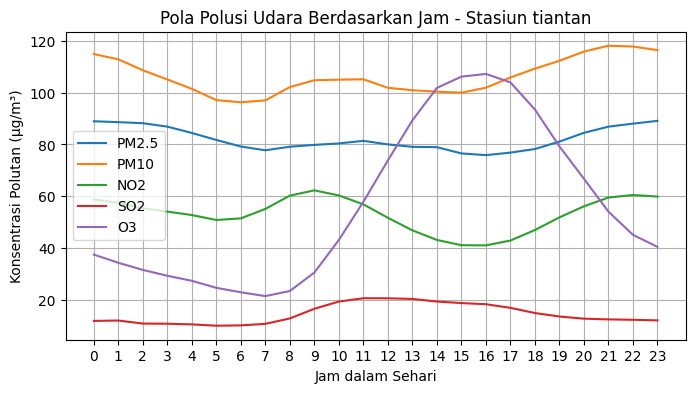

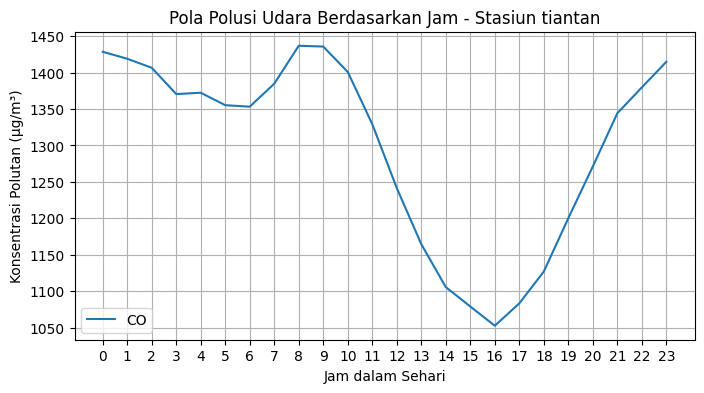

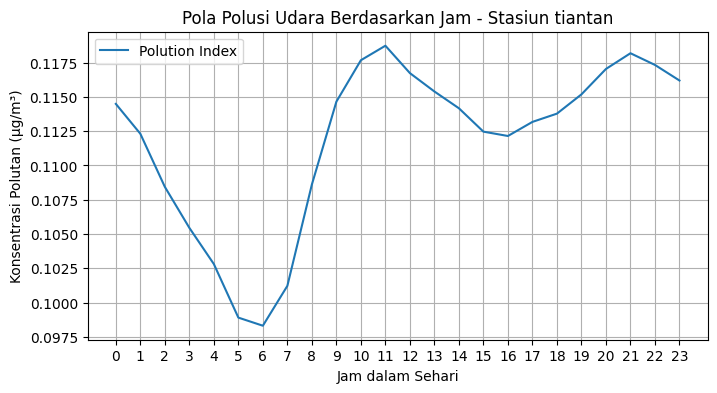

In [95]:
plt.figure(figsize=(8, 4))
pollutants = ['PM2.5', 'PM10', 'NO2', 'SO2', 'CO','O3']

for pol in pollutants:
    if pol == 'CO':
      continue
    plt.plot(tiantan_hourly_pollutants_df.index, tiantan_hourly_pollutants_df[pol], label=pol)

plt.xticks(range(0, 24, 1))  # Tampilkan setiap jam
plt.xlabel("Jam dalam Sehari")
plt.ylabel("Konsentrasi Polutan (µg/m³)")
plt.title("Pola Polusi Udara Berdasarkan Jam - Stasiun tiantan")
plt.legend()
plt.grid()
plt.show()

plt.figure(figsize=(8, 4))
plt.plot(tiantan_hourly_pollutants_df.index, tiantan_hourly_pollutants_df['CO'],label='CO')
plt.xticks(range(0, 24, 1))  # Tampilkan setiap jam
plt.xlabel("Jam dalam Sehari")
plt.ylabel("Konsentrasi Polutan (µg/m³)")
plt.title("Pola Polusi Udara Berdasarkan Jam - Stasiun tiantan")
plt.legend()
plt.grid()
plt.show()


# Rata-rata polusi keseluruhan
tiantan_hourly_pollution_df = tiantan_df.groupby('hour')['pollution_index'].mean()

plt.figure(figsize=(8, 4))
plt.plot(tiantan_hourly_pollution_df.index, tiantan_hourly_pollution_df ,label='Polution Index')
plt.xticks(range(0, 24, 1))  # Tampilkan setiap jam
plt.xlabel("Jam dalam Sehari")
plt.ylabel("Konsentrasi Polutan (µg/m³)")
plt.title("Pola Polusi Udara Berdasarkan Jam - Stasiun tiantan")
plt.legend()
plt.grid()
plt.show()

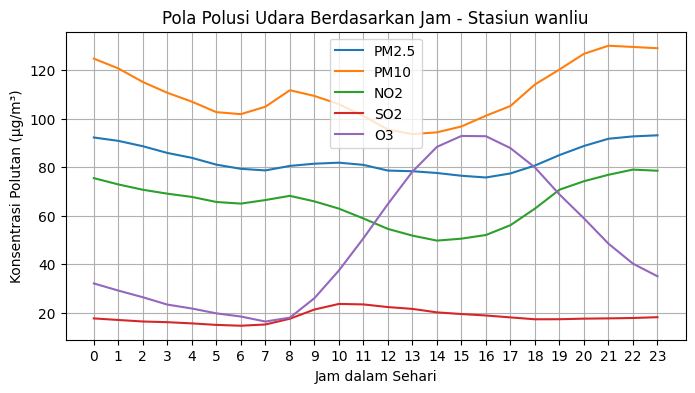

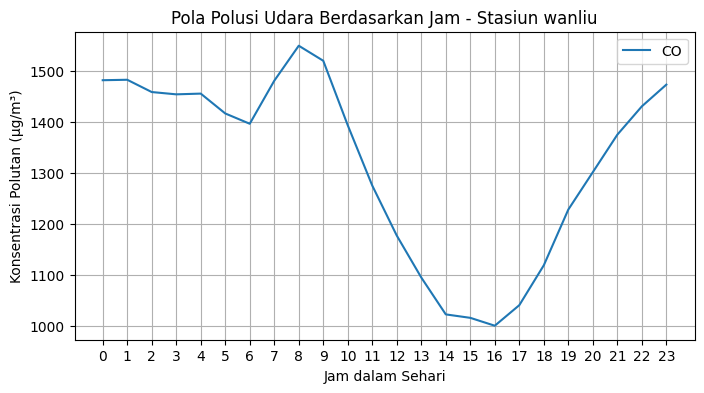

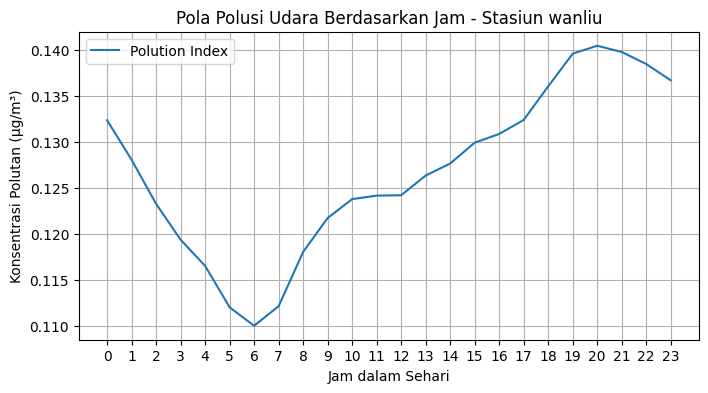

In [96]:
plt.figure(figsize=(8, 4))
pollutants = ['PM2.5', 'PM10', 'NO2', 'SO2', 'CO','O3']

for pol in pollutants:
    if pol == 'CO':
      continue
    plt.plot(wanliu_hourly_pollutants_df.index, wanliu_hourly_pollutants_df[pol], label=pol)

plt.xticks(range(0, 24, 1))  # Tampilkan setiap jam
plt.xlabel("Jam dalam Sehari")
plt.ylabel("Konsentrasi Polutan (µg/m³)")
plt.title("Pola Polusi Udara Berdasarkan Jam - Stasiun wanliu")
plt.legend()
plt.grid()
plt.show()

plt.figure(figsize=(8, 4))
plt.plot(wanliu_hourly_pollutants_df.index, wanliu_hourly_pollutants_df['CO'],label='CO')
plt.xticks(range(0, 24, 1))  # Tampilkan setiap jam
plt.xlabel("Jam dalam Sehari")
plt.ylabel("Konsentrasi Polutan (µg/m³)")
plt.title("Pola Polusi Udara Berdasarkan Jam - Stasiun wanliu")
plt.legend()
plt.grid()
plt.show()


# Rata-rata polusi keseluruhan
wanliu_hourly_pollution_df = wanliu_df.groupby('hour')['pollution_index'].mean()

plt.figure(figsize=(8, 4))
plt.plot(wanliu_hourly_pollution_df.index, wanliu_hourly_pollution_df ,label='Polution Index')
plt.xticks(range(0, 24, 1))  # Tampilkan setiap jam
plt.xlabel("Jam dalam Sehari")
plt.ylabel("Konsentrasi Polutan (µg/m³)")
plt.title("Pola Polusi Udara Berdasarkan Jam - Stasiun wanliu")
plt.legend()
plt.grid()
plt.show()

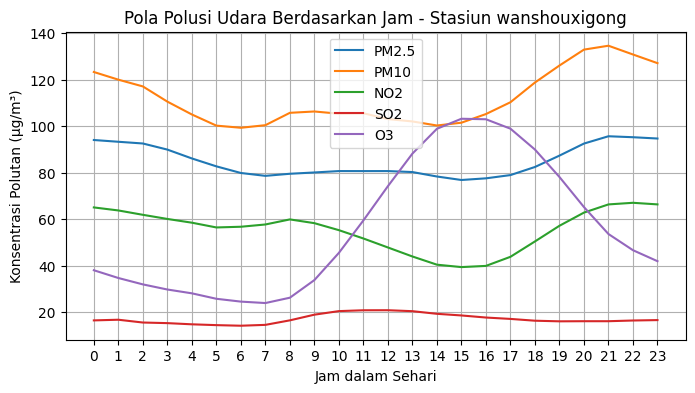

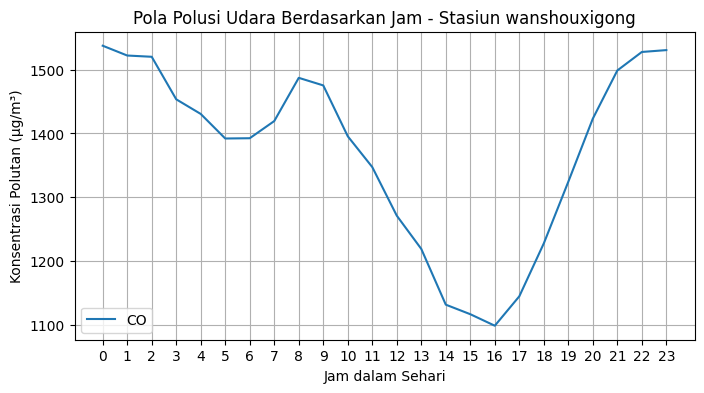

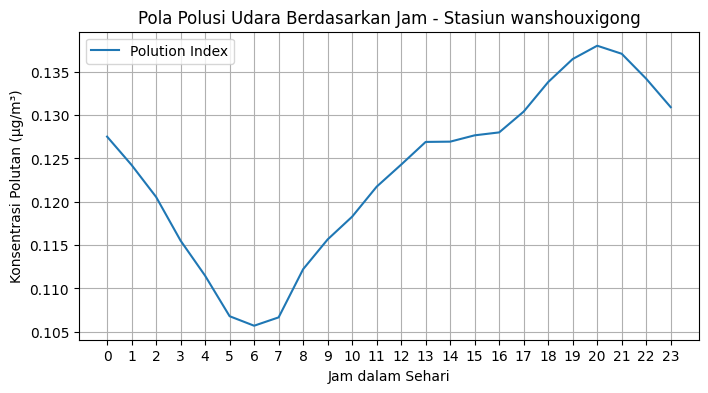

In [97]:
plt.figure(figsize=(8, 4))
pollutants = ['PM2.5', 'PM10', 'NO2', 'SO2', 'CO','O3']

for pol in pollutants:
    if pol == 'CO':
      continue
    plt.plot(wanshouxigong_hourly_pollutants_df.index, wanshouxigong_hourly_pollutants_df[pol], label=pol)

plt.xticks(range(0, 24, 1))  # Tampilkan setiap jam
plt.xlabel("Jam dalam Sehari")
plt.ylabel("Konsentrasi Polutan (µg/m³)")
plt.title("Pola Polusi Udara Berdasarkan Jam - Stasiun wanshouxigong")
plt.legend()
plt.grid()
plt.show()

plt.figure(figsize=(8, 4))
plt.plot(wanshouxigong_hourly_pollutants_df.index, wanshouxigong_hourly_pollutants_df['CO'],label='CO')
plt.xticks(range(0, 24, 1))  # Tampilkan setiap jam
plt.xlabel("Jam dalam Sehari")
plt.ylabel("Konsentrasi Polutan (µg/m³)")
plt.title("Pola Polusi Udara Berdasarkan Jam - Stasiun wanshouxigong")
plt.legend()
plt.grid()
plt.show()


# Rata-rata polusi keseluruhan
wanshouxigong_hourly_pollution_df = wanshouxigong_df.groupby('hour')['pollution_index'].mean()

plt.figure(figsize=(8, 4))
plt.plot(wanshouxigong_hourly_pollution_df.index, wanshouxigong_hourly_pollution_df ,label='Polution Index')
plt.xticks(range(0, 24, 1))  # Tampilkan setiap jam
plt.xlabel("Jam dalam Sehari")
plt.ylabel("Konsentrasi Polutan (µg/m³)")
plt.title("Pola Polusi Udara Berdasarkan Jam - Stasiun wanshouxigong")
plt.legend()
plt.grid()
plt.show()

### Pertanyaan 3: Apa hubungan antara faktor cuaca dengan tingkat polusi udara

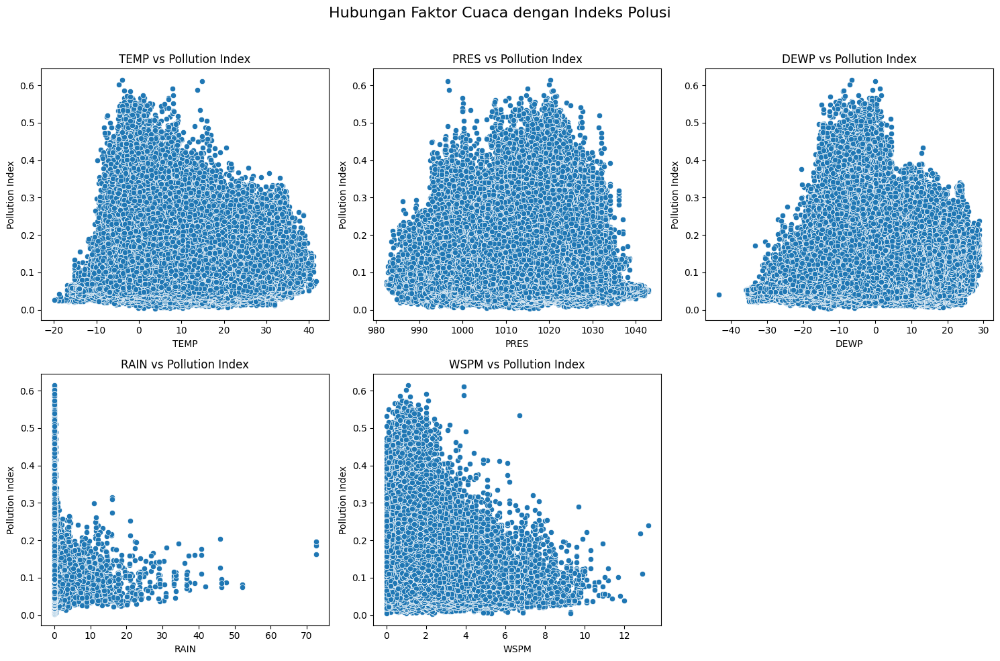

In [98]:
# Pilih kolom faktor cuaca dan indeks polusi
weather_factors = ['TEMP', 'PRES', 'DEWP', 'RAIN', 'WSPM']
target_variable = ['pollution_index']

# Gabungkan data
selected_columns = weather_factors + target_variable

# Buat figure dan axes untuk subplot (2 baris, 3 kolom)
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
fig.suptitle("Hubungan Faktor Cuaca dengan Indeks Polusi", fontsize=16)

# Loop untuk membuat scatter plot tiap faktor cuaca
for i, factor in enumerate(weather_factors):
    row, col = divmod(i, 3)  # Tentukan posisi subplot
    sns.scatterplot(x=all_stations_df[factor].squeeze(), y=all_stations_df[target_variable].squeeze(), ax=axes[row, col])
    axes[row, col].set_title(f"{factor} vs Pollution Index")
    axes[row, col].set_xlabel(factor)
    axes[row, col].set_ylabel("Pollution Index")

# Hapus subplot kosong jika jumlah faktor cuaca kurang dari jumlah subplot
if len(weather_factors) < 6:
    fig.delaxes(axes[1, 2])

plt.tight_layout(rect=[0, 0, 1, 0.96])  # Atur tata letak agar tidak saling tumpang tindih
plt.show()

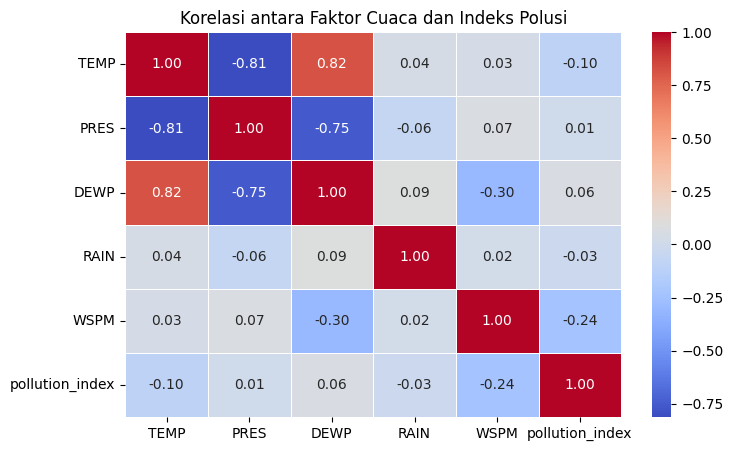

In [99]:
# Filter dataset hanya dengan kolom yang dibutuhkan
weather_pollution_df = all_stations_df[selected_columns].copy()

# Hitung korelasi antar faktor cuaca dan indeks polusi
correlation_matrix = weather_pollution_df.corr()

# Visualisasi korelasi menggunakan heatmap
plt.figure(figsize=(8, 5))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Korelasi antara Faktor Cuaca dan Indeks Polusi")
plt.show()

### Pertanyaan 4:  Bagaimana perbedaan kualitas udara antar stasiun? Apakah dapat dikelompokkan berdasarkan tingkat polusi?


<ipython-input-100-827f7499c928>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="pollution_index", y="station", data=station_pollution_df, palette="inferno")


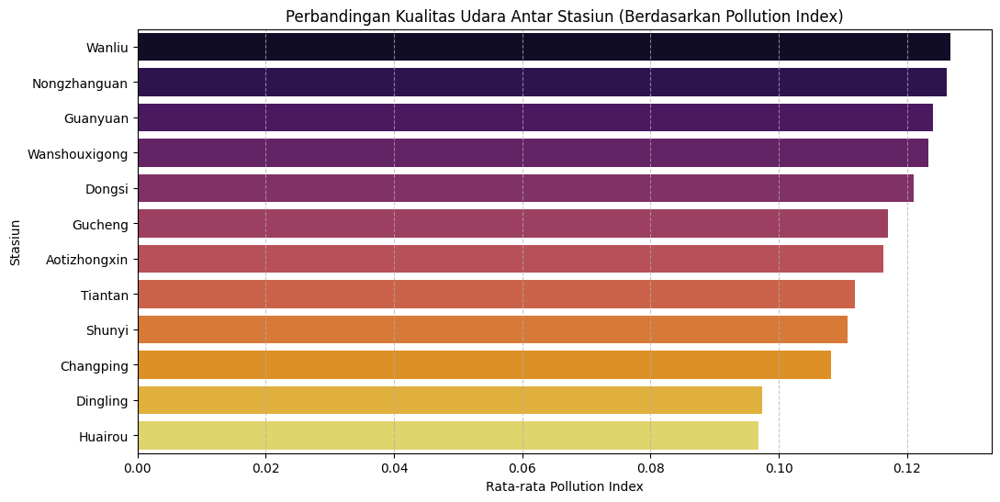

In [100]:
# Kelompokkan data berdasarkan stasiun dan hitung rata-rata pollution_index
station_pollution_df = all_stations_df.groupby("station")[["pollution_index",'TEMP', 'PRES', 'DEWP', 'RAIN', 'WSPM']].mean().reset_index()

# Urutkan berdasarkan nilai pollution_index
station_pollution_df = station_pollution_df.sort_values(by="pollution_index", ascending=False)

# Plot menggunakan bar plot
plt.figure(figsize=(12, 6))
sns.barplot(x="pollution_index", y="station", data=station_pollution_df, palette="inferno")
plt.xlabel("Rata-rata Pollution Index")
plt.ylabel("Stasiun")
plt.title("Perbandingan Kualitas Udara Antar Stasiun (Berdasarkan Pollution Index)")
plt.grid(axis="x", linestyle="--", alpha=0.7)
plt.show()

###**Insight:**
- Pertanyaan dapat terjawab menggunakan visualisasi
- Terdapat analisis lanjutan untuk menjawab pertanyaan

## Analisis Lanjutan (Opsional)

#### Decomposition

Digunakan Analisis lanjutan yaitu decompomposition. Decomposition adalah teknik untuk memisahkan komponen-komponen dalam data time series menjadi beberapa bagian utama:

Trend → Perubahan jangka panjang dalam data.

Seasonal → Pola yang berulang secara periodik.

Residual → Fluktuasi acak atau noise yang tidak bisa dijelaskan oleh trend dan seasonality.

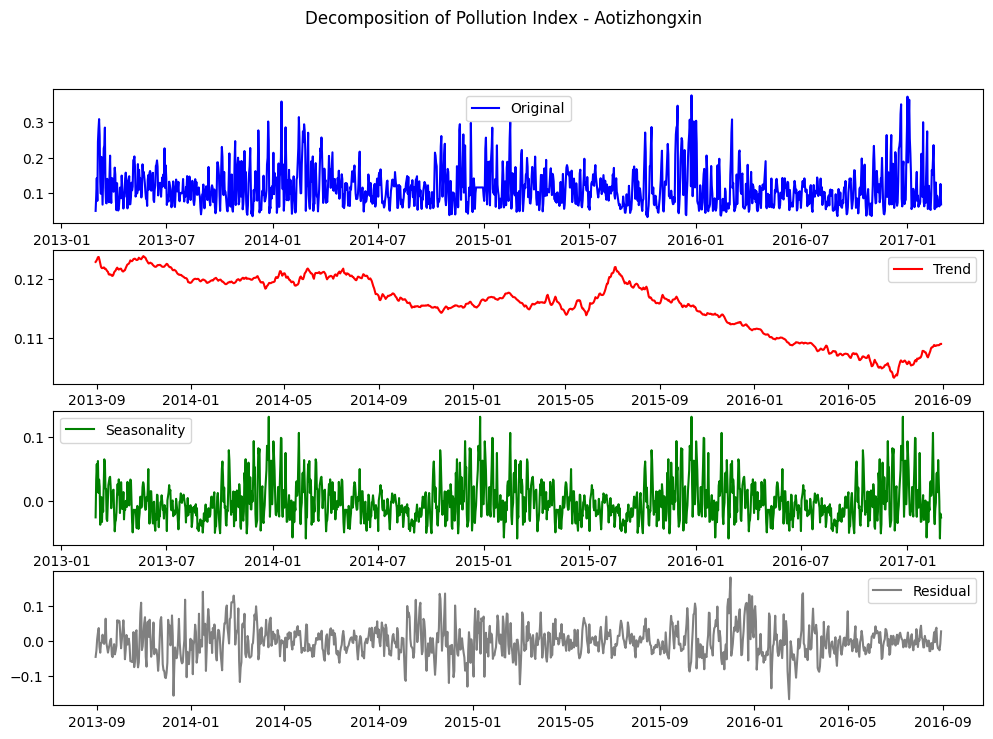

In [101]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose

# Pastikan date sebagai index
aotizhongxin_df.set_index('date', inplace=True)

# Ambil hanya kolom pollution_index dan resample ke harian
pollution_series = aotizhongxin_df['pollution_index'].resample('D').mean()

# Lakukan decomposition
decomposition = seasonal_decompose(pollution_series, model='additive', period=365)

# Plot hasil decomposition
plt.figure(figsize=(12, 8))

plt.subplot(4, 1, 1)
plt.plot(pollution_series, label='Original', color='blue')
plt.legend()

plt.subplot(4, 1, 2)
plt.plot(decomposition.trend, label='Trend', color='red')
plt.legend()

plt.subplot(4, 1, 3)
plt.plot(decomposition.seasonal, label='Seasonality', color='green')
plt.legend()

plt.subplot(4, 1, 4)
plt.plot(decomposition.resid, label='Residual', color='gray')
plt.legend()

plt.suptitle('Decomposition of Pollution Index - Aotizhongxin')
plt.show()


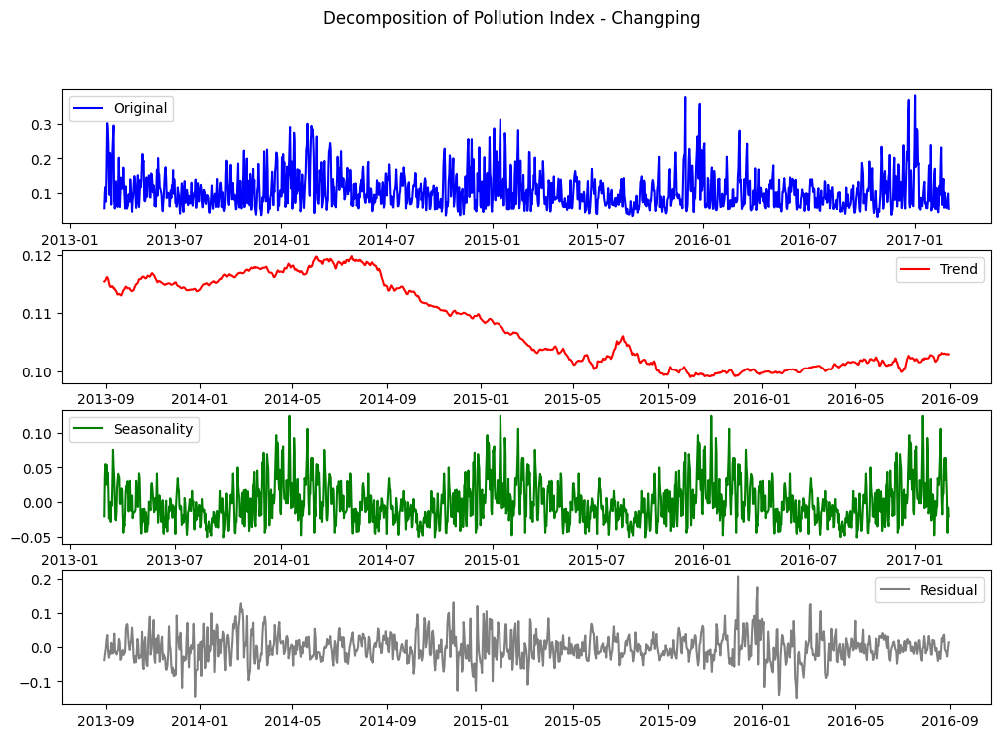

In [102]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose

# Pastikan date sebagai index
changping_df.set_index('date', inplace=True)

# Ambil hanya kolom pollution_index dan resample ke harian
pollution_series = changping_df['pollution_index'].resample('D').mean()

# Lakukan decomposition
decomposition = seasonal_decompose(pollution_series, model='additive', period=365)

# Plot hasil decomposition
plt.figure(figsize=(12, 8))

plt.subplot(4, 1, 1)
plt.plot(pollution_series, label='Original', color='blue')
plt.legend()

plt.subplot(4, 1, 2)
plt.plot(decomposition.trend, label='Trend', color='red')
plt.legend()

plt.subplot(4, 1, 3)
plt.plot(decomposition.seasonal, label='Seasonality', color='green')
plt.legend()

plt.subplot(4, 1, 4)
plt.plot(decomposition.resid, label='Residual', color='gray')
plt.legend()

plt.suptitle('Decomposition of Pollution Index - Changping')
plt.show()


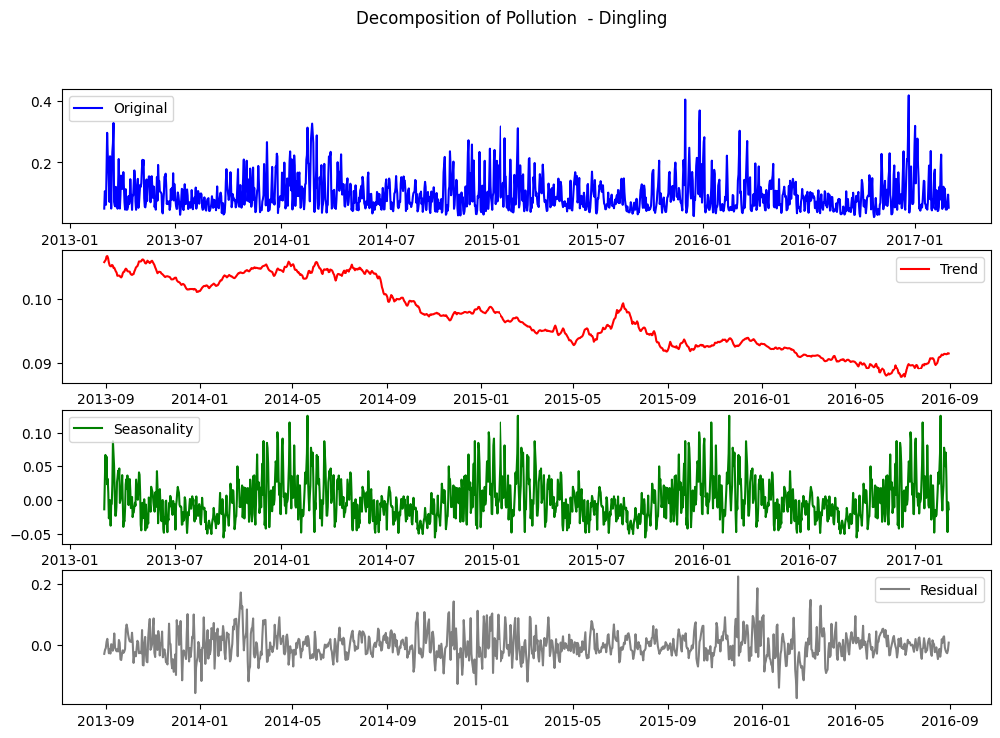

In [103]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose

# Pastikan date sebagai index
dingling_df.set_index('date', inplace=True)

# Ambil hanya kolom pollution_index dan resample ke harian
pollution_series = dingling_df['pollution_index'].resample('D').mean()

# Lakukan decomposition
decomposition = seasonal_decompose(pollution_series, model='additive', period=365)

# Plot hasil decomposition
plt.figure(figsize=(12, 8))

plt.subplot(4, 1, 1)
plt.plot(pollution_series, label='Original', color='blue')
plt.legend()

plt.subplot(4, 1, 2)
plt.plot(decomposition.trend, label='Trend', color='red')
plt.legend()

plt.subplot(4, 1, 3)
plt.plot(decomposition.seasonal, label='Seasonality', color='green')
plt.legend()

plt.subplot(4, 1, 4)
plt.plot(decomposition.resid, label='Residual', color='gray')
plt.legend()

plt.suptitle('Decomposition of Pollution  - Dingling')
plt.show()


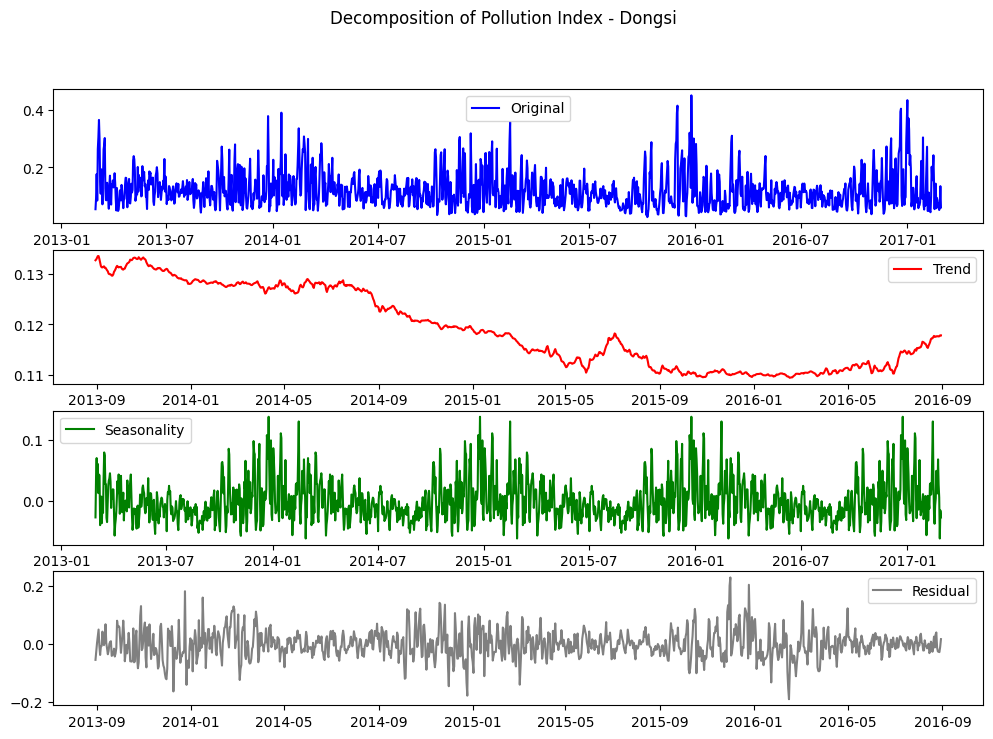

In [104]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose

# Pastikan date sebagai index
dongsi_df.set_index('date', inplace=True)

# Ambil hanya kolom pollution_index dan resample ke harian
pollution_series = dongsi_df['pollution_index'].resample('D').mean()

# Lakukan decomposition
decomposition = seasonal_decompose(pollution_series, model='additive', period=365)

# Plot hasil decomposition
plt.figure(figsize=(12, 8))

plt.subplot(4, 1, 1)
plt.plot(pollution_series, label='Original', color='blue')
plt.legend()

plt.subplot(4, 1, 2)
plt.plot(decomposition.trend, label='Trend', color='red')
plt.legend()

plt.subplot(4, 1, 3)
plt.plot(decomposition.seasonal, label='Seasonality', color='green')
plt.legend()

plt.subplot(4, 1, 4)
plt.plot(decomposition.resid, label='Residual', color='gray')
plt.legend()

plt.suptitle('Decomposition of Pollution Index - Dongsi')
plt.show()


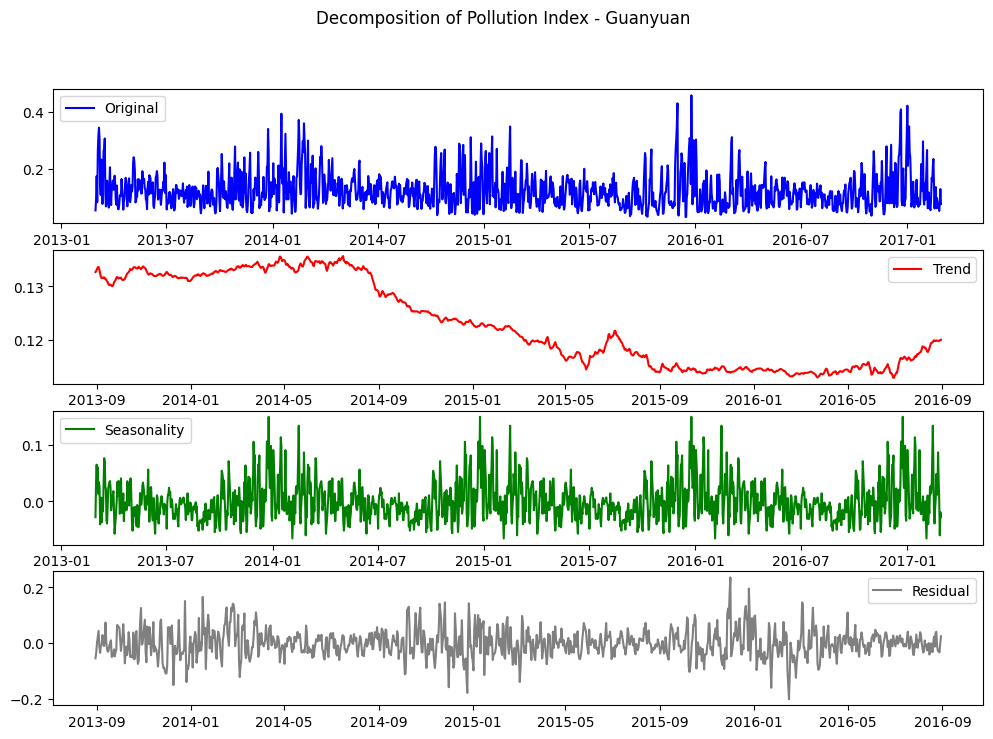

In [105]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose

# Pastikan date sebagai index
guanyuan_df.set_index('date', inplace=True)

# Ambil hanya kolom pollution_index dan resample ke harian
pollution_series = guanyuan_df['pollution_index'].resample('D').mean()

# Lakukan decomposition
decomposition = seasonal_decompose(pollution_series, model='additive', period=365)

# Plot hasil decomposition
plt.figure(figsize=(12, 8))

plt.subplot(4, 1, 1)
plt.plot(pollution_series, label='Original', color='blue')
plt.legend()

plt.subplot(4, 1, 2)
plt.plot(decomposition.trend, label='Trend', color='red')
plt.legend()

plt.subplot(4, 1, 3)
plt.plot(decomposition.seasonal, label='Seasonality', color='green')
plt.legend()

plt.subplot(4, 1, 4)
plt.plot(decomposition.resid, label='Residual', color='gray')
plt.legend()

plt.suptitle('Decomposition of Pollution Index - Guanyuan')
plt.show()


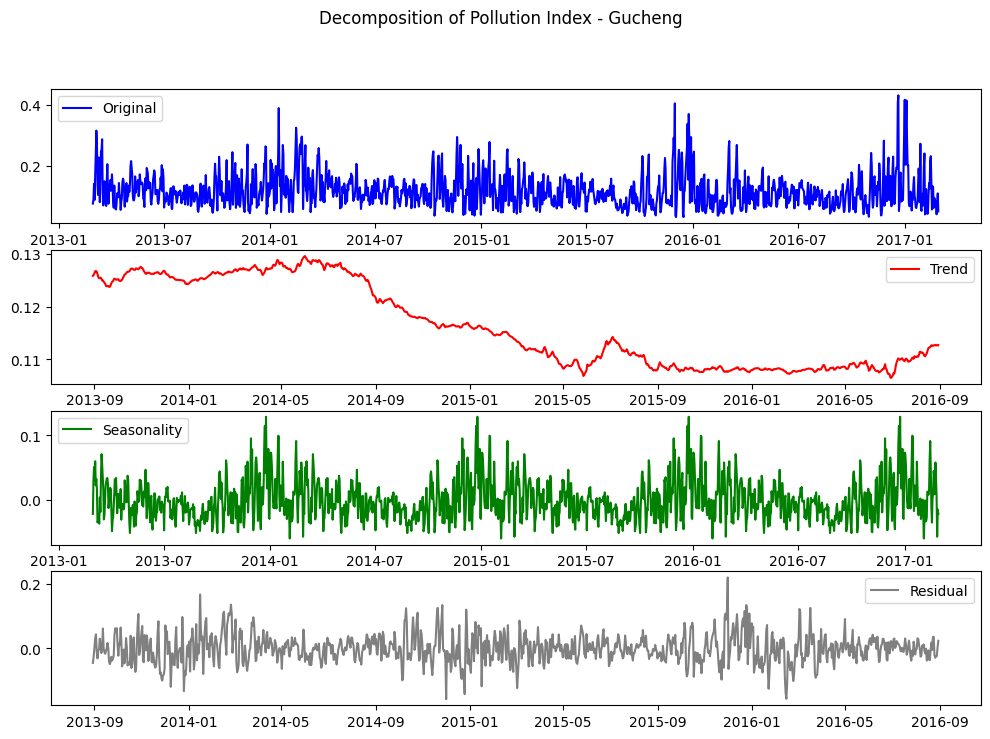

In [106]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose

# Pastikan date sebagai index
gucheng_df.set_index('date', inplace=True)

# Ambil hanya kolom pollution_index dan resample ke harian
pollution_series = gucheng_df['pollution_index'].resample('D').mean()

# Lakukan decomposition
decomposition = seasonal_decompose(pollution_series, model='additive', period=365)

# Plot hasil decomposition
plt.figure(figsize=(12, 8))

plt.subplot(4, 1, 1)
plt.plot(pollution_series, label='Original', color='blue')
plt.legend()

plt.subplot(4, 1, 2)
plt.plot(decomposition.trend, label='Trend', color='red')
plt.legend()

plt.subplot(4, 1, 3)
plt.plot(decomposition.seasonal, label='Seasonality', color='green')
plt.legend()

plt.subplot(4, 1, 4)
plt.plot(decomposition.resid, label='Residual', color='gray')
plt.legend()

plt.suptitle('Decomposition of Pollution Index - Gucheng')
plt.show()


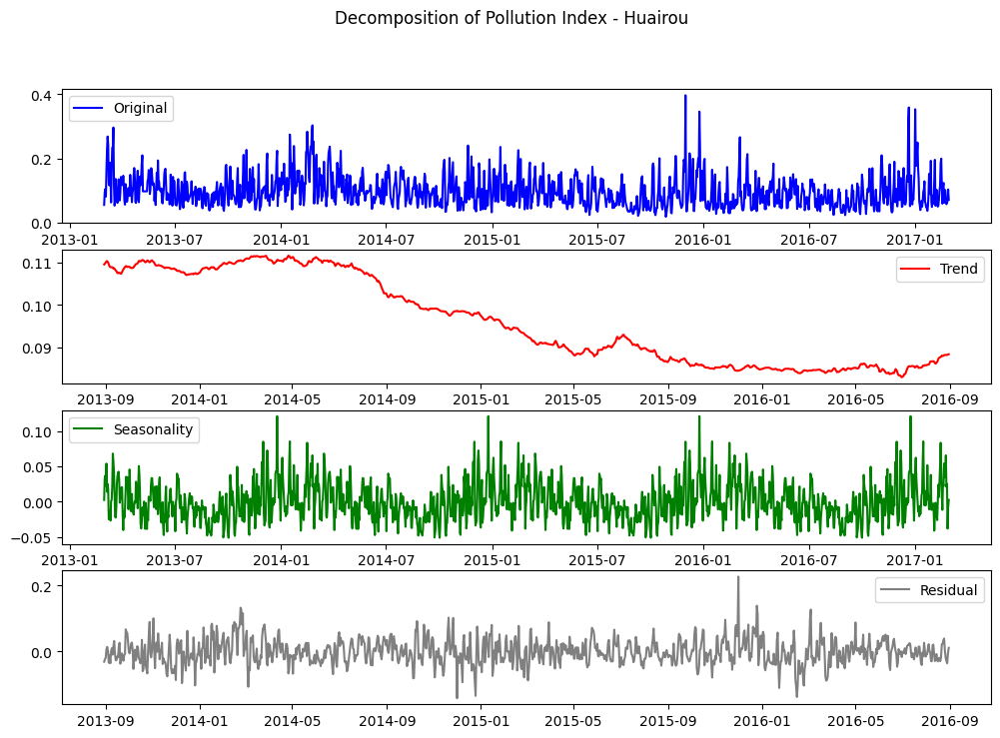

In [107]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose

# Pastikan date sebagai index
huairou_df.set_index('date', inplace=True)

# Ambil hanya kolom pollution_index dan resample ke harian
pollution_series = huairou_df['pollution_index'].resample('D').mean()

# Lakukan decomposition
decomposition = seasonal_decompose(pollution_series, model='additive', period=365)

# Plot hasil decomposition
plt.figure(figsize=(12, 8))

plt.subplot(4, 1, 1)
plt.plot(pollution_series, label='Original', color='blue')
plt.legend()

plt.subplot(4, 1, 2)
plt.plot(decomposition.trend, label='Trend', color='red')
plt.legend()

plt.subplot(4, 1, 3)
plt.plot(decomposition.seasonal, label='Seasonality', color='green')
plt.legend()

plt.subplot(4, 1, 4)
plt.plot(decomposition.resid, label='Residual', color='gray')
plt.legend()

plt.suptitle('Decomposition of Pollution Index - Huairou')
plt.show()


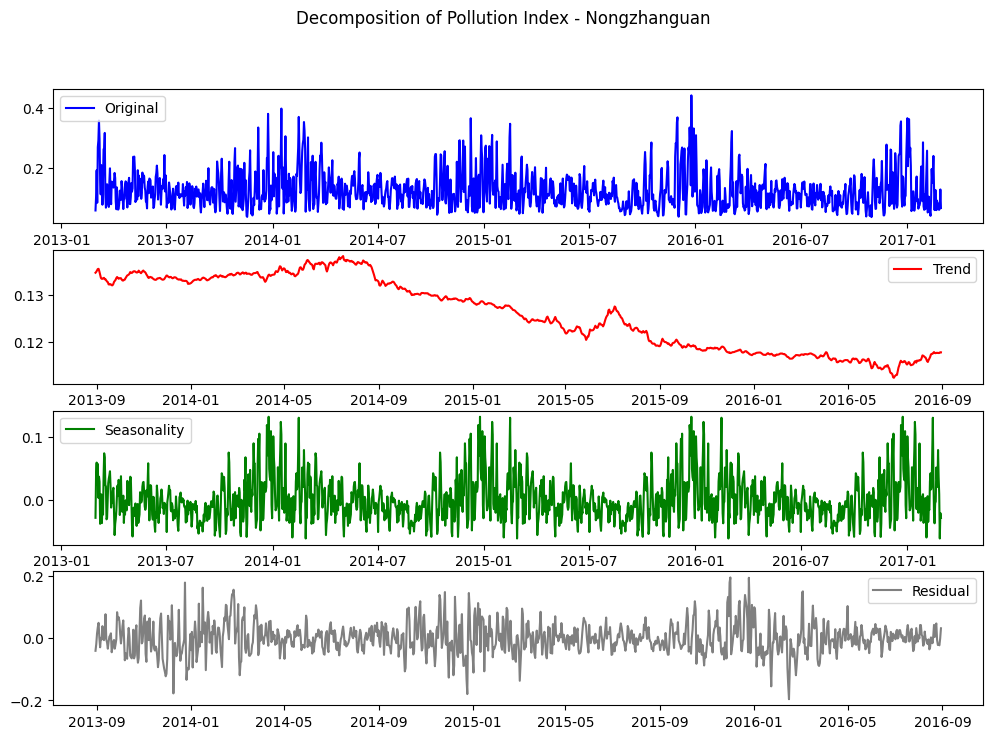

In [108]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose

# Pastikan date sebagai index
nongzhanguan_df.set_index('date', inplace=True)

# Ambil hanya kolom pollution_index dan resample ke harian
pollution_series = nongzhanguan_df['pollution_index'].resample('D').mean()

# Lakukan decomposition
decomposition = seasonal_decompose(pollution_series, model='additive', period=365)

# Plot hasil decomposition
plt.figure(figsize=(12, 8))

plt.subplot(4, 1, 1)
plt.plot(pollution_series, label='Original', color='blue')
plt.legend()

plt.subplot(4, 1, 2)
plt.plot(decomposition.trend, label='Trend', color='red')
plt.legend()

plt.subplot(4, 1, 3)
plt.plot(decomposition.seasonal, label='Seasonality', color='green')
plt.legend()

plt.subplot(4, 1, 4)
plt.plot(decomposition.resid, label='Residual', color='gray')
plt.legend()

plt.suptitle('Decomposition of Pollution Index - Nongzhanguan')
plt.show()


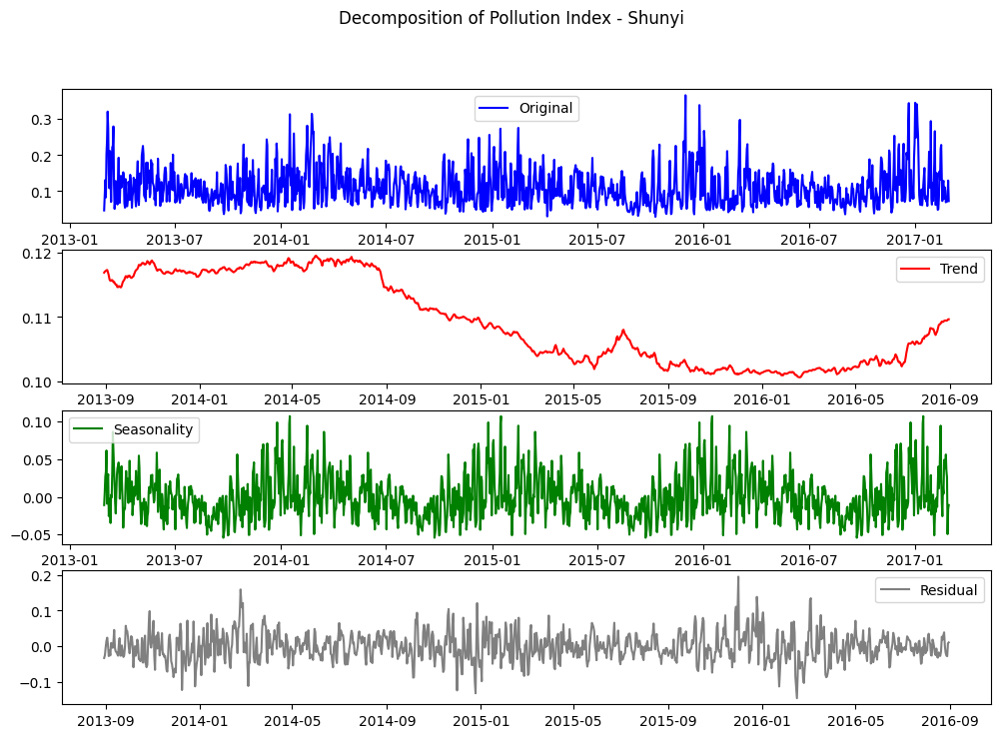

In [109]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose

# Pastikan date sebagai index
shunyi_df.set_index('date', inplace=True)

# Ambil hanya kolom pollution_index dan resample ke harian
pollution_series = shunyi_df['pollution_index'].resample('D').mean()

# Lakukan decomposition
decomposition = seasonal_decompose(pollution_series, model='additive', period=365)

# Plot hasil decomposition
plt.figure(figsize=(12, 8))

plt.subplot(4, 1, 1)
plt.plot(pollution_series, label='Original', color='blue')
plt.legend()

plt.subplot(4, 1, 2)
plt.plot(decomposition.trend, label='Trend', color='red')
plt.legend()

plt.subplot(4, 1, 3)
plt.plot(decomposition.seasonal, label='Seasonality', color='green')
plt.legend()

plt.subplot(4, 1, 4)
plt.plot(decomposition.resid, label='Residual', color='gray')
plt.legend()

plt.suptitle('Decomposition of Pollution Index - Shunyi')
plt.show()


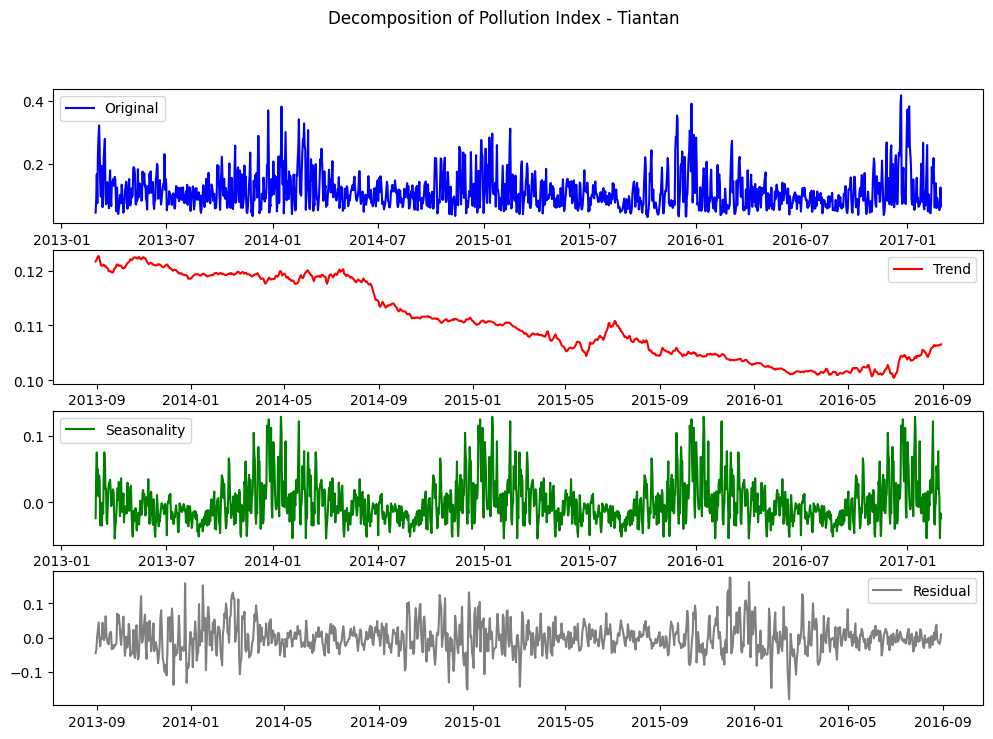

In [110]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose

# Pastikan date sebagai index
tiantan_df.set_index('date', inplace=True)

# Ambil hanya kolom pollution_index dan resample ke harian
pollution_series = tiantan_df['pollution_index'].resample('D').mean()

# Lakukan decomposition
decomposition = seasonal_decompose(pollution_series, model='additive', period=365)

# Plot hasil decomposition
plt.figure(figsize=(12, 8))

plt.subplot(4, 1, 1)
plt.plot(pollution_series, label='Original', color='blue')
plt.legend()

plt.subplot(4, 1, 2)
plt.plot(decomposition.trend, label='Trend', color='red')
plt.legend()

plt.subplot(4, 1, 3)
plt.plot(decomposition.seasonal, label='Seasonality', color='green')
plt.legend()

plt.subplot(4, 1, 4)
plt.plot(decomposition.resid, label='Residual', color='gray')
plt.legend()

plt.suptitle('Decomposition of Pollution Index - Tiantan')
plt.show()


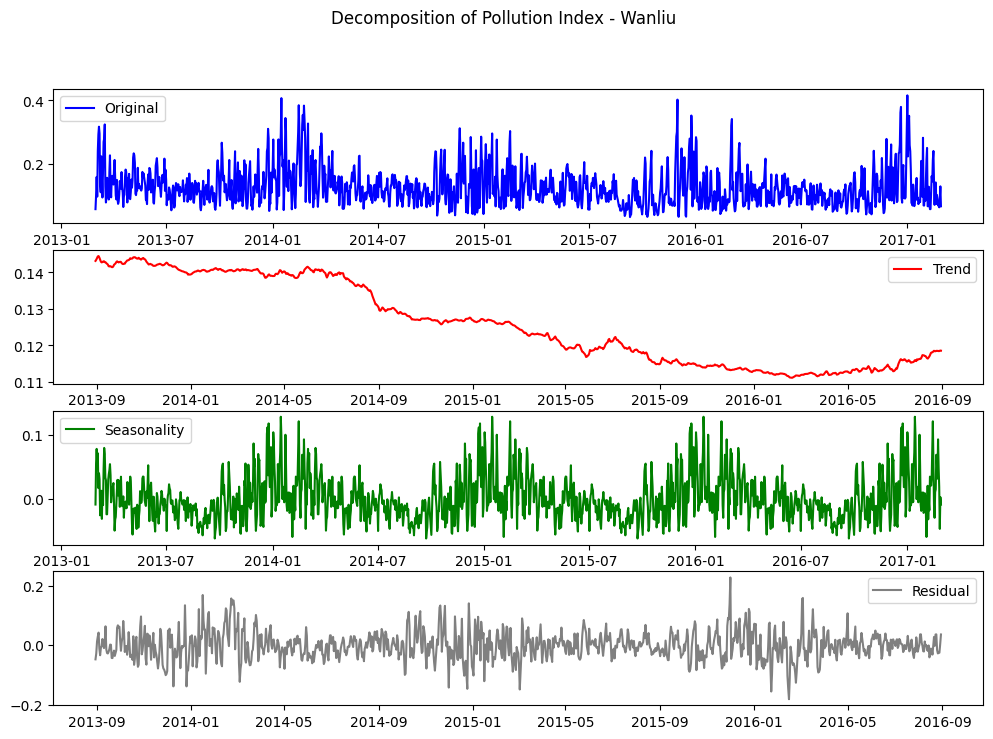

In [111]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose

# Pastikan date sebagai index
wanliu_df.set_index('date', inplace=True)

# Ambil hanya kolom pollution_index dan resample ke harian
pollution_series = wanliu_df['pollution_index'].resample('D').mean()

# Lakukan decomposition
decomposition = seasonal_decompose(pollution_series, model='additive', period=365)

# Plot hasil decomposition
plt.figure(figsize=(12, 8))

plt.subplot(4, 1, 1)
plt.plot(pollution_series, label='Original', color='blue')
plt.legend()

plt.subplot(4, 1, 2)
plt.plot(decomposition.trend, label='Trend', color='red')
plt.legend()

plt.subplot(4, 1, 3)
plt.plot(decomposition.seasonal, label='Seasonality', color='green')
plt.legend()

plt.subplot(4, 1, 4)
plt.plot(decomposition.resid, label='Residual', color='gray')
plt.legend()

plt.suptitle('Decomposition of Pollution Index - Wanliu')
plt.show()


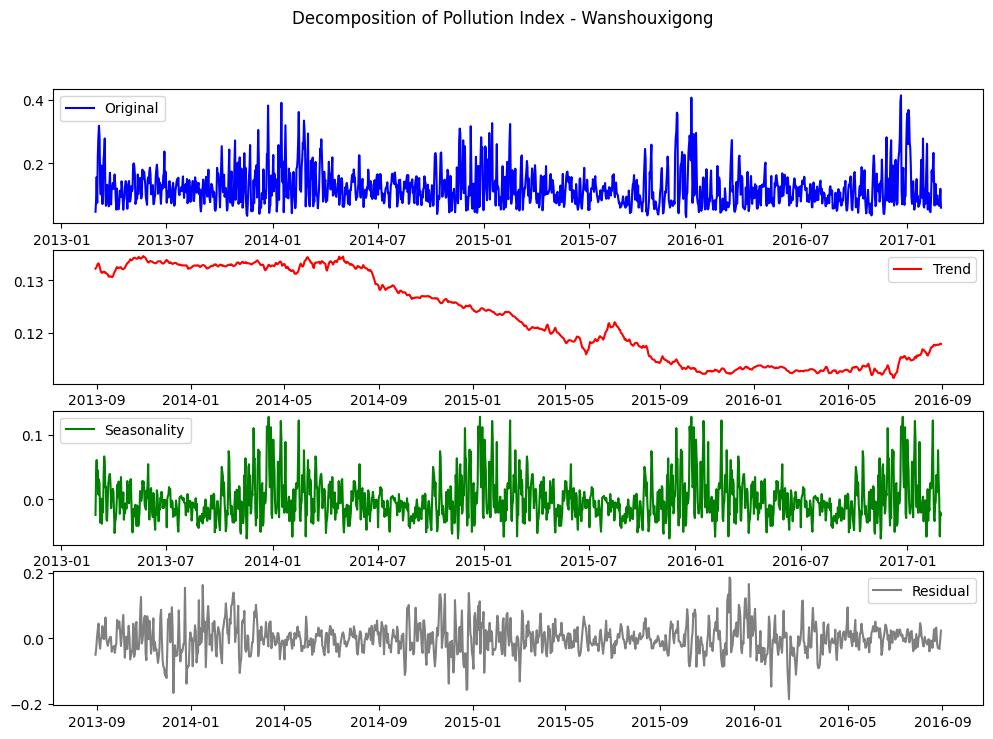

In [112]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose

# Pastikan date sebagai index
wanshouxigong_df.set_index('date', inplace=True)

# Ambil hanya kolom pollution_index dan resample ke harian
pollution_series = wanshouxigong_df['pollution_index'].resample('D').mean()

# Lakukan decomposition
decomposition = seasonal_decompose(pollution_series, model='additive', period=365)

# Plot hasil decomposition
plt.figure(figsize=(12, 8))

plt.subplot(4, 1, 1)
plt.plot(pollution_series, label='Original', color='blue')
plt.legend()

plt.subplot(4, 1, 2)
plt.plot(decomposition.trend, label='Trend', color='red')
plt.legend()

plt.subplot(4, 1, 3)
plt.plot(decomposition.seasonal, label='Seasonality', color='green')
plt.legend()

plt.subplot(4, 1, 4)
plt.plot(decomposition.resid, label='Residual', color='gray')
plt.legend()

plt.suptitle('Decomposition of Pollution Index - Wanshouxigong')
plt.show()


Dengan menggunakan decomposition, dapat dilihat tren, seasonal, dan residualnya.

trend menunjukkan bahwa rata-rata setiap stasiun polusi udaranya meningkat sedikit lalu menurun sampai 2016 akhir, dan kemudian naik lagi.

seasonal menunjukkan bahwa rata-rata stasiun naik tingkat polusinya setiap 2 tahun.

residual menunjukkan adanya bagian dari data yang tidak dapat dijelaskan secara statistik, dapat disebabkan oleh peristiwa luar biasa atau error dalam pengukurannya.

#### Clustering

Clustering dilakukan untuk mengelompokkan sesuatu berdasarkan parameter-parameter yang terdapat di dataset. Stasiun-stasiun yang ada di dataset dikelompokkan berdasarkan tingkat polusi udaranya.

Clustering disini dilakukan menggunakan K-Means dengan tujuan untuk mengelompokkan stasiun berdasarkan pollution index (indeks polusi). Mula-mula dilakukan normalisasi data lalu menentukan jumlah cluster dengan elbow method. Setelah itu dilakukan clustering yang menghasilkan 3 kelompok yang diberi nama polusi tinggi, polusi sedang, dan polusi rendah. Kemudian, dilakukan visualisasi dengan bar plot. Clustering ini juga dapat menjawab pertanyaan nomor 4 yang berkaitan dengan pengelompokkan stasiun berdasarkan tingkat polusi.

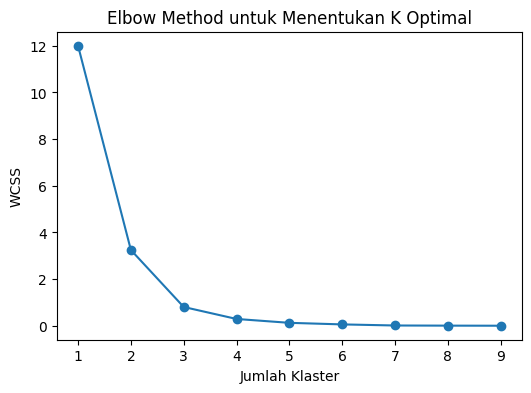

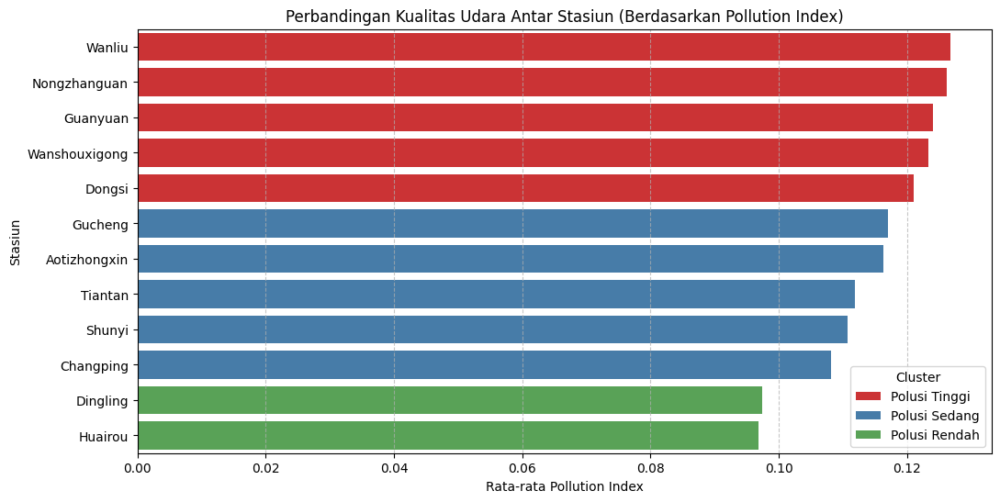

In [113]:
from sklearn.cluster import KMeans
import seaborn as sns

# Normalisasi data
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
station_pollution_df["pollution_scaled"] = scaler.fit_transform(station_pollution_df[["pollution_index"]])

# Menentukan jumlah klaster optimal dengan Elbow Method
wcss = []
for i in range(1, 10):
    kmeans = KMeans(n_clusters=i, random_state=42, n_init=10)
    kmeans.fit(station_pollution_df[["pollution_scaled"]])
    wcss.append(kmeans.inertia_)

# Plot Elbow Method
plt.figure(figsize=(6,4))
plt.plot(range(1, 10), wcss, marker='o')
plt.xlabel("Jumlah Klaster")
plt.ylabel("WCSS")
plt.title("Elbow Method untuk Menentukan K Optimal")
plt.show()
print()

# Misalnya kita pilih 3 klaster berdasarkan elbow
kmeans = KMeans(n_clusters=3, random_state=42, n_init=10)
station_pollution_df["cluster"] = kmeans.fit_predict(station_pollution_df[["pollution_scaled"]])

# Buat mapping untuk mengganti angka klaster dengan label yang lebih bermakna
cluster_labels = {
    0: "Polusi Sedang",
    1: "Polusi Rendah",
    2: "Polusi Tinggi"
}

# Ganti label klaster
station_pollution_df["cluster_labels"] = station_pollution_df["cluster"].replace(cluster_labels)

# Urutkan berdasarkan index polusi
station_pollution_df = station_pollution_df.sort_values(by="pollution_index", ascending=False)

# Visualisasi hasil clustering dengan bar plot
plt.figure(figsize=(12, 6))
sns.barplot(x="pollution_index", y="station", data=station_pollution_df, hue='cluster_labels', palette="Set1")
plt.xlabel("Rata-rata Pollution Index")
plt.ylabel("Stasiun")
plt.title("Perbandingan Kualitas Udara Antar Stasiun (Berdasarkan Pollution Index)")
plt.grid(axis="x", linestyle="--", alpha=0.7)
plt.legend(title='Cluster')
plt.show()


## Conclusion

- Conclution pertanyaan 1

  Bagaimana tren kualitas udara sepanjang tahun?

  Tren kualitas udara pada setiap stasiun sepanjang tahun awalnya naik, lalu cenderung turun dalam kurun waktu yang lama, kemudian naik lagi.

- Conclution pertanyaan 2

  Apakah ada pola polusi udara berdasarkan jam dalam sehari? Polusi udara cenderung rendah pada malam hari dan naik menjadi tinggi pada siang hari. Polutan-polutan konsentrasinya konstan pada setiap jam kecuali C3 dan CO. CO akan turun pada siang hari, sedankang C3 akan naik pada siang hari.

- Conclution pertanyaan 3

  Apa ada hubungan antara faktor cuaca dengan tingkat polusi udara?

  Faktor cuaca dan tingkat polusi udara tidak terlalu berkaitan. Ada yang sedikit berkaitan yaitu temperatur dan kecepatan angin. Kedua parameter tersebut memiliki sedikit negative correlation dengan index polusi.

- Conclution pertanyaan 4

  Tingkat polusi setiap stasiun berbeda-beda dan dapat dikelompokkan berdasarkan index polusi. Wangliu, Nongzhanguan, Guanyuan, Wanshouxigong, dan Dongsi merupakan stasiun dengan polusi tertinggi dan masuk ke cluster polusi tinggi. Disususul oleh Gucheng, Aotizhongxin, Tiantan, Shunyi, Changping yang termasuk cluster polusi sedang. Kemudian Dingling dan Huairou menempati cluster polusi rendah.
